# 삼박자 - 최종 프로젝트

In [1]:
# 20250109 샘플 데이터셋 전처리 밑작업
# 20250113 전처리 코드 정리 & EDA 시각화 추가
# 20250115 skinsort 브랜드 관련 데이터 추가
# 20250116 아마존 최종 데이터로 전처리 등 코드 수정
# 20250120 중간정리본 1차 정리 완료, 선정 브랜드 및 성분 관련 작업 추가 + 코드 진행에 따른 주석 추가
# 20250121 토픽 모델링 코드 추가 + 테스트 진행, 추가 코드 및 아웃라인 정리 + 추가 EDA 가능한 부분 주석 작성 + 카테고리별 시각화 제거 (이유 : 카테고리별 분류가 큰 의미가 없기 때문), 브랜드별 감성 분석 후 워드클라우드
# 20250122 중간 제출을 위한 코드 및 주석 정리
# 20250127 처음~토픽 모델링까지 정리 후 심화 분석 연결 작업 시작

# PART 1: Data Preprocessing

## Import library & Load data

In [ ]:
# # 구글 드라이브 마운트
# from google.colab import drive
# drive.mount('/content/drive')

# 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import datetime
import re
import string
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer

from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

# CWD = os.getcwd()
# DATA_PATH = "./dataset/"
# print("현재 경로: ", CWD)

# # pandas csv 읽어오는 함수
# def load_data(data_path, file):
#     path = os.path.join(data_path, file)
#     return pd.read_csv(path)

# # 데이터셋 읽어오기
# dr_items = load_data(DATA_PATH,'Dr_jart_items.csv')
# dr_reviews = load_data(DATA_PATH,'Dr_jart_reviews.csv')
# cs_items = load_data(DATA_PATH,'cosrx_items.csv')
# cs_reviews = load_data(DATA_PATH,'cosrx_reviews.csv')
# if_items = load_data(DATA_PATH,'imfrom_items.csv')
# if_reviews = load_data(DATA_PATH,'imfrom_reviews.csv')
# bj_items = load_data(DATA_PATH,'joseon_items.csv')
# bj_reviews = load_data(DATA_PATH,'joseon_reviews.csv')
# pu_items = load_data(DATA_PATH,'purito_items.csv')
# pu_reviews = load_data(DATA_PATH,'purito_reviews.csv')
# skinsort = load_data(DATA_PATH,'skinsort_0115.csv')

In [7]:
# 표준 데이터 위치 사용 (gdrive 백업이 아닌 canonical data/amazon/)
from util.repo_paths import AMAZON
os.chdir(AMAZON)


# 데이터셋 불러오기
dr_items = pd.read_csv('Dr_jart_items.csv')
dr_reviews = pd.read_csv('Dr_jart_reviews.csv')
cs_items = pd.read_csv('cosrx_items.csv')
cs_reviews = pd.read_csv('cosrx_reviews.csv')
if_items = pd.read_csv('imfrom_items.csv')
if_reviews = pd.read_csv('imfrom_reviews.csv')
bj_items = pd.read_csv('joseon_items.csv')
bj_reviews = pd.read_csv('joseon_reviews.csv')
pu_items = pd.read_csv('purito_items.csv')
pu_reviews = pd.read_csv('purito_reviews.csv')
skinsort = pd.read_csv('skinsort_0115.csv')

## Data Overview

In [8]:
# 전체적인 데이터 정보 EDA
def eda_overveiw(df):

    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)

    print(f"\n=================== DATA OVERVIEW ===================")

    # 데이터 상단부 확인
    print("\n----------------- Head -----------------")
    print(df.head())
    print("=" * 60)

    # 데이터 정보 및 크기 확인
    print("\n--------------- Information ---------------")
    print(df.info())
    print(f"\nSize: {df.size}")
    print(f"Shape: {df.shape}")
    print("=" * 60)

    # 결측치 확인
    print("\n--------------- Missing Values ---------------")
    print(df.isnull().sum())
    print("=" * 60)

    # 중복값 확인
    print("\n--------------- Duplicate Values ---------------")
    print(df.duplicated().value_counts())
    print("=" * 60)

    # 데이터 기술통계량 확인 (int, float type)
    print("\n------------ Descriptive Statistics (Numeric) ------------")
    print(df.describe())
    print("=" * 60)

    # 데이터 기술통계량 확인 (object type)
    print("\n------------ Descriptive Statistics (Categorical) ------------")

    try:
        print(df.describe(include=[object]))

    except:
        object_cols = df.select_dtypes(include=['object']).columns
        error_cols = []

        for col in object_cols:
            if df[col].apply(lambda x: isinstance(x, (list, dict))).any():
                error_cols.append(col)
        print(f"{error_cols} Excluded")
        print(df.loc[:, ~df.columns.isin(error_cols)].describe(include=[object]))

    print("=" * 60)

eda_overveiw(dr_items)


=================== DATA OVERVIEW ===================

----------------- Head -----------------
         ASIN                                              title  order  \
0  B07DR5816K  Dr.Jart+ Cicapair Tiger Grass Color Correcting...      1   
1  B07GTMPYSG  Dr.Jart+ Cicapair Tiger Grass Color Correcting...      1   
2  B081SRDRD7  Dr.Jart+ Cryo Rubber Brightening Face Mask | K...      6   
3  B081SRSNWW  Dr.Jart+ Cryo Rubber Face Mask with Moisturizi...      2   
4  B084Z4W4PK  Dr.Jart+ Dermask Micro Jet Brightening Solutio...     27   

             category     brand  price  global_rating_count  \
0              Makeup  Dr.Jart+   54.0                 3367   
1  Skin Care Products  Dr.Jart+   25.0                 3367   
2  Skin Care Products  Dr.Jart+   16.0                   77   
3  Skin Care Products  Dr.Jart+   16.0                  373   
4  Skin Care Products  Dr.Jart+   10.0                   37   

                                         description  \
0  {"Benefits": "

## Data Cleaning

### Copied Dataset

In [9]:
# 분석 & 전처리용으로 원본 데이터 복사
dr_items_copy = dr_items.copy()
dr_reviews_copy = dr_reviews.copy()
cs_items_copy = cs_items.copy()
cs_reviews_copy = cs_reviews.copy()
if_items_copy = if_items.copy()
if_reviews_copy = if_reviews.copy()
bj_items_copy = bj_items.copy()
bj_reviews_copy = bj_reviews.copy()
pu_items_copy = pu_items.copy()
pu_reviews_copy = pu_reviews.copy()
skinsort_copy = skinsort.copy()

### Handling Missing Values

In [10]:
# 'brand'가 없거나 다른 데이터 확인 -> 각 파일마다 다르게 정리 필요
# 이유 - 브랜드별 아이템만 추출했기 때문 + 세부사항에 브랜드명 작성되어 있으니 그것보고 판단

# 브랜드 명 변경
brand_list = ['Dr.Jart+', 'COSRX', "I'm from", 'Beauty of Joseon','PURITO']
dr_items_copy['brand'].replace('No brand', brand_list[0], inplace=True)
cs_items_copy['brand'].replace('No brand', brand_list[1], inplace=True)
if_items_copy['brand'].replace('No brand', brand_list[2], inplace=True)
bj_items_copy['brand'].replace('No brand', brand_list[3], inplace=True)
pu_items_copy['brand'].replace('No brand', brand_list[4], inplace=True)

# items_df들의 컬럼 수정을 위해 df를 list에 포함시키기
items_list = [dr_items_copy, cs_items_copy, if_items_copy, bj_items_copy, pu_items_copy]

# reviews_df들의 컬럼 수정을 위해 df를 list에 포함시키기
reviews_list = [dr_reviews_copy, cs_reviews_copy, if_reviews_copy, bj_reviews_copy, pu_reviews_copy]

In [11]:
# items_df들의 결측치를 NaN 값으로 한번에 처리
def preprocess_items(df_items):

    df_items['best_sellers_rank_Feature'].replace('No result', np.nan, inplace=True)
    df_items['global_rating_count'].replace('No rating', np.nan, inplace=True)
    df_items['Special_Feature'].replace('No special feature', np.nan, inplace=True)

for i in range(len(items_list)):
    preprocess_items(items_list[i])

# reviews_df들의 결측치를 NaN 값으로 한번에 처리
def preprocess_reviews(df_reviews):

    df_reviews['date'].replace('No date', np.nan, inplace=True)
    df_reviews['review_rating'].replace('No review', np.nan, inplace=True)

for i in range(len(reviews_list)):
    preprocess_reviews(reviews_list[i])

# review_df : reivew content 결측치 제거 함수
def dropna_reviews(reviews_df):
    reviews_df.dropna(inplace=True)
    reviews_df.reset_index(inplace=True)

# review data 결측치 제거
for i in range(len(reviews_list)):
    dropna_reviews(reviews_list[i])

# 카테고리별 EDA를 진행하기 위한 아이템 데이터셋 생성
amazon_items_df = pd.concat([dr_items_copy, cs_items_copy, if_items_copy, bj_items_copy, pu_items_copy])

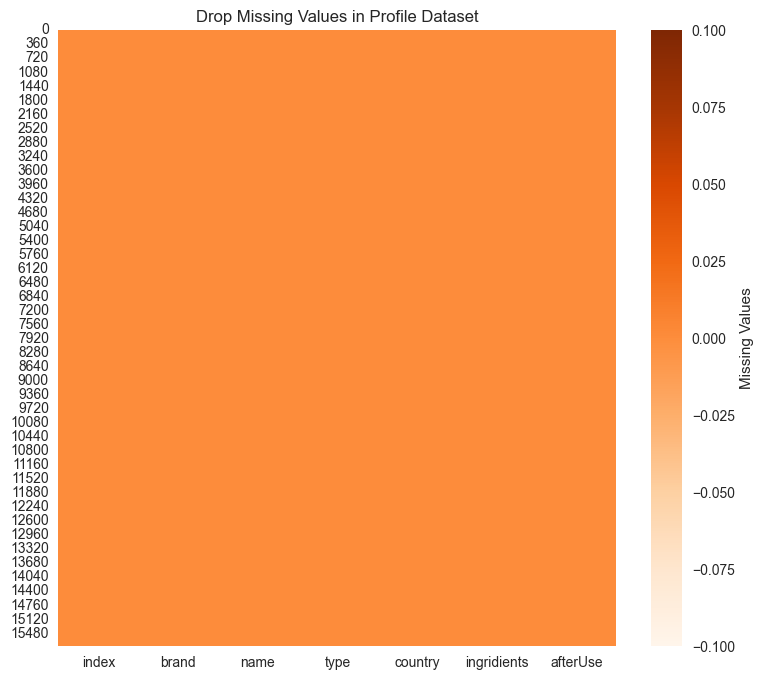

In [12]:
# skinsort 결측치 처리 및 확인
skinsort_copy.dropna(subset=['country','afterUse', 'type'], inplace=True)
skinsort_copy.reset_index(inplace=True)

# 결측치 삭제 확인 시각화
plt.close()
plt.figure(figsize=(9,8))
sns.heatmap(skinsort_copy.isnull(), cbar_kws={'label':'Missing Values'}, cmap='Oranges')
plt.title('Drop Missing Values in Profile Dataset')
plt.show()

### Column-wise data transformation

In [13]:
# df_items : description 컬럼
def preprocess_description(df_items):

    for i in range(len(df_items)):
        description = ast.literal_eval(df_items.description[i])

        for key, value in description.items():
            if key not in df_items.columns:
                df_items[key] = np.nan
            df_items.loc[i, key] = value

    df_items.drop(columns=['description'], inplace=True)

# df_items : detail_dict 컬럼
def preprocess_detail_dict(df_items):

    for i in range(len(df_items)):
        detail_dict = ast.literal_eval(df_items.detail_dict[i])

        for key, value in detail_dict.items():
            if key not in df_items.columns:
                df_items[key] = np.nan
            df_items.loc[i, key] = value

    df_items.drop(columns=['detail_dict'], inplace=True)

# df_items : best_sellers_rank_Feature 컬럼을 세부 컬럼으로 나누기
def preprocess_best_sellers_col(df_items):

        for i in range(len(df_items)):
            try:
                value = df_items.best_sellers_rank_Feature[i]

                if pd.isna(value): #np.nan 인 애들
                    # print(f"{i}, {df_items.best_sellers_rank_Feature[i]} Passed")
                    continue

                if isinstance(value, float): # float 타입인 애들
                    value = str(value)
                    print(f"{i}, {df_items.best_sellers_rank_Feature[i]} Passed")

                cat_list = df_items.best_sellers_rank_Feature[i].split('#')

                df_items.loc[i, 'Category'] = cat_list[1]
                df_items.loc[i, 'Sub_Category'] = cat_list[2]

                detail_list = df_items.Category[i].split('in')

                df_items.loc[i, 'Category_Rank']= detail_list[0]
                df_items.loc[i, 'Category_Name']= detail_list[1]

                df_items.loc[i, 'Category_Name'] = df_items.Category_Name[i].split('(')[0]

                sub_list = df_items.Sub_Category[i].split('in')

                df_items.loc[i, 'Sub_Category_Rank']= sub_list[0]
                df_items.loc[i, 'Sub_Category_Name']= sub_list[1]

            except Exception as e:
                print(f"{i}, {df_items.best_sellers_rank_Feature[i]} Passed")
                print(f"Error: {e}")

                continue

        df_items.drop(columns=['best_sellers_rank_Feature'], inplace=True)

# df_items들의 칼럼 수정 한번에 진행
for i in range(len(items_list)) :
    preprocess_description(items_list[i])
    preprocess_detail_dict(items_list[i])
    preprocess_best_sellers_col(items_list[i])

In [14]:
# df_reviews : date, rating 컬럼
def preprocess_review_cols(df_reviews):

    for i in range(len(df_reviews)):

        try:

            if pd.isna(df_reviews.date[i]) or 'on' not in df_reviews.date[i]:
                # print(f"{i}, {df_reviews.date[i]} Passed")
                continue
            else:
                df_reviews.loc[i, 'review_date'] = df_reviews.date[i].split('on')[1]
                df_reviews.loc[i, 'review_date'] = pd.to_datetime(df_reviews.review_date[i])

            if pd.isna(df_reviews.review_rating[i]):
                print(f"{i}, {df_reviews.review_rating[i]} Passed")
                continue
            else:
                df_reviews.loc[i, 'review_rating'] = float(df_reviews.review_rating[i].split('out')[0])
        except Exception as e:
            print(f"{i}, {df_reviews.review_rating[i]}, Error: {e}")
            continue

# df_items들의 컬럼 한번에 수정하기: 'review_date'를 날짜 형식으로 변경, review_rating을 정수형으로 변경
for i in range(len(reviews_list)) :
    preprocess_review_cols(reviews_list[i])
    reviews_list[i]['review_date'] = pd.to_datetime(reviews_list[i]['review_date'])
    reviews_list[i].drop(columns=['date'], inplace=True)
    reviews_list[i]['review_rating'] = pd.to_numeric(reviews_list[i]['review_rating'], errors='coerce', downcast='integer')

In [15]:
# 브랜드별 item, review 데이터 merge 결합
dr_df = pd.merge(dr_items_copy, dr_reviews_copy, on='ASIN')
cs_df = pd.merge(cs_items_copy, cs_reviews_copy, on='ASIN')
if_df = pd.merge(if_items_copy, if_reviews_copy, on='ASIN')
bj_df = pd.merge(bj_items_copy, bj_reviews_copy, on='ASIN')
pu_df = pd.merge(pu_items_copy, pu_reviews_copy, on='ASIN')

merge_list = [dr_df, cs_df, if_df, bj_df, pu_df]

In [16]:
def preprocess_merge_df(merge_df):

    # 컬럼명 변경, 불필요 컬럼 삭제, 인덱스 수정, 결측치 확인
    merge_df.rename(columns={'content':'review_content', 'title_x':'title'}, inplace=True)
    merge_df.drop(['title_y'], axis=1, inplace=True)
    merge_df.reset_index(drop=True, inplace=True)
    merge_df.isnull().sum()

    # Category_Rank
    merge_df['Category_Rank'] = merge_df['Category_Rank'].apply(
        lambda x: str(x).replace(',', '') if not pd.isna(x) and isinstance(x, float) else x
    ).astype('str').apply(lambda x: x.replace(',', '') if x != 'nan' else None)

    # Sub_Category_Rank
    merge_df['Sub_Category_Rank'] = merge_df['Sub_Category_Rank'].apply(
        lambda x: str(x).replace(',', '') if not pd.isna(x) and isinstance(x, float) else x
    ).astype('str').apply(lambda x: x.replace(',', '') if x != 'nan' else None)

    # review_rating
    merge_df['review_rating'] = merge_df['review_rating'].apply(
        lambda x: str(x) if not pd.isna(x) and isinstance(x, float) else x
    ).astype('float', errors='ignore')

    # review_date
    merge_df['review_date'] = merge_df['review_date'].apply(
        lambda x: pd.to_datetime(x) if not pd.isna(x) else None
    )

    merge_df.reset_index(drop=True, inplace=True)

    merge_df.info()
    merge_df.head(2)
    # amazon_df.to_csv(DATA_PATH + 'amazon_df_0116.csv', encoding='utf-8')

In [17]:
# 언어 감지 및 번역을 위한 라이브러리: langdetect 간편하게 사용할 수 있어서 선택, Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용

from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
from deep_translator import GoogleTranslator

# 언어 감지
def detect_language(text):

    try:
        return detect(text)
    except LangDetectException:
        return 'unknown'

# 영어가 아닌 언어를 구글번역을 활용하여 영어로 번역
def translate_en(text):

    to_translate = text
    translated = GoogleTranslator(source='auto', target='english').translate(to_translate)

    return translated

In [18]:
def text_preprocessing(merge_df) :

    # str 형식이 아닐 경우 오류 방지를 위한 코드
    merge_df['review_content'] = merge_df['review_content'].fillna('').astype(str)

    # 리뷰 언어가 영어가 아닌 경우 -> 번역
    #merge_df['detected_language'] = merge_df['review_content'].apply(detect_language)
    merge_df['detected_language'] = merge_df['review_content'].apply(lambda x: detect_language(x) if isinstance(x, str) else None)

    merge_df.loc[merge_df['detected_language'] != 'en', 'review_content'] = merge_df.loc[merge_df['detected_language'] != 'en', 'review_content'].apply(translate_en)

    # merge_df.to_csv(DATA_PATH + "amazon_koreaOnly_translated.csv", encoding='utf-8')
    merge_df.rename(columns={'category':'Amazon_Category'}, inplace=True)
    merge_df['review_date'] = merge_df['review_date'].apply(lambda x: pd.to_datetime(x) if not pd.isna(x) else None)
    merge_df['global_rating_count'] = merge_df['global_rating_count'].astype('Int64')
    merge_df['Category_Rank'] = merge_df['Category_Rank'].astype('Int64')
    merge_df['Sub_Category_Rank'] = merge_df['Sub_Category_Rank'].astype('Int64')

    print(merge_df.head(2))

# 브랜드 별 아이템, 리뷰 데이터 merge로 결합 후 리뷰데이터 번역 진행
# 시간이 다소 소요
for i in range(len(merge_list)):
    preprocess_merge_df(merge_list[i])
    text_preprocessing(merge_list[i])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1771 entries, 0 to 1770
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   ASIN                             1771 non-null   object        
 1   title                            1771 non-null   object        
 2   order                            1771 non-null   int64         
 3   category                         1771 non-null   object        
 4   brand                            1771 non-null   object        
 5   price                            1771 non-null   float64       
 6   global_rating_count              1771 non-null   int64         
 7   Special_Feature                  705 non-null    object        
 8   total_star_mean                  1771 non-null   float64       
 9   Benefits                         1771 non-null   object        
 10  Description                      1771 non-null   object     

In [19]:
# 스킨쏘트 - 브랜드별 성분, 사용후효과 컬럼럼
def preprocess_skinsort_col(text):
    spaced_text = re.sub(r',(?!\s)', ', ', text)  # , 뒤에 공백이 없으면 추가
    return spaced_text

skinsort_copy['ingridients'] = skinsort_copy['ingridients'].apply(preprocess_skinsort_col)
skinsort_copy['afterUse'] = skinsort_copy['afterUse'].apply(preprocess_skinsort_col)

### Base dataset

In [20]:
# 각 브랜드별 결측치 및 전처리 실시 후 결합
amazon_df = pd.concat([dr_df, cs_df, if_df, bj_df, pu_df])
############# 삭제할 컬럼 다같이 결정 필요 #############

### Text preprocessing

In [21]:
# nltk 에서 Punkt tokenizer & stopwords list를 다운로드
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt_tab to /Users/jun/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/jun/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /Users/jun/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/jun/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [22]:
from nltk.util import ngrams
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()

stemmer = PorterStemmer()
stop_words = set(stopwords.words('english'))

# # lda 모델링 추가 불용어
# lda_stopwords = [
#     "would", "use", "using","locals", "cf", "fb", "ba" , "use", "review", "brand", "brands", "item", "items", "category", "categories", "line", "lines","formula", "formulas", "collection", "collections",
# "really","skin","used","time", "makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never","bought", "cosrx","always","less",
# "time","without","absolutely","might","maybe","sure","think","though", "getting","result","know", "especially","dr jart","feel","purchase","definitely","im","thing","started","need","another","noticed","actually", "people","got","box","every","another","found","jart","wear"
# "set", "sets", "value", "values", "pack", "packs","new","ive"]

# # K-beauty 추가 불용어
# kbeauty_stopwords =  {
# "and", "beauty", "skincare", "cosmetics", "product", "products","use", "using", "from","for","im","i'm","floz",
# "skin", "care", "makeup", "mask", "sheet","best", "top", "favorite",
# "amazing", "perfect", "good", "bad", "recommend", "use", "review", "love","brand",
# "brands", "item", "items", "category", "categories", "line", "lines","formula", "formulas", "ingredient", "ingredients",
# "collection", "collections","set", "sets", "value", "values", "pack", "packs","latest", "exclusive", "limited",
# "special", "popular", "quality", "For",
# "safe", "worked", "works", " product"
# "face", "feel","really","stuff","joseon",
# "skin","used","time", "dont","makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never",
# "bought", "always","without","absolutely","might","maybe","sure","think","though",
# "getting","want","result","know", "especially","dr jart","purchase","definitely",
# "thing","started","need","type","facial","another","noticed","actually",
# "people","money","got","box","every","another","found","jart","wear","drjart","nan","1","no","non","not", "drjart","to",
# "cosrx","From" , "drjrt", "types", "of", " of", "100ml","200ml","300ml","150ml","250ml","50ml","30ml", "338","507","676","purito"
# }

stop_words = stopwords.words('english')
# stop_words.extend(['from', 'subject', 're', 'edu', 'use','object','generator','genexpr'])
# stop_words.extend(lda_stopwords)
# stop_words.extend(kbeauty_stopwords)

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):

        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        return [word for word in tokens if word not in stop_words]
    else:
        return tokens

# (기존) stemming
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

# (추가) -> lemmatization 함수로 변경
def lemmatize_tokens(tokens):
    if isinstance(tokens, list):
        return [lemmatizer.lemmatize(token) for token in tokens]
    else:
        return tokens

# 저장
amazon_df['cleaned_title'] = amazon_df['title'].apply(clean_text)
amazon_df['cleaned_review'] = amazon_df['review_content'].apply(clean_text)
skinsort_copy['cleaned_ingridients'] = skinsort_copy['ingridients'].apply(clean_text)
skinsort_copy['cleaned_afterUse'] = skinsort_copy['afterUse'].apply(clean_text)

amazon_df['tokenized_title'] = amazon_df['cleaned_title'].apply(tokenize_text)
amazon_df['tokenized_review'] = amazon_df['cleaned_review'].apply(tokenize_text)
skinsort_copy['tokenized_ingridients'] = skinsort_copy['cleaned_ingridients'].apply(tokenize_text)
skinsort_copy['tokenized_afterUse'] = skinsort_copy['cleaned_afterUse'].apply(tokenize_text)

amazon_df['stpw_processed_title'] = amazon_df['tokenized_title'].apply(remove_stopwords)
amazon_df['stpw_processed_review'] = amazon_df['tokenized_review'].apply(remove_stopwords)
skinsort_copy['stpw_processed_ingridients'] = skinsort_copy['tokenized_ingridients'].apply(remove_stopwords)
skinsort_copy['stpw_processed_afterUse'] = skinsort_copy['tokenized_afterUse'].apply(remove_stopwords)

amazon_df['stemmed_title'] = amazon_df['stpw_processed_title'].apply(stem_tokens)
amazon_df['stemmed_review'] = amazon_df['stpw_processed_review'].apply(stem_tokens)
skinsort_copy['stemmed_ingridients'] = skinsort_copy['stpw_processed_ingridients'].apply(stem_tokens)
skinsort_copy['stemmed_afterUse'] = skinsort_copy['stpw_processed_afterUse'].apply(stem_tokens)

# bigram 하기 전
amazon_df['lemmatized_title'] = amazon_df['stpw_processed_title'].apply(lemmatize_tokens)
amazon_df['lemmatized_review'] = amazon_df['stpw_processed_review'].apply(lemmatize_tokens)
skinsort_copy['lemmatized_ingridients'] = skinsort_copy['stpw_processed_ingridients'].apply(lemmatize_tokens)
skinsort_copy['lemmatized_afterUse'] = skinsort_copy['stpw_processed_afterUse'].apply(lemmatize_tokens)

amazon_df.head(2)

,ASIN,title,order,Amazon_Category,brand,price,global_rating_count,Special_Feature,total_star_mean,Benefits,Description,Suggested use,Manufacturer,Country of Origin,Item model number,Product Dimensions,Is Discontinued By Manufacturer,UPC,Language,Category,Sub_Category,Category_Rank,Category_Name,Sub_Category_Rank,Sub_Category_Name,index,review_num,customer_id,customer_name,review_rating,review_content,review_date,detected_language,Ingredients,Manufacturer recommended age,Date First Available,Batteries,Department,Package Dimensions,is_bundle,cleaned_title,cleaned_review,tokenized_title,tokenized_review,stpw_processed_title,stpw_processed_review,stemmed_title,stemmed_review,lemmatized_title,lemmatized_review
0,B07DR5816K,Dr.Jart+ Cicapair Tiger Grass Color Correcting...,1,Makeup,Dr.Jart+,54.0,3367,Redness relief,4.2,"Right after using, 92% said skin looked less r...",A green-to-beige cica cream that instantly neu...,Warm between hands then gently press and blend...,Dr.Jart+,Canada,H59X011000,3.31 x 2.36 x 2.56 inches; 1.7 ounces,No,NaN,NaN,"2,574 in Beauty & Personal Care (See Top 100 i...",14 in CC Facial Creams,2574,Beauty & Personal Care,14,CC Facial Creams,0,B07DR5816K__0,R1AVY9U9QOGEMA,Kelli C,3.0,Not as good as people hype it up to be. I’ll u...,2025-01-18,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,drjart cicapair tiger grass color correcting t...,not as good as people hype it up to be i’ll us...,"[drjart, cicapair, tiger, grass, color, correc...","[not, as, good, as, people, hype, it, up, to, ...","[drjart, cicapair, tiger, grass, color, correc...","[good, people, hype, ’, use, ’, gone, plan, ev...","[drjart, cicapair, tiger, grass, color, correc...","[good, peopl, hype, ’, use, ’, gone, plan, eve...","[drjart, cicapair, tiger, grass, color, correc...","[good, people, hype, ’, use, ’, gone, plan, ev..."
1,B07DR5816K,Dr.Jart+ Cicapair Tiger Grass Color Correcting...,1,Makeup,Dr.Jart+,54.0,3367,Redness relief,4.2,"Right after using, 92% said skin looked less r...",A green-to-beige cica cream that instantly neu...,Warm between hands then gently press and blend...,Dr.Jart+,Canada,H59X011000,3.31 x 2.36 x 2.56 inches; 1.7 ounces,No,NaN,NaN,"2,574 in Beauty & Personal Care (See Top 100 i...",14 in CC Facial Creams,2574,Beauty & Personal Care,14,CC Facial Creams,1,B07DR5816K__1,R6EYDZA8D6SJ4,Amazon Customer,3.0,Had to use this for a bit to give it a review....,2025-01-18,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,drjart cicapair tiger grass color correcting t...,had to use this for a bit to give it a review ...,"[drjart, cicapair, tiger, grass, color, correc...","[had, to, use, this, for, a, bit, to, give, it...","[drjart, cicapair, tiger, grass, color, correc...","[use, bit, give, review, moisturizing, sunscre...","[drjart, cicapair, tiger, grass, color, correc...","[use, bit, give, review, moistur, sunscreen, g...","[drjart, cicapair, tiger, grass, color, correc...","[use, bit, give, review, moisturizing, sunscre..."


https://towardsdatascience.com/6-tips-to-optimize-an-nlp-topic-model-for-interpretability-20742f3047e2

In [23]:
from collections import Counter

word_counts = Counter(" ".join([" ".join(review) for review in amazon_df['lemmatized_review'].dropna()]).split())
common_words = word_counts.most_common(50)  # 가장 많이 등장하는 50개 단어 확인
print(common_words)

[('skin', 14469), ('’', 7565), ('product', 7068), ('face', 4316), ('like', 4116), ('use', 3938), ('feel', 3565), ('love', 2804), ('using', 2641), ('good', 2526), ('really', 2458), ('cream', 2352), ('great', 2258), ('dry', 2234), ('one', 2232), ('well', 2169), ('serum', 2109), ('mask', 1991), ('sensitive', 1904), ('work', 1733), ('used', 1683), ('time', 1650), ('day', 1613), ('make', 1536), ('would', 1497), ('moisturizer', 1492), ('also', 1490), ('smell', 1449), ('get', 1411), ('little', 1410), ('toner', 1342), ('much', 1326), ('nice', 1319), ('recommend', 1228), ('look', 1196), ('soft', 1171), ('scent', 1150), ('feeling', 1136), ('even', 1129), ('first', 1073), ('cleanser', 1073), ('im', 1071), ('bottle', 1070), ('eye', 1055), ('ingredient', 1052), ('go', 1051), ('brand', 1004), ('without', 996), ('help', 989), ('oily', 968)]


In [44]:
amazon_df.cleaned_review[0]

0    not as good as people hype it up to be i’ll us...
0    the absolute best skincare line ive found comp...
0                          my wife loves it great gift
0    this brand is quickly becoming my favorite i h...
0    this is the best niacinamide serum i have ever...
Name: cleaned_review, dtype: object

In [39]:
# bigram 
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = nltk.collocations.BigramCollocationFinder.from_documents([comment.split() for comment in amazon_df.cleaned_review if isinstance(comment, str)])

# # 불용어 제거 반영된 상태에서 진행
# finder.apply_word_filter(lambda w: w in stop_words)

# Filter only those that occur at least 40 times
finder.apply_freq_filter(40)
bigram_scores = finder.score_ngrams(bigram_measures.pmi)
print("len of bigram_scores: ", len(bigram_scores))
bigram_scores[:10]

len of bigram_scores:  2174


[(('wonder', 'releaf'), 13.27821164932151),
 (('shea', 'butter'), 13.10133388723743),
 (('holy', 'grail'), 13.081968562370498),
 (('fl', 'oz'), 12.972600573115226),
 (('expiration', 'date'), 12.867954682362999),
 (('play', 'video'), 12.742879916324956),
 (('tea', 'tree'), 11.7397026725408),
 (('releaf', 'centella'), 11.487681349905264),
 (('centella', 'asiatica'), 11.432539795712804),
 (('vitamin', 'c'), 11.310902268216294)]

In [ ]:
# trigram
trigram_measures = nltk.collocations.TrigramAssocMeasures()
finder = nltk.collocations.TrigramCollocationFinder.from_documents([comment.split() for comment in amazon_df.cleaned_review if isinstance(comment, str)])
# finder.apply_word_filter(lambda w: w in stop_words)
# Filter only those that occur at least 40 times
finder.apply_freq_filter(40)
trigram_scores = finder.score_ngrams(trigram_measures.pmi)
print("len of trigram_scores: ", len(trigram_scores))
trigram_scores[:10]

len of trigram_scores:  731


[(('wonder', 'releaf', 'centella'), 24.765892999226775),
 (('tea', 'tree', 'oil'), 20.458723266786244),
 (('an', 'allergic', 'reaction'), 19.308741870408355),
 (('vitamin', 'c', 'serum'), 17.98930689607165),
 (('beauty', 'of', 'joseon'), 17.679017942512928),
 (('dr', 'jart', 'products'), 17.246986106767178),
 (('if', 'you’re', 'looking'), 16.637897057884672),
 (('made', 'in', 'korea'), 15.598767869900662),
 (('a', 'white', 'cast'), 15.127556854742387),
 (('broke', 'me', 'out'), 14.934041614939009)]

In [21]:
bigram_pmi = pd.DataFrame(bigram_scores)
bigram_pmi.columns = ['bigram', 'pmi']
bigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

trigram_pmi = pd.DataFrame(trigram_scores)
trigram_pmi.columns = ['trigram', 'pmi']
trigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [22]:
# Filter for bigrams with only noun-type structures
def bigram_filter(bigram):
    tag = nltk.pos_tag(bigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['NN']:
        return False
    if bigram[0] in stop_words or bigram[1] in stop_words:
        return False
    if 'n' in bigram or 't' in bigram:
        return False
    if 'PRON' in bigram:
        return False
    return True

# Filter for trigrams with only noun-type structures
def trigram_filter(trigram):
    tag = nltk.pos_tag(trigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['JJ','NN']:
        return False
    if trigram[0] in stop_words or trigram[-1] in stop_words or trigram[1] in stop_words:
        return False
    if 'n' in trigram or 't' in trigram:
        return False
    if 'PRON' in trigram:
        return False
    return True 

In [23]:
# Can set pmi threshold to whatever makes sense - eyeball through and select threshold where n-grams stop making sense
# choose top 500 ngrams in this case ranked by PMI that have noun like structures
filtered_bigram = bigram_pmi[bigram_pmi.apply(lambda bigram:\
                                            bigram_filter(bigram['bigram'])\
                                            and bigram.pmi > 5, axis = 1)][:500]

filtered_trigram = trigram_pmi[trigram_pmi.apply(lambda trigram: \
                                                trigram_filter(trigram['trigram'])\
                                                and trigram.pmi > 5, axis = 1)][:500]

bigrams = [' '.join(x) for x in filtered_bigram.bigram.values if len(x[0]) > 2 or len(x[1]) > 2]
trigrams = [' '.join(x) for x in filtered_trigram.trigram.values if len(x[0]) > 2 or len(x[1]) > 2 and len(x[2]) > 2]

In [24]:
bigrams[:10]

['holy grail',
 'expiration date',
 'play video',
 'tea tree',
 'centella asiatica',
 'cotton pad',
 'vitamin c',
 'dark circles',
 'white cast',
 'salicylic acid']

In [25]:
trigrams[:10]

['vitamin c serum',
 'dr jart products',
 'acne prone skin',
 'skin care routine',
 'korean skin care',
 'skin care products',
 'skin feeling soft']

In [26]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

In [42]:
# # Filter for only nouns
# def noun_only(x):
#     pos_comment = nltk.pos_tag(x)
#     filtered = [word[0] for word in pos_comment if word[1] in ['NN']]
#     # to filter both noun and verbs
#     #filtered = [word[0] for word in pos_comment if word[1] in ['NN','VB', 'VBD', 'VBG', 'VBN', 'VBZ']]
#     return filtered

# final_reviews = reviews_w_ngrams.map(noun_only)

# PART 2: EDA

### Visualization

In [33]:
# 팔레트 색상 테스트
from matplotlib.colors import LinearSegmentedColormap
from itertools import cycle

beauty_palette = ['#C58A63', '#F8E9B5', '#E7BCA9', '#EEA77E']
market_palette = ["#003f5c", "#214876", "#4e4c8a", "#7e4a93", "#ae448d", "#d63e7a", "#f1465d", "#fd6036"]
market_palette =  [color for color, _ in zip(cycle(beauty_palette), range(len(market_palette)))]

skin_palette = ['#8C9DB7', '#E3E9F2', '#FD6036','#F6DDD3', '#525252', '#0E1012']
custom_cmap = LinearSegmentedColormap.from_list("custom_palette", market_palette)

# sns.palplot(beauty_palette)
# plt.title("Palette Test")
# plt.show()

# sns.palplot(market_palette)
# plt.title("Palette Test")
# plt.show()

# sns.palplot(skin_palette)
# plt.title("Palette Test")
# plt.show()

In [19]:
# K-beauty 하위 카테고리 별 개수
ak_category_count = pd.DataFrame(amazon_df.Amazon_Category.value_counts())
ak_category_count.reset_index(inplace=True)
ak_category_count.columns = ['Amazon_Category', 'Count']
print(ak_category_count.head())

# K-beauty 아이템 별 개수
category_count = pd.DataFrame(amazon_df.Sub_Category_Name.value_counts())
category_count.reset_index(inplace=True)
category_count.columns = ['Sub_Category', 'Count']
print(category_count.head())

                   Amazon_Category  Count
0               Skin Care Products  11989
1                           Makeup    755
2  Foot, Hand & Nail Care Products     45
3       Beauty Tools & Accessories      8
            Sub_Category  Count
0          Facial Serums   2816
1      Face Moisturizers   2115
2   Facial Toners & Astr   1654
3           Facial Masks   1498
4          Facial Cleans   1242


In [20]:
# K-beauty 브랜드 별 개수
amazon_df.brand.unique()

# 브랜드 별 리뷰 개수
k_brand_count = pd.DataFrame(amazon_df.brand.value_counts())
k_brand_count.reset_index(inplace=True)
k_brand_count

,brand,count
0,COSRX,5189
1,PURITO,2388
2,I'm from,1779
3,Dr.Jart+,1771
4,Beauty of Joseon,1670


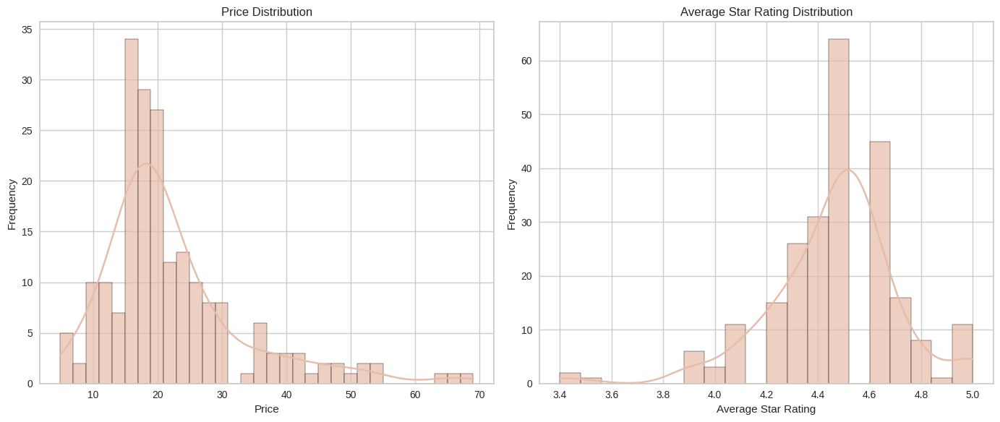

In [21]:
# 가격 분포

# 1. 가격(price) 및 평균 별점(total_star_mean) 분포 분석
plt.figure(figsize=(14, 6))

# 가격 분포
plt.subplot(1, 2, 1)
sns.histplot(amazon_items_df['price'].dropna(), bins=32, kde=True, color='#E7BCA9', alpha=0.7)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')

# 평균 별점 분포
plt.subplot(1, 2, 2)
sns.histplot(amazon_items_df['total_star_mean'], bins=20, kde=True, color='#E7BCA9', alpha=0.7)
plt.title('Average Star Rating Distribution')
plt.xlabel('Average Star Rating')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

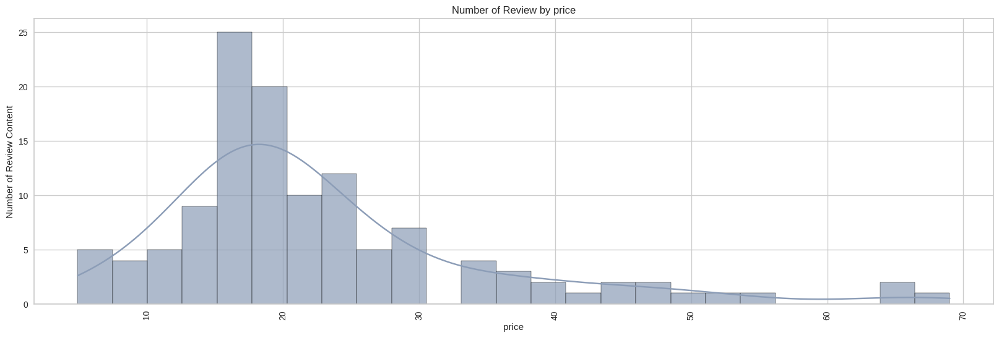

In [22]:
# 전체 가격대별 리뷰수
price_reviews_cnt = amazon_df.groupby(['price'])['review_content'].count().reset_index()

plt.figure(figsize=(20, 6))
sns.histplot(data=price_reviews_cnt, x='price', bins=25, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)
plt.show()

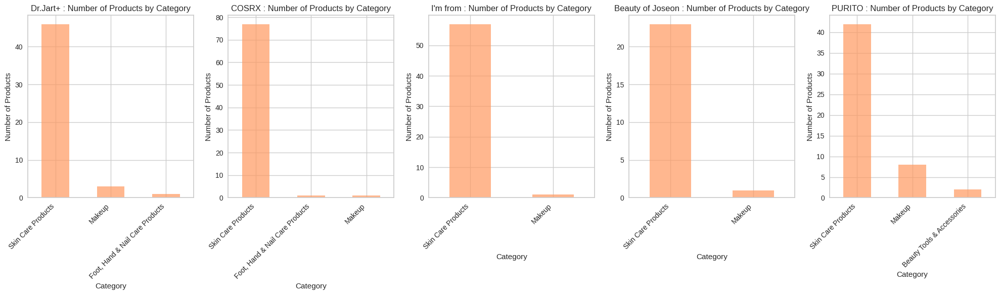

In [23]:
category_dr_counts = amazon_items_df[amazon_items_df['brand']=='Dr.Jart+']
category_cs_counts = amazon_items_df[amazon_items_df['brand']=='COSRX']
category_if_counts = amazon_items_df[amazon_items_df['brand']=="I'm from"]
category_bj_counts = amazon_items_df[amazon_items_df['brand']=='Beauty of Joseon']
category_pu_counts = amazon_items_df[amazon_items_df['brand']=='PURITO']

plt.figure(figsize=(20, 6))

# 브랜드별 제품 수 분포
plt.subplot(1, 5, 1)
category_dr_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('Dr.Jart+ : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 2)
category_cs_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('COSRX : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 3)
category_if_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title("I'm from : Number of Products by Category")
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 4)
category_bj_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('Beauty of Joseon : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 5)
category_pu_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('PURITO : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

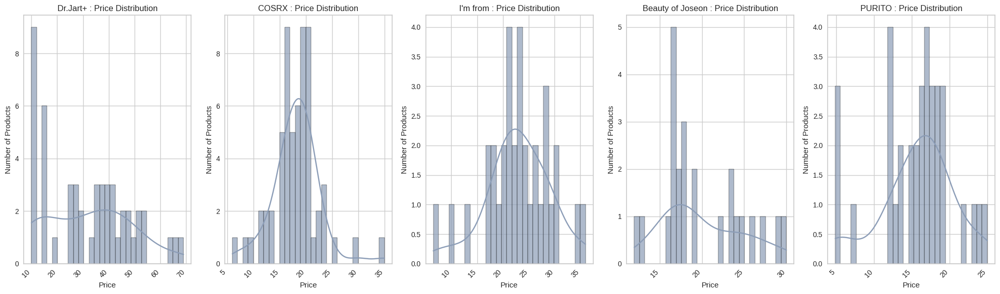

In [24]:
# 브랜드별 가격 분포

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.histplot(category_dr_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('Dr.Jart+ : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 2)
sns.histplot(category_cs_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('COSRX : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 3)
sns.histplot(category_if_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title("I'm from : Price Distribution")
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 4)
sns.histplot(category_bj_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('Beauty of Joseon : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 5)
sns.histplot(category_pu_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('PURITO : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

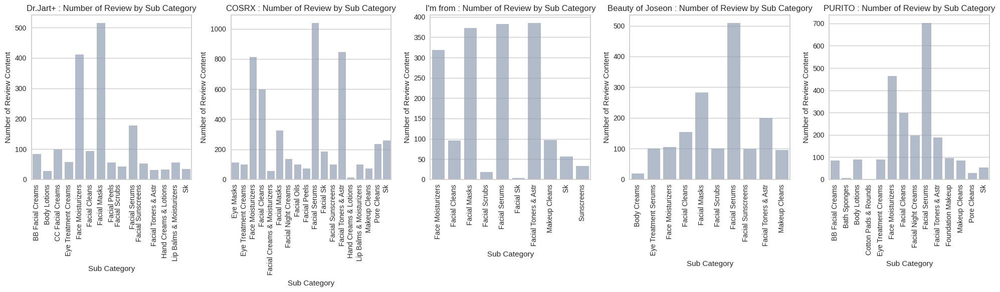

In [25]:
# 브랜드별 서브카테고리별 리뷰수
brand_reviews_cnt = amazon_df.groupby(['brand','Sub_Category_Name'])['review_content'].count().reset_index()

brand_reviews_cnt_dr = brand_reviews_cnt[brand_reviews_cnt['brand']=='Dr.Jart+'].reset_index()
brand_reviews_cnt_cs = brand_reviews_cnt[brand_reviews_cnt['brand']=='COSRX'].reset_index()
brand_reviews_cnt_if = brand_reviews_cnt[brand_reviews_cnt['brand']=="I'm from"].reset_index()
brand_reviews_cnt_bj = brand_reviews_cnt[brand_reviews_cnt['brand']=='Beauty of Joseon'].reset_index()
brand_reviews_cnt_pu = brand_reviews_cnt[brand_reviews_cnt['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.barplot(data=brand_reviews_cnt_dr, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('Dr.Jart+ : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 2)
sns.barplot(data=brand_reviews_cnt_cs, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('COSRX : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 3)
sns.barplot(data=brand_reviews_cnt_if, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title("I'm from : Number of Review by Sub Category")
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 4)
sns.barplot(data=brand_reviews_cnt_bj, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('Beauty of Joseon : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 5)
sns.barplot(data=brand_reviews_cnt_pu, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('PURITO : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

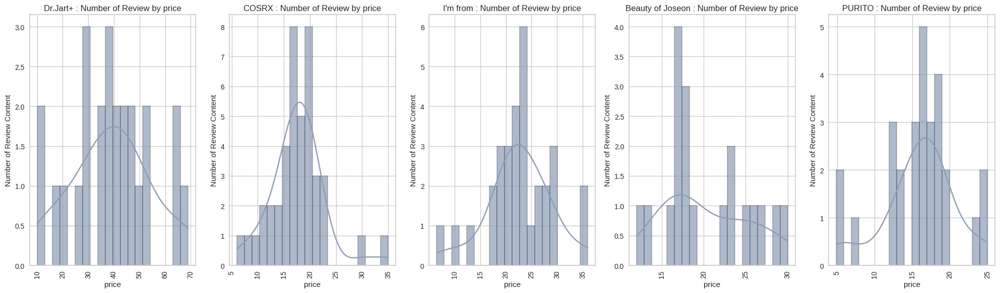

In [26]:
# 브랜드 가격별 리뷰수
brand_price_reviews_cnt = amazon_df.groupby(['brand','price'])['review_content'].count().reset_index()

brand_price_reviews_cnt_dr = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='Dr.Jart+'].reset_index()
brand_price_reviews_cnt_cs = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='COSRX'].reset_index()
brand_price_reviews_cnt_if = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=="I'm from"].reset_index()
brand_price_reviews_cnt_bj = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='Beauty of Joseon'].reset_index()
brand_price_reviews_cnt_pu = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.histplot(data=brand_price_reviews_cnt_dr, x='price', bins=20, kde=True ,alpha=0.7, color='#8C9DB7')
plt.title('Dr.Jart+ : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 2)
sns.histplot(data=brand_price_reviews_cnt_cs, x='price', bins=20, kde=True , alpha=0.7, color='#8C9DB7')
plt.title('COSRX : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 3)
sns.histplot(data=brand_price_reviews_cnt_if, x='price', bins=20, kde=True  , alpha=0.7, color='#8C9DB7')
plt.title("I'm from : Number of Review by price")
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 4)
sns.histplot(data=brand_price_reviews_cnt_bj, x='price', bins=20, kde=True  , alpha=0.7, color='#8C9DB7')
plt.title('Beauty of Joseon : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 5)
sns.histplot(data=brand_price_reviews_cnt_pu, x='price', bins=20, kde=True  , alpha=0.7, color='#8C9DB7')
plt.title('PURITO : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

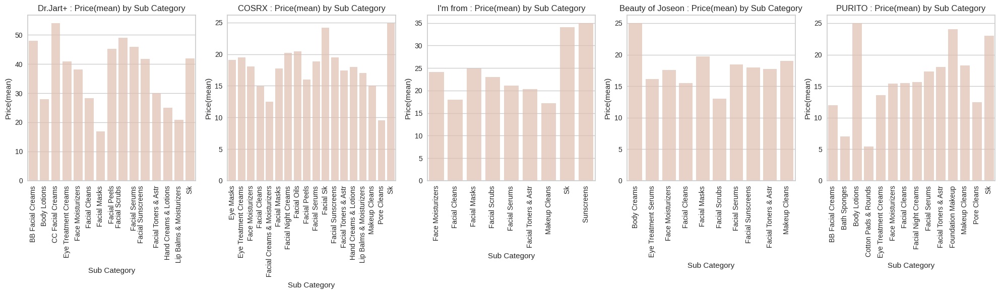

In [27]:
# 브랜드별 서브카테고리별 평균 가격
brand_reviews_mean = amazon_df.groupby(['brand','Sub_Category_Name'])['price'].mean().round(2).dropna().reset_index()

brand_reviews_mean_dr = brand_reviews_mean[brand_reviews_mean['brand']=='Dr.Jart+'].reset_index()
brand_reviews_mean_cs = brand_reviews_mean[brand_reviews_mean['brand']=='COSRX'].reset_index()
brand_reviews_mean_if = brand_reviews_mean[brand_reviews_mean['brand']=="I'm from"].reset_index()
brand_reviews_mean_bj = brand_reviews_mean[brand_reviews_mean['brand']=='Beauty of Joseon'].reset_index()
brand_reviews_mean_pu = brand_reviews_mean[brand_reviews_mean['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.barplot(data=brand_reviews_mean_dr, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('Dr.Jart+ : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 2)
sns.barplot(data=brand_reviews_mean_cs, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('COSRX : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 3)
sns.barplot(data=brand_reviews_mean_if, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title("I'm from : Price(mean) by Sub Category")
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 4)
sns.barplot(data=brand_reviews_mean_bj, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('Beauty of Joseon : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 5)
sns.barplot(data=brand_reviews_mean_pu, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('PURITO : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

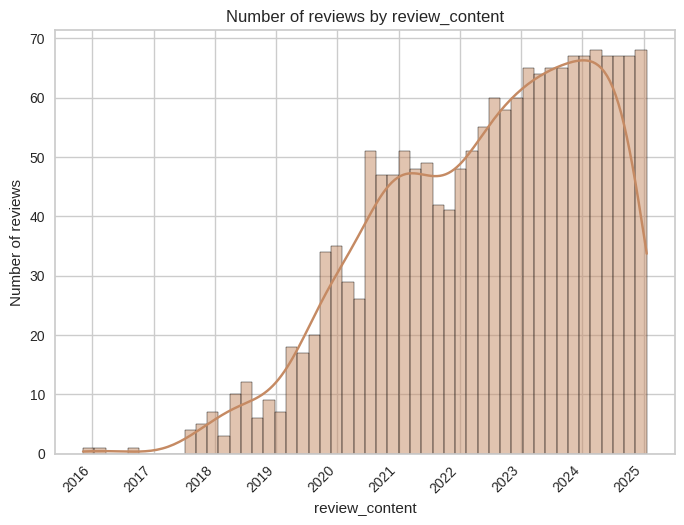

In [28]:
# 기간별 리뷰수
date_reviews_cnt = amazon_df.groupby(['review_date'])['review_content'].count().reset_index()

sns.histplot(data=date_reviews_cnt, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('Number of reviews by review_content')
plt.xlabel('review_content')
plt.ylabel('Number of reviews')
plt.xticks(rotation=45, ha='right')
plt.show()

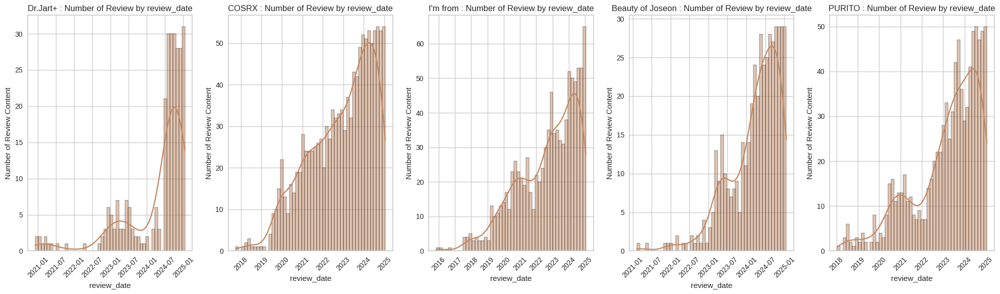

In [29]:
# 브랜드 기간별 리뷰수
brand_date_reviews_cnt = amazon_df.groupby(['brand','review_date'])['review_content'].count().reset_index()

brand_date_reviews_cnt_dr = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='Dr.Jart+'].reset_index()
brand_date_reviews_cnt_cs = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='COSRX'].reset_index()
brand_date_reviews_cnt_if = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=="I'm from"].reset_index()
brand_date_reviews_cnt_bj = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='Beauty of Joseon'].reset_index()
brand_date_reviews_cnt_pu = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.histplot(data=brand_date_reviews_cnt_dr, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('Dr.Jart+ : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 2)
sns.histplot(data=brand_date_reviews_cnt_cs, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('COSRX : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 3)
sns.histplot(data=brand_date_reviews_cnt_if, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title("I'm from : Number of Review by review_date")
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 4)
sns.histplot(data=brand_date_reviews_cnt_bj, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('Beauty of Joseon : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 5)
sns.histplot(data=brand_date_reviews_cnt_pu, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('PURITO : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

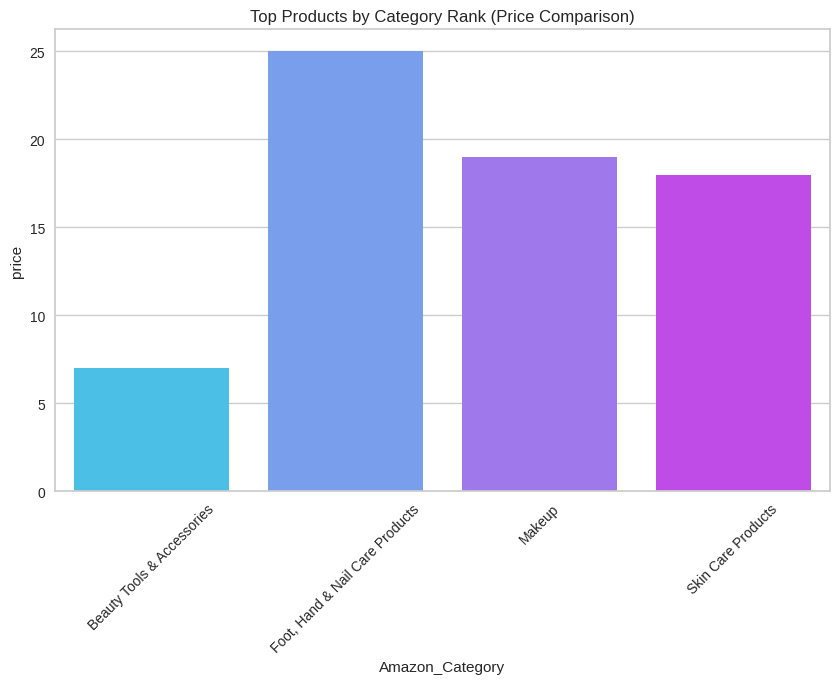

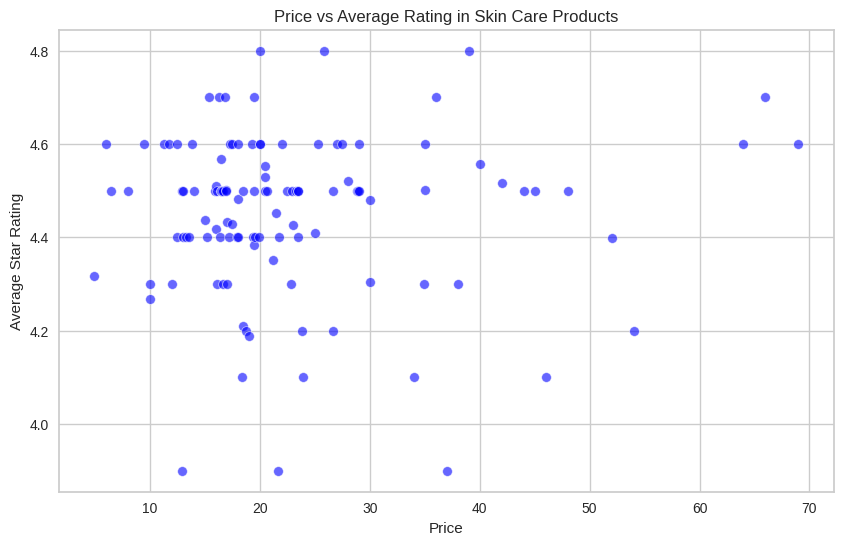

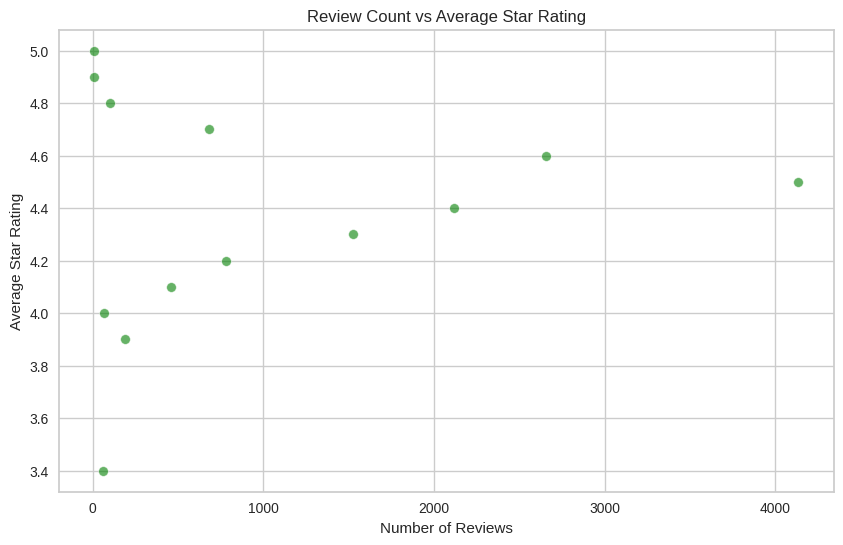

In [30]:
# 1. 제품 성능 심화 분석
amazon_df_copy = amazon_df.copy()
amazon_df_copy_coef = amazon_df_copy.groupby('total_star_mean')['review_content'].count().reset_index()


## (1) 베스트셀러 탐색: 카테고리별 상위 제품 특성 분석
category_best = amazon_df_copy.groupby('Amazon_Category').apply(
    lambda x: x.nsmallest(5, 'Category_Rank')
).reset_index(drop=True)

plt.figure(figsize=(10, 6))
sns.barplot(data=category_best, x='Amazon_Category', y='price', ci=None, palette='cool')
plt.title('Top Products by Category Rank (Price Comparison)')
plt.xticks(rotation=45)
plt.show()

## (2) 가격 민감도 분석: 동일 카테고리 내 가격 대비 평점
selected_category = 'Skin Care Products'
category_data = amazon_df_copy.groupby(['Amazon_Category','price'])['total_star_mean'].mean().reset_index()
category_data_coef = category_data[category_data['Amazon_Category'] == selected_category]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=category_data_coef, x='price', y='total_star_mean', alpha=0.6, color='blue')
plt.title(f'Price vs Average Rating in {selected_category}')
plt.xlabel('Price')
plt.ylabel('Average Star Rating')
plt.grid(True)
plt.show()

## (3) 리뷰 개수와 평점 간 상관관계 분석
plt.figure(figsize=(10, 6))
sns.scatterplot(data=amazon_df_copy_coef, x='review_content', y='total_star_mean', alpha=0.6, color='green')
plt.title('Review Count vs Average Star Rating')
plt.xlabel('Number of Reviews')
plt.ylabel('Average Star Rating')
plt.grid(True)
plt.show()

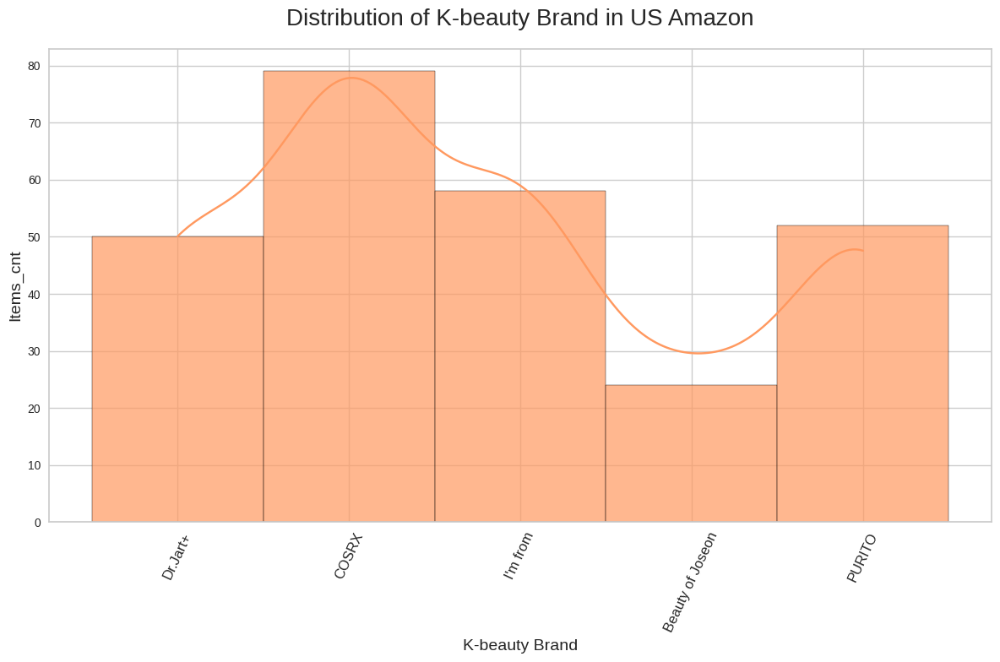

In [31]:
# 브랜드 분포
plt.figure(figsize=(12,8))
sns.histplot(data=amazon_items_df['brand'], bins=5, alpha=0.7, color='#FF9960', kde=True)
plt.title('Distribution of K-beauty Brand in US Amazon', fontsize=20, pad=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('K-beauty Brand', fontsize=14)
plt.ylabel('Items_cnt', fontsize=14)

plt.tight_layout()
plt.show()

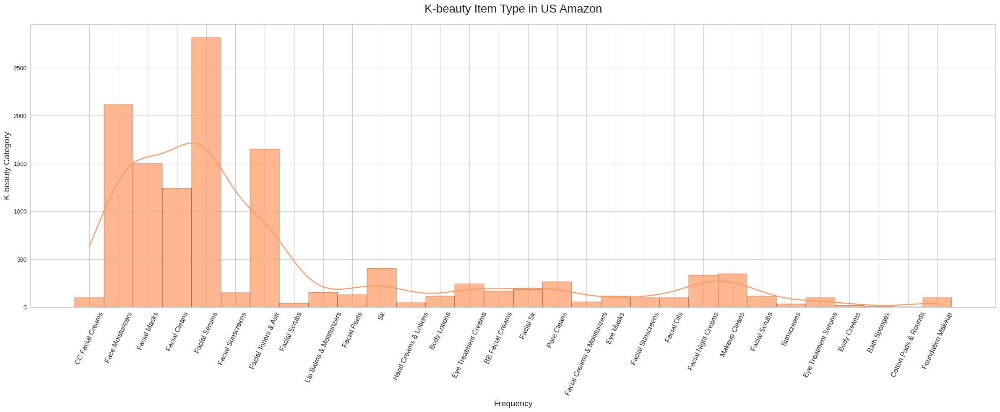

In [32]:
# 제품 유형 분포
plt.figure(figsize=(24,10))
sns.histplot(data=amazon_df['Sub_Category_Name'], bins=31, alpha=0.7, color='#FF9960', kde=True)
plt.title('K-beauty Item Type in US Amazon', fontsize=20, pad=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('K-beauty Category', fontsize=14)

plt.tight_layout()
plt.show()

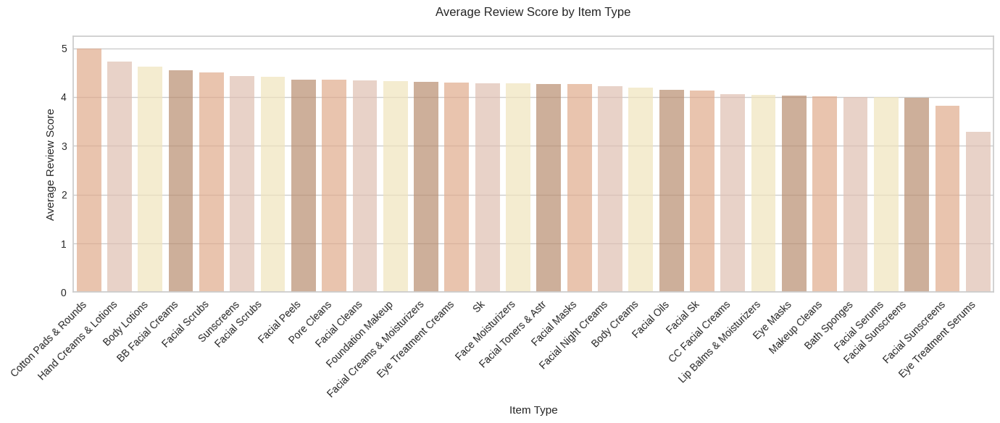

In [33]:
# <제품 유형, 브랜드 별 <-> 리뷰 평점 확인>
# 1. 제품 유형 별 평균 리뷰 평점
category_mean = pd.pivot_table(amazon_df, index=['Sub_Category_Name'], values='review_rating',aggfunc='mean')
category_mean = category_mean.reset_index().sort_values(by='review_rating', ascending=False)
category_mean.head(2)

plt.figure(figsize=(14, 6))
sns.barplot(data=category_mean, x='Sub_Category_Name', y='review_rating', dodge=False, palette=market_palette[-1::-1], alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.title('Average Review Score by Item Type', pad=20)
plt.ylabel('Average Review Score')
plt.xlabel('Item Type')
plt.tight_layout()
plt.show()

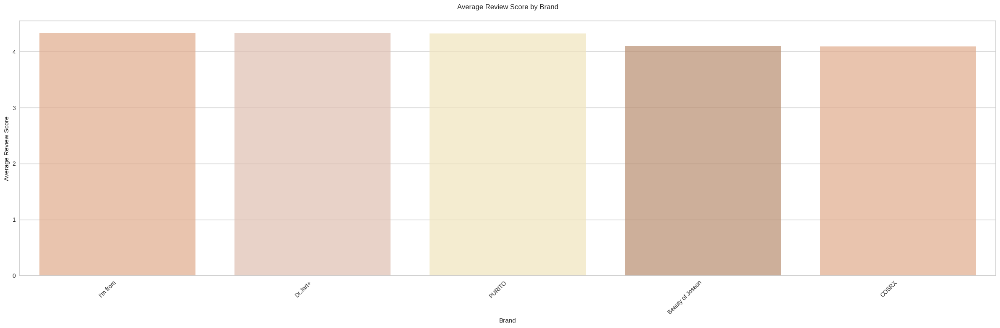

In [34]:
# 2. 브랜드별 평균 리뷰 평점
filtered_df = amazon_df[['brand', 'review_rating']].copy()

filtered_df['review_rating'] = pd.to_numeric(filtered_df['review_rating'], errors='coerce')
filtered_df.dropna(subset=['brand', 'review_rating'], inplace=True)

brand_review_score = pd.pivot_table(
    filtered_df,
    index=['brand'],
    values='review_rating',
    aggfunc='mean'
)
brand_review_score = brand_review_score.reset_index().sort_values(by='review_rating', ascending=False)
brand_review_score.reset_index(inplace=True, drop=True)
brand_review_score[:20]

brand_review_score.head(2)

plt.figure(figsize=(24, 8))
sns.barplot(data=brand_review_score, x='brand', y='review_rating', dodge=False, palette=market_palette[-1::-1], alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.title('Average Review Score by Brand', pad=20)
plt.ylabel('Average Review Score')
plt.xlabel('Brand')
plt.tight_layout()
plt.show()

In [35]:
# 브랜드별 평균 평점 시각화
import plotly.graph_objects as go

df = brand_review_score

fig = go.Figure(data=[go.Table(
    header=dict(values=df.columns, fill_color='paleturquoise', align='center'),
    cells=dict(values=[df[col] for col in df.columns], fill_color='lavender', align='center'))
])

fig.update_layout(title='Brand Review Scores')
fig.show()

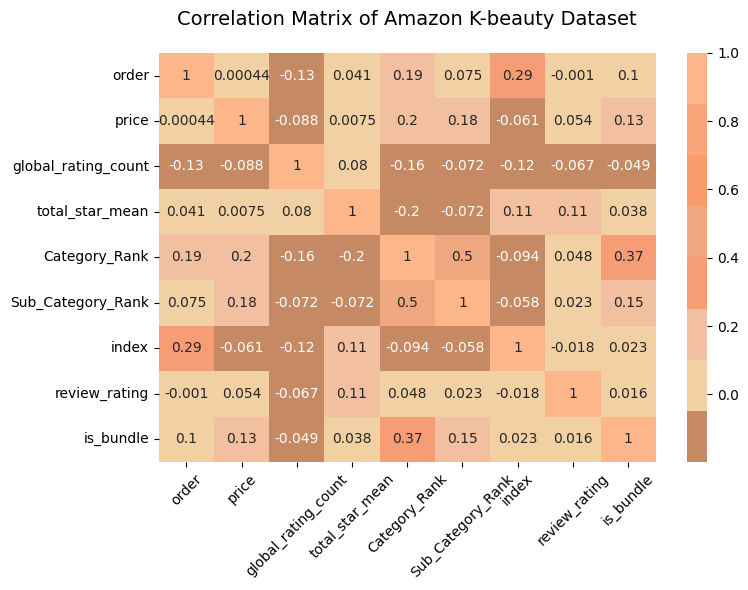

In [36]:
# 전반적인 상관관계
ordinal_palette = [
    '#C58A63',
    '#F1D0A3',
    '#F2BFA1',
    '#F69D75',
    '#EEA77E',
    '#F89C6B',
    '#F9A67A',
    '#FDB58A'
]

plt.close()

sns.reset_defaults()
plt.rcdefaults()
plt.style.use('default')
plt.figure(figsize=(8,6))

sample_data = amazon_df.select_dtypes(include=["number"])

#compute correlation
corr_matrix = sample_data.corr()
corr_matrix

#annot=True return the correlation values
sns.heatmap(corr_matrix, cmap=ordinal_palette, annot=True)
plt.xticks(rotation=45)
plt.title('Correlation Matrix of Amazon K-beauty Dataset', fontsize=14, pad=20)
plt.tight_layout()
plt.show()

### Word Cloud

In [37]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
import string
# # porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
# stemmer = PorterStemmer()
# # NLTK 기본 영어 불용어 세트
# stop_words = set(stopwords.words('english'))
# # K-beauty 관련 추가 불용어
# kbeauty_stopwords =  {
# "and", "beauty", "skincare", "cosmetics", "product", "products","use", "using", "from","for","im","i'm","floz",
# "skin", "care", "makeup", "mask", "sheet","best", "top", "favorite",
# "amazing", "perfect", "good", "bad", "recommend", "use", "review", "love","brand",
# "brands", "item", "items", "category", "categories", "line", "lines","formula", "formulas", "ingredient", "ingredients",
# "collection", "collections","set", "sets", "value", "values", "pack", "packs","latest", "exclusive", "limited",
# "special", "popular", "quality", "For",
# "safe", "worked", "works", " product"
# "face", "feel","really","stuff","joseon",
# "skin","used","time", "dont","makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never",
# "bought", "always","without","absolutely","might","maybe","sure","think","though",
# "getting","want","result","know", "especially","dr jart","purchase","definitely",
# "thing","started","need","type","facial","another","noticed","actually",
# "people","money","got","box","every","another","found","jart","wear","drjart","nan","1","no","non","not", "drjart","to",
# "cosrx","From" , "drjrt", "types", "of", " of", "100ml","200ml","300ml","150ml","250ml","50ml","30ml", "338","507","676","purito"
# }

# # 기존 stop_words와 K-beauty 불용어 합치기
# custom_stopwords = stop_words.union(kbeauty_stopwords)

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
        # 소문자로 모두 변환
        text = text.lower()
        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)
        # @ 제거
        text = re.sub(r'@\w+', '', text)
        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))
        return text
    else:
        return text
# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text
# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        return [word for word in tokens if word not in custom_stopwords]
    else:
        return tokens
# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

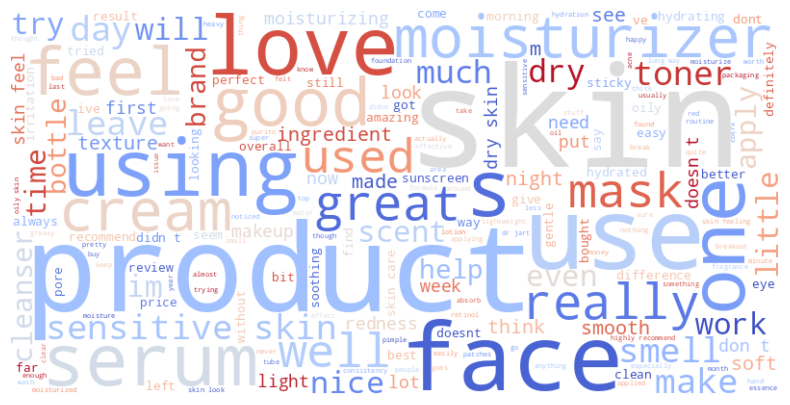

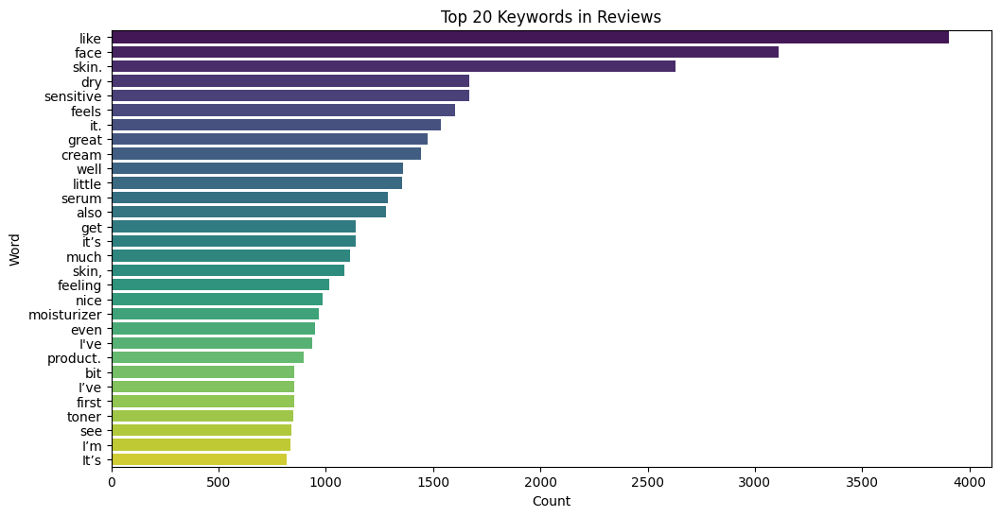

In [38]:
from wordcloud import WordCloud
from collections import Counter

# 전처리된 아마존 모든 리뷰 워드 클라우드
wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(amazon_df['cleaned_review'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Review")
plt.show()

amazon_df_copy = amazon_df.copy()

review_text = " ".join(review for review in amazon_df_copy['review_content'].dropna())

words = [word for word in review_text.split() if word.lower() not in stop_words]
common_words = Counter(words).most_common(30)

# 막대그래프로 표시
common_words_df = pd.DataFrame(common_words, columns=['Word', 'Count'])
plt.figure(figsize=(12, 6))
sns.barplot(data=common_words_df, x='Count', y='Word', palette='viridis')
plt.title('Top 20 Keywords in Reviews')
plt.xlabel('Count')
plt.ylabel('Word')
plt.show()

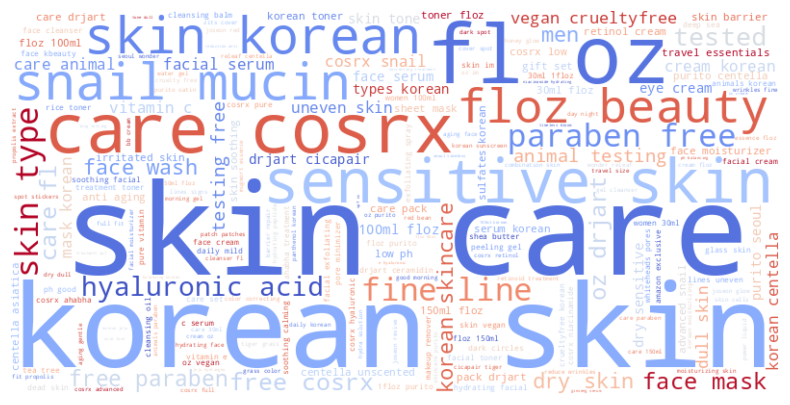

In [39]:
# 전처리된 상품 제목 (아이템 이름) 워드 클라우드
wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(amazon_df['cleaned_title'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

### Skinsort

In [40]:
import plotly.express as px
import plotly.io as pio

df = skinsort_copy

country_dist = df['country'].value_counts().reset_index()
country_dist.columns = ['Country', 'Count']

fig = px.pie(country_dist[:15], values='Count', names='Country', title=f"Country Distribution for Skinsort Brand Data")
fig.update_traces(hole=.3)
# imgname = "skinsort_country_distribution.png"
# fig.write_image(DATA_PATH+imgname)
fig.show()

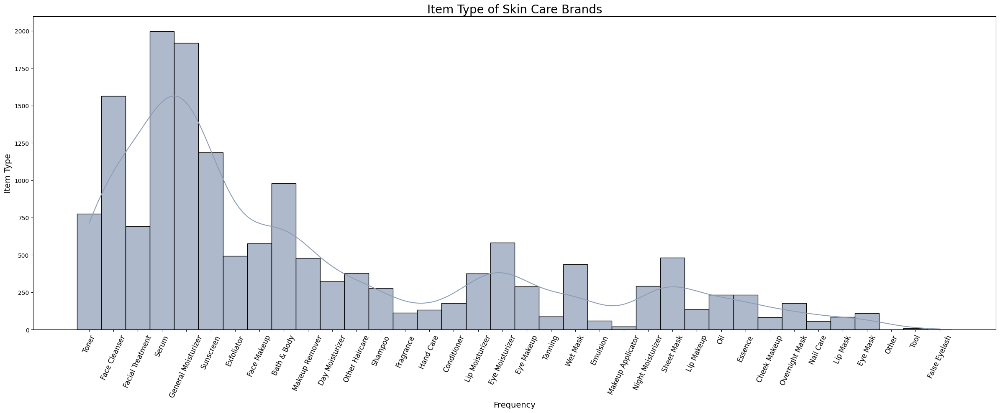

In [41]:
# 카테고리 분포
plt.figure(figsize=(24,10))
sns.histplot(data=skinsort_copy['type'], bins=31, alpha=0.7, color='#8C9DB7', kde=True)
plt.title('Item Type of Skin Care Brands', fontsize=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Item Type', fontsize=14)

plt.tight_layout()
plt.show()

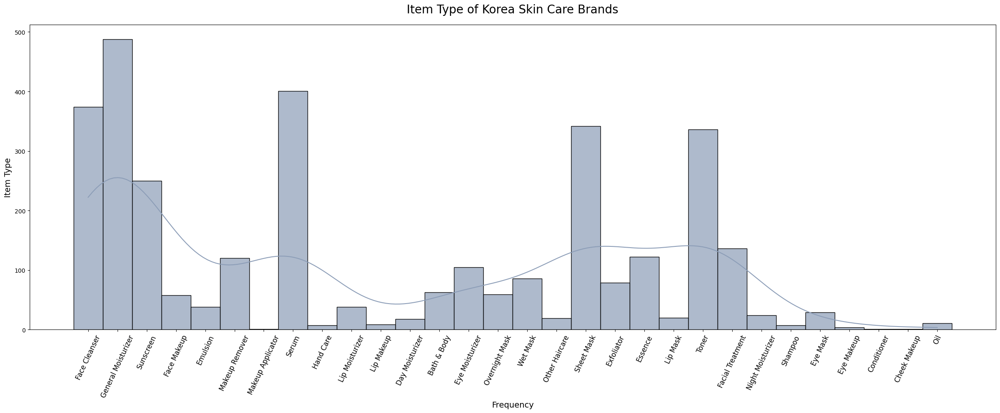

In [42]:
# 한국 스킨케어 브랜드들의 제품 타입 분포
# skincare 데이터셋 활용용
query_cond = "country == 'South Korea'"
k_skin_brand = skinsort_copy.query(query_cond).reset_index()
k_skin_brand.drop(columns='index', inplace=True)
k_skin_brand.head(2)

plt.figure(figsize=(24,10))

sns.histplot(data=k_skin_brand['type'], bins=31, alpha=0.7, color='#8C9DB7', kde=True)
plt.title('Item Type of Korea Skin Care Brands', fontsize=20, pad=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Item Type', fontsize=14)

plt.tight_layout()
plt.show()

> Skinsort 한국 스킨케어 브랜드의 제품 유형 분포
- 일반적으로 알고 있는 것과 비슷함. general moisture, serum, sheet mask, toner 등 기초 제품들과 마스크팩이 많음 !

In [43]:
k_skin_brand.head(2)

,level_0,brand,name,type,country,ingridients,afterUse,cleaned_ingridients,cleaned_afterUse,tokenized_ingridients,tokenized_afterUse,stemmed_ingridients,stemmed_afterUse,stpw_processed_ingridients,stpw_processed_afterUse,lemmatized_ingridients,lemmatized_afterUse
0,4,COSRX,Low pH Good Morning Gel Cleanser,Face Cleanser,South Korea,"Water,Cocamidopropyl Betaine,Sodium Lauroyl Me...","Good For Oily Skin,Reduces Irritation,Reduces ...",watercocamidopropyl betainesodium lauroyl meth...,good for oily skinreduces irritationreduces la...,"[watercocamidopropyl, betainesodium, lauroyl, ...","[good, for, oily, skinreduces, irritationreduc...","[watercocamidopropyl, betainesodium, lauroyl, ...","[good, for, oili, skinreduc, irritationreduc, ...","[watercocamidopropyl, betainesodium, lauroyl, ...","[oily, skinreduces, irritationreduces, large, ...","[watercocamidopropyl, betainesodium, lauroyl, ...","[oily, skinreduces, irritationreduces, large, ..."
1,7,COSRX,Advanced Snail 92 All In One Cream,General Moisturizer,South Korea,"Snail Secretion Filtrate,Betaine,Caprylic/Capr...","Redness Reducing,Reduces Irritation,May Worsen...",snail secretion filtratebetainecapryliccapric ...,redness reducingreduces irritationmay worsen o...,"[snail, secretion, filtratebetainecapryliccapr...","[redness, reducingreduces, irritationmay, wors...","[snail, secret, filtratebetainecapryliccapr, t...","[red, reducingreduc, irritationmay, worsen, oi...","[snail, secretion, filtratebetainecapryliccapr...","[redness, reducingreduces, irritationmay, wors...","[snail, secretion, filtratebetainecapryliccapr...","[redness, reducingreduces, irritationmay, wors..."


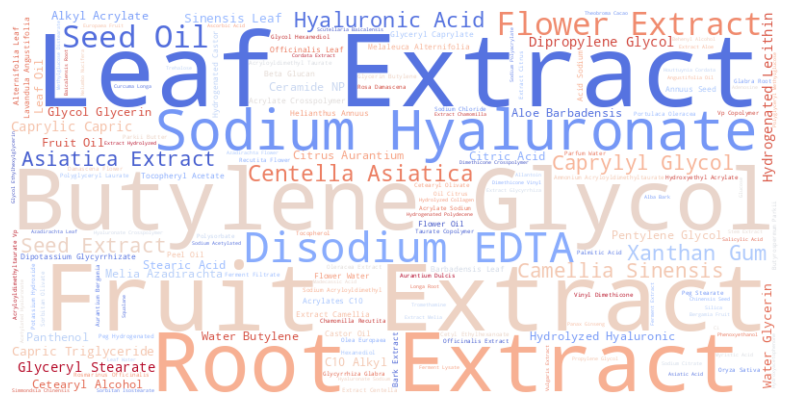

In [44]:
# 한국 스킨케어 브랜드 성분
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(k_skin_brand['ingridients'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Review")
plt.show()

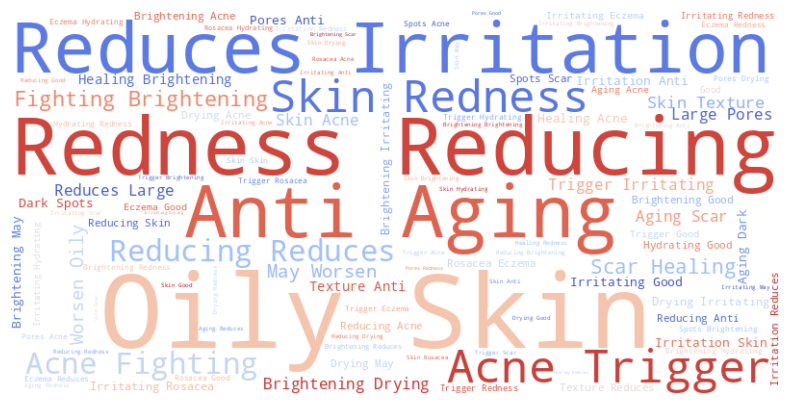

In [45]:
# 한국 스킨케어 브랜드 - 사용후
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(k_skin_brand['afterUse'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Review")
plt.show()

> 사용 후 반응
- 피부 타입 개인 차에 따른 반응들이 여기도 많음. 더 기름이 심해졌다, 건조하다 등
- 간지러움, 붉어짐 등 -> 개인적인 생각이지만 너무 특이한 성분? 약초나 시카 성분 등 자연성분을 강조한다고 너무 특이한 게 들어가면 개인 차를 많이 타는 것 같음

In [46]:

# # pay_amont 데이터 추출
# light_group_pay = df[df['player_segment3'] == 'low']['pay_amont'].dropna()
# heavy_group_pay = df[df['player_segment3'] == 'high']['pay_amont'].dropna()

# # 평균 계산
# light_mean = light_group_pay.mean()
# print("light_mean", light_mean)
# heavy_mean = heavy_group_pay.mean()
# print("heavy_mean", heavy_mean)

# # 데이터프레임 생성
# mean_data = pd.DataFrame({
#     'Group': ['Low', 'High'],
#     'Mean_Pay_Amount': [light_mean, heavy_mean]
# })

# # 시각화
# plt.figure(figsize=(8, 10))
# sns.barplot(data=mean_data, x='Group', y='Mean_Pay_Amount', palette='viridis')

# # 그래프 제목과 레이블 추가
# plt.title('Mean Pay Amount by Player Segment', fontsize=18)
# plt.xlabel('Player Segment (instance_Dungeon_enter_cnt)', fontsize=18)
# plt.ylabel('Pay Amount', fontsize=18)
# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)

# # p-value 표시
# t_stat, p_value = stats.ttest_ind(light_group_pay, heavy_group_pay, equal_var=False)
# print(t_stat, p_value)

# plt.tight_layout()
# plt.show()


In [47]:
# # 범주형 변수 그룹 간 차이
# from scipy.stats import chi2_contingency

# behavior_cols = ['job', 'action_type', 'channel',  'main_purchase_category']

# results = []

# for column in behavior_cols:

#     contingency_table = pd.crosstab(df['player_segment3'], df[column])
#     chi2, p, dof, expected = chi2_contingency(contingency_table)
#     results.append({'behavior_column': column, 'chi2_stat': chi2, 'p_value': p, 'degrees_of_freedom': dof})

# results_df = pd.DataFrame(results)

# print(results_df)

> 유저 세그먼트화 및 차이 분석 결과
- 현재 데이터 안에서 통계적으로 유의미한 차이를 보이는 결과는 없음.
- 그래도, 한 세트를 건진다면 던전 입장 횟수 (low, high) & action type 은 눈여겨볼만 함.
- p-value 는 유의하지 않으나 유일하게 0.1 대까지 p-value 가 내려간 조합이었음.
    - 많이/적게 입장한 그룹이 주로 어떤 액션을 했는지?
        - 적게 입장 -> 정말 레이드라면 이전에 팀에서 나온 의견 맞을 가능성도 있음.
        - 오히려, 많이 -> fishing, pvp
- 이하 참고
-     behavior_column  chi2_stat   p_value  degrees_of_freedom
- 0                     job   1.389877  0.845952                   4
- 1             action_type   6.768321  0.148650                   4
- 2                 channel   2.003753  0.367190                   2
- 3  main_purchase_category   0.958777  0.995466                   7

In [48]:
# # action_type과 player_segment3의 교차 테이블 계산
# action_type_counts = pd.crosstab(df['player_segment3'], df['action_type'])

# # 세그먼트별 데이터 추출 및 정렬
# high_group = action_type_counts.loc['high'].reset_index()
# low_group = action_type_counts.loc['low'].reset_index()

# high_group.columns = ['Action Type', 'Count']
# low_group.columns = ['Action Type', 'Count']

# # Count 기준으로 정렬
# high_group = high_group.sort_values(by='Count', ascending=False).reset_index(drop=True)
# low_group = low_group.sort_values(by='Count', ascending=False).reset_index(drop=True)

# # 고정된 컬러 맵 생성 (action_type 별 색상 동일화)
# unique_action_types = sorted(set(high_group['Action Type']).union(set(low_group['Action Type'])))
# color_palette = sns.color_palette("tab10", len(unique_action_types))
# color_mapping = {action: color for action, color in zip(unique_action_types, color_palette)}

# # 그래프 생성
# fig, axes = plt.subplots(1, 2, figsize=(14, 10), sharey=True)

# # High 그룹
# sns.barplot(
#     data=high_group,
#     x='Action Type',
#     y='Count',
#     ax=axes[0],
#     palette=[color_mapping[action] for action in high_group['Action Type']]
# )
# axes[0].set_title('Player Segment (High)', fontsize=18)
# axes[0].set_xlabel('Action Type', fontsize=14)
# axes[0].set_ylabel('Count', fontsize=14)
# axes[0].tick_params(axis='x', rotation=45, labelsize=14)

# # Low 그룹
# sns.barplot(
#     data=low_group,
#     x='Action Type',
#     y='Count',
#     ax=axes[1],
#     palette=[color_mapping[action] for action in low_group['Action Type']]
# )
# axes[1].set_title('Player Segment (Low)', fontsize=18)
# axes[1].set_xlabel('Action Type', fontsize=14)
# axes[1].set_ylabel('')  # 공유 Y축 사용
# axes[1].tick_params(axis='x', rotation=45, labelsize=14)

# # 전체 레이아웃 정리
# plt.tight_layout()
# plt.show()


In [49]:
# df['instance_Dungeon_enter_cnt'].describe()

# PART 3: Data Analysis

## ◼ Amazon

### Sentiment Analysis

In [50]:
k_skin_brand.dropna(subset=['ingridients'], inplace=True)
k_skin_brand['splitted_ingridients'] = k_skin_brand['ingridients'].apply(lambda x: str(x).split(',') if pd.notna(x) else [])

print(k_skin_brand['splitted_ingridients'].head())

k_skin_brand.dropna(subset=['afterUse'], inplace=True)
k_skin_brand['splitted_afterUse'] = k_skin_brand['afterUse'].apply(lambda x: str(x).split(',') if pd.notna(x) else [])

print(k_skin_brand['splitted_afterUse'].head())

0    [Water, Cocamidopropyl Betaine, Sodium Lauroyl...
1    [Snail Secretion Filtrate, Betaine, Caprylic/C...
2    [Water, Oryza Sativa Extract 30%, Dibutyl Adip...
3    [Water, Octocrylene, Citrullus Lanatus Fruit E...
4    [Water, Cyclopentasiloxane, Ethylhexyl Methoxy...
Name: splitted_ingridients, dtype: object
0    [Good For Oily Skin, Reduces Irritation, Reduc...
1    [Redness Reducing, Reduces Irritation, May Wor...
2    [Good For Oily Skin, Redness Reducing, Acne Fi...
3    [Drying, May Worsen Oily Skin, Acne Trigger, I...
4    [Good For Oily Skin, Redness Reducing, Brighte...
Name: splitted_afterUse, dtype: object


In [51]:
# from sklearn.feature_extraction.text import TfidfVectorizer

# # Ensure columns are lists of strings
# column1_texts = [' '.join(ingredients) for ingredients in k_skin_brand.splitted_ingridients]
# column2_texts = [' '.join(after_use) for after_use in k_skin_brand.splitted_afterUse]

# # Apply TfidfVectorizer
# vectorizer = TfidfVectorizer()
# column1_vectors = vectorizer.fit_transform(column1_texts)
# column2_vectors = vectorizer.transform(column2_texts)

# import numpy as np
# from scipy.stats import pearsonr

# correlations = []
# for i in range(column1_vectors.shape[1]):
#     try:
#         # Calculate Pearson correlation for each feature
#         corr, _ = pearsonr(column1_vectors[:, i].toarray().flatten(),
#                            column2_vectors[:, i].toarray().flatten())
#         correlations.append(corr)
#     except Exception as e:
#         # Handle cases where Pearson correlation fails
#         correlations.append(np.nan)

# # Visualization
# import matplotlib.pyplot as plt
# import seaborn as sns

# plt.figure(figsize=(12, 8))
# sns.heatmap(np.array(correlations).reshape(-1, 1),
#             cmap='coolwarm', center=0, cbar_kws={'label': 'Correlation'})
# plt.title('Element-wise Correlation between Two Text Columns')
# plt.show()

In [52]:
# 감성 분석
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Create an instance of SentimentIntensityAnalyzer, which is part of the VADER sentiment analysis tool.
analyzer = SentimentIntensityAnalyzer()

# Function to apply VADER sentiment analysis to each review.
# The function takes in a 'review' (text) and returns the polarity scores, which include
# 'compound', 'positive', 'negative', and 'neutral' sentiment values.
def get_sentiment(review):
    return analyzer.polarity_scores(review)

# Apply the 'get_sentiment' function to each entry in the 'Cleaned_Review' column.
# Store the resulting sentiment scores (dictionary) in a new column 'vader_scores'.
amazon_df['cleaned_review'] = amazon_df['cleaned_review'].astype(str)
amazon_df['vader_scores'] = amazon_df['cleaned_review'].apply(get_sentiment)

k_skin_brand['afterUse'] = k_skin_brand['afterUse'].astype(str)
k_skin_brand['vader_scores'] = k_skin_brand['afterUse'].apply(get_sentiment)

# Extract the 'compound' score from the 'vader_scores' dictionary for each review.
# The 'compound' score is a normalized score ranging from -1 (most negative) to +1 (most positive),
# summarizing the overall sentiment of the text.
amazon_df['compound'] = amazon_df['vader_scores'].apply(lambda score_dict: score_dict['compound'])
k_skin_brand['compound'] = k_skin_brand['vader_scores'].apply(lambda score_dict: score_dict['compound'])

# Function to classify the sentiment based on the 'compound' score.
# Scores >= 0.05 are classified as 'Positive', <= -0.05 as 'Negative', and anything in between as 'Neutral'.
def classify_sentiment(compound_score):
    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply the 'classify_sentiment' function to the 'compound' score to get the overall sentiment
# classification (Positive, Negative, or Neutral) for each review.
amazon_df['sentiment'] = amazon_df['compound'].apply(classify_sentiment)
k_skin_brand['sentiment'] = k_skin_brand['compound'].apply(classify_sentiment)

# Display the first few rows of the DataFrame, showing the cleaned review text,
# the 'compound' sentiment score, and the classified 'sentiment'.
print(amazon_df[['cleaned_review', 'compound', 'sentiment']].head(2))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 5.5 MB/s eta 0:00:00
                                      cleaned_review  compound sentiment
0  not as good as people hype it up to be i’ll us...   -0.5428  Negative
1  had to use this for a bit to give it a review ...    0.5423  Positive


In [53]:
# 2. 긍정적/부정적 리뷰별 가격과 평균 평점
amazon_df_copy2 = amazon_df.copy()
amazon_df_copy_coef = amazon_df_copy2.groupby('total_star_mean')['review_content'].count().reset_index()

customer_segments = amazon_df_copy2.groupby('sentiment')[['price', 'total_star_mean']].mean().round(2)

print(customer_segments)

           price  total_star_mean
sentiment                        
Negative   19.47             4.42
Neutral    19.29             4.45
Positive   20.84             4.45


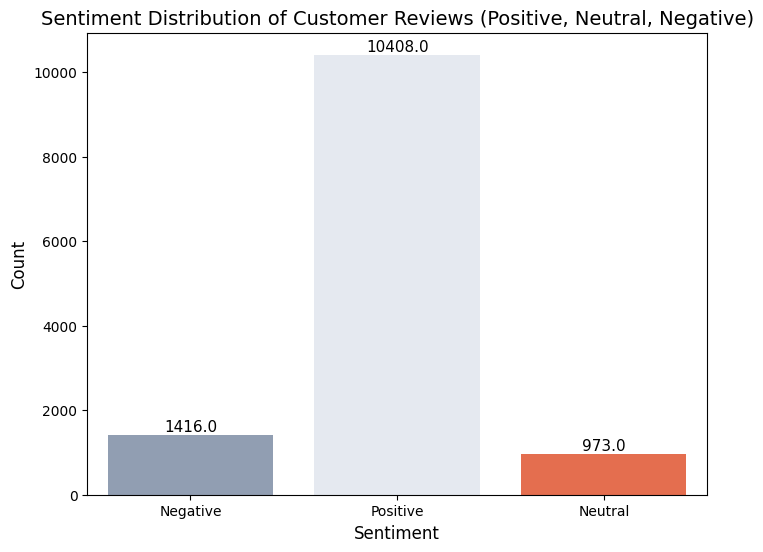

In [54]:
# 아마존
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df, x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

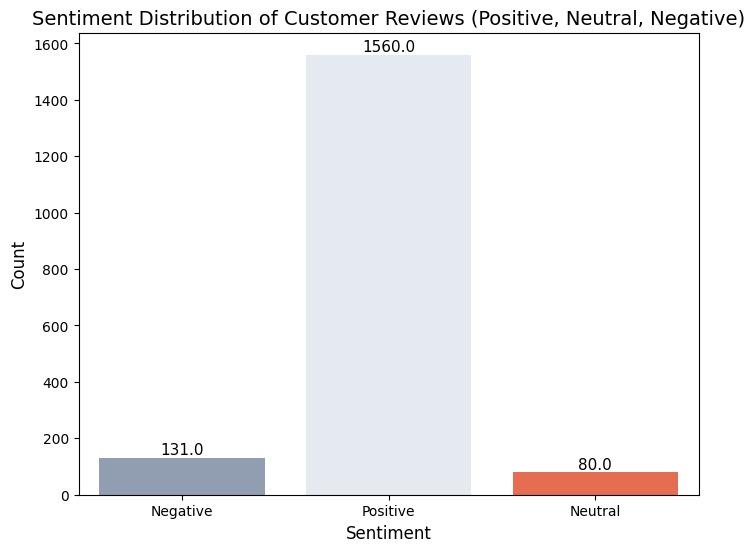

In [55]:
# 아마존 # Dr.Jart+
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=='Dr.Jart+'], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

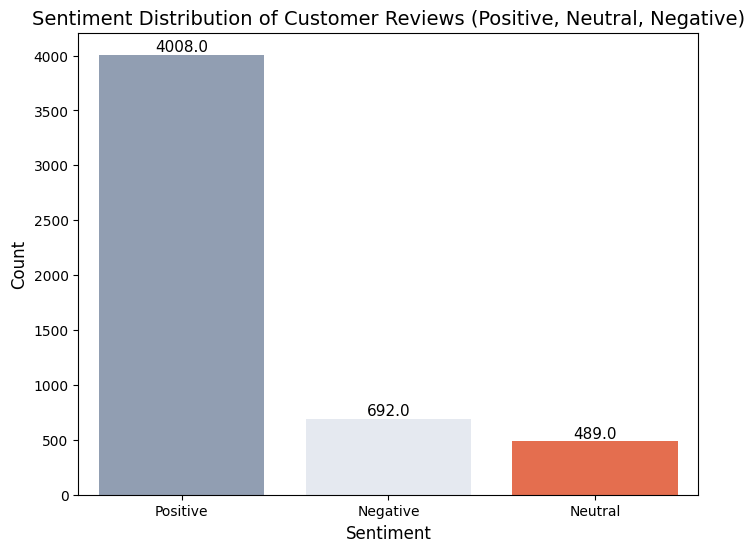

In [56]:
# 아마존 # Cosrx
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=='COSRX'], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

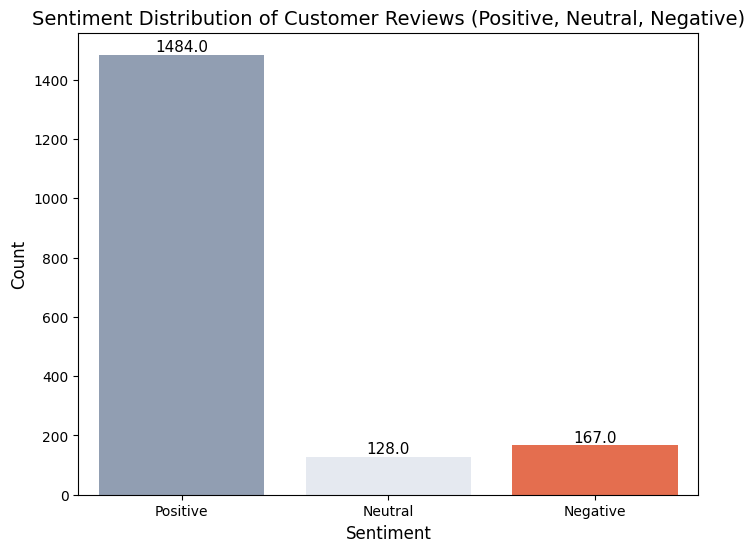

In [57]:
# 아마존 # I'm from
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=="I'm from"], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

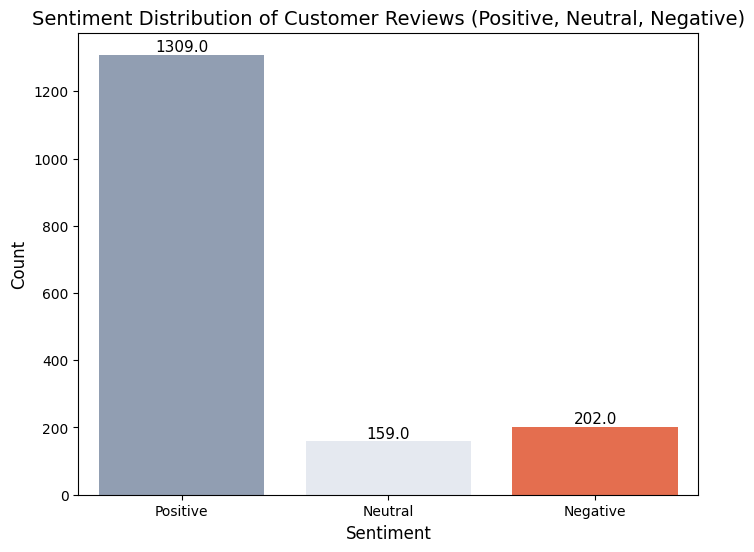

In [58]:
# 아마존 # Beauty of Joseon
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=="Beauty of Joseon"], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

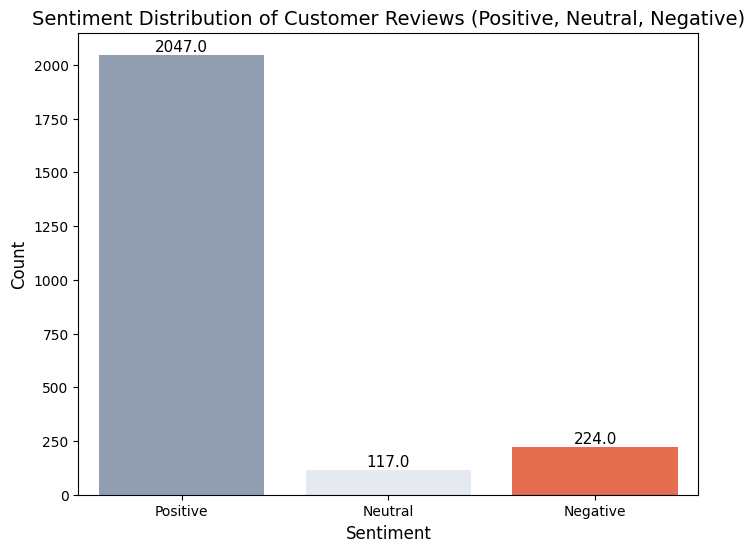

In [59]:
# 아마존 # PURITO
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=="PURITO"], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

### Word Cloud by each sentiment

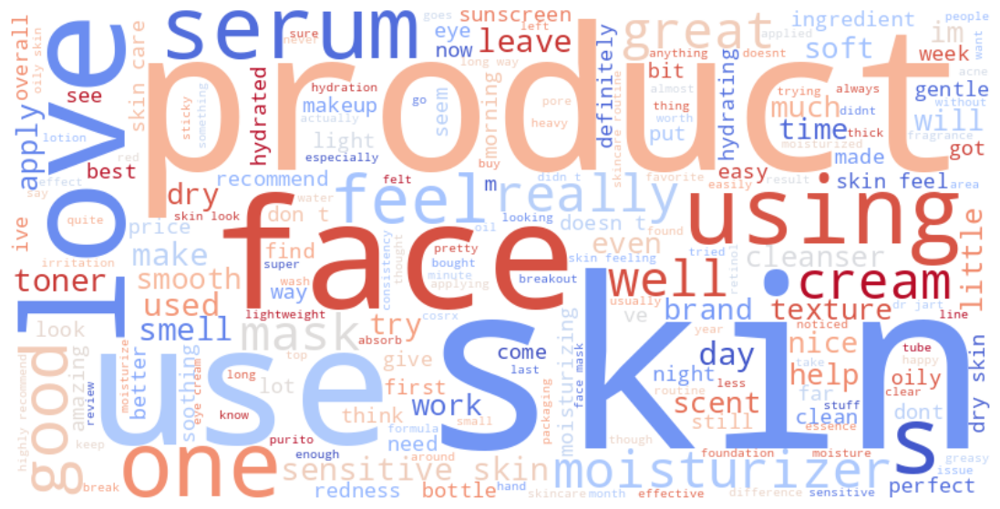

In [60]:
# 긍정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df.query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

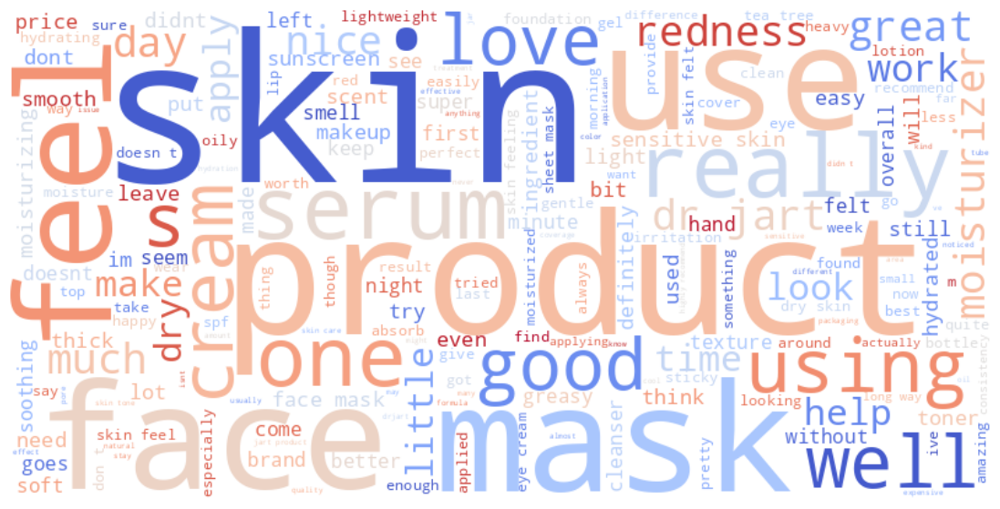

In [61]:
# 긍정적 리뷰 내용 - 워드 클라우드 # Dr.Jart+
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="Dr.Jart+"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

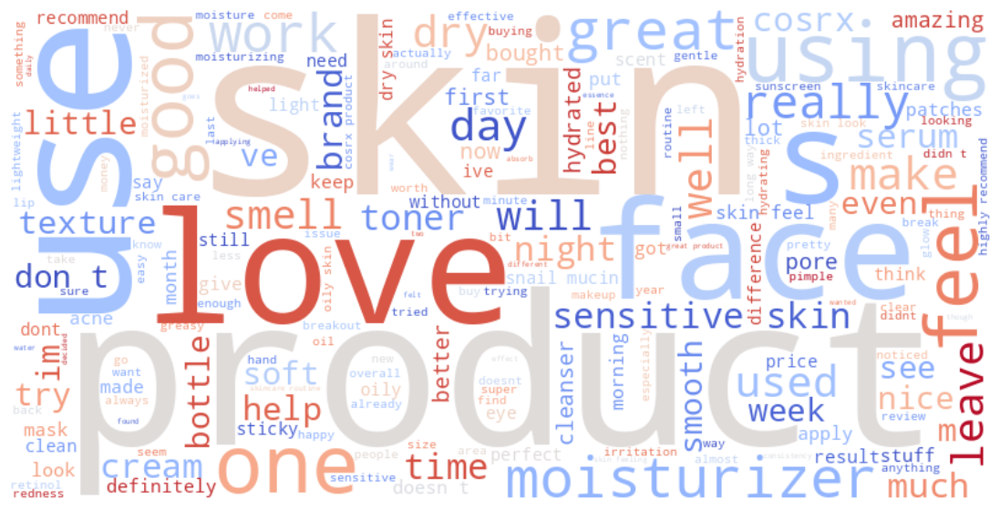

In [62]:
# 긍정적 리뷰 내용 - 워드 클라우드 # COSRX
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="COSRX"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

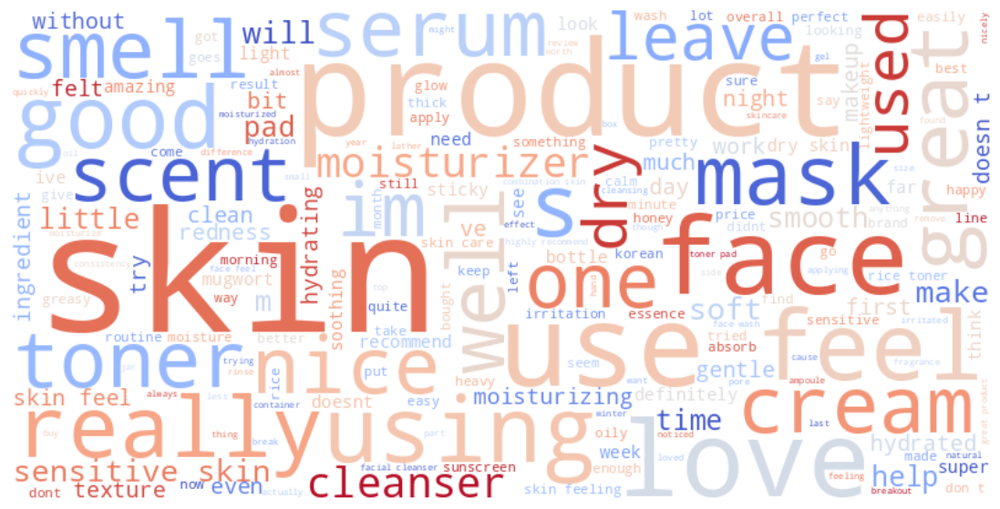

In [63]:
# 긍정적 리뷰 내용 - 워드 클라우드 # I'm from
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="I'm from"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

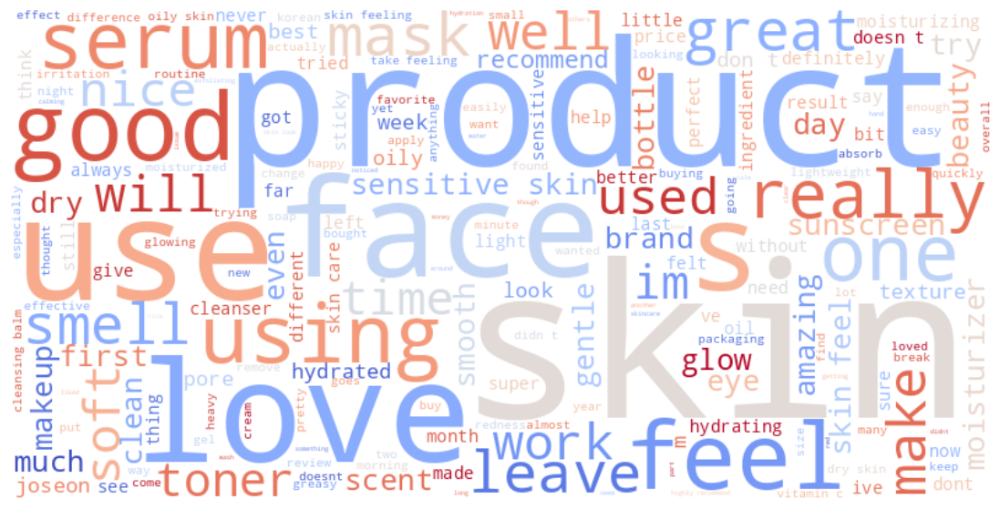

In [64]:
# 긍정적 리뷰 내용 - 워드 클라우드 # Beauty of Joseon
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="Beauty of Joseon"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

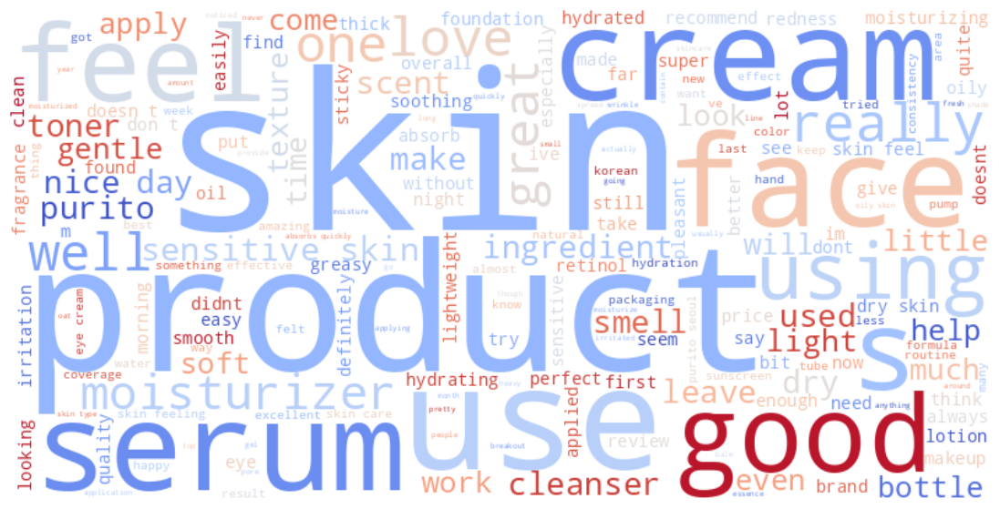

In [65]:
# 긍정적 리뷰 내용 - 워드 클라우드 # PURITO
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="PURITO"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

> 긍정 리뷰
- 수분 : hydration, hydrated, moisturing, moisture
- 카테고리 : skin-care, make-up (카테고리인지, 메이크업할 때 잘 먹는다는 건지는 원본을 봐야알듯)
            skin, skin-care, skincare routine 등이 많음
- 아이템 : oil, serum, cleanser, toner, cream
- 시간 : morning, night ..
    
    - 스킨케어 루틴 중에 일상적으로 이용, 수분감 등 기능성에 긍정적 반응이 주로 (현재 샘플 데이터 기준)
    현재, K-beauty 의 경우 Skin care 쪽으로 미국에서 반응이 좋은데 이 부분과 일치하는 리뷰 내용임.

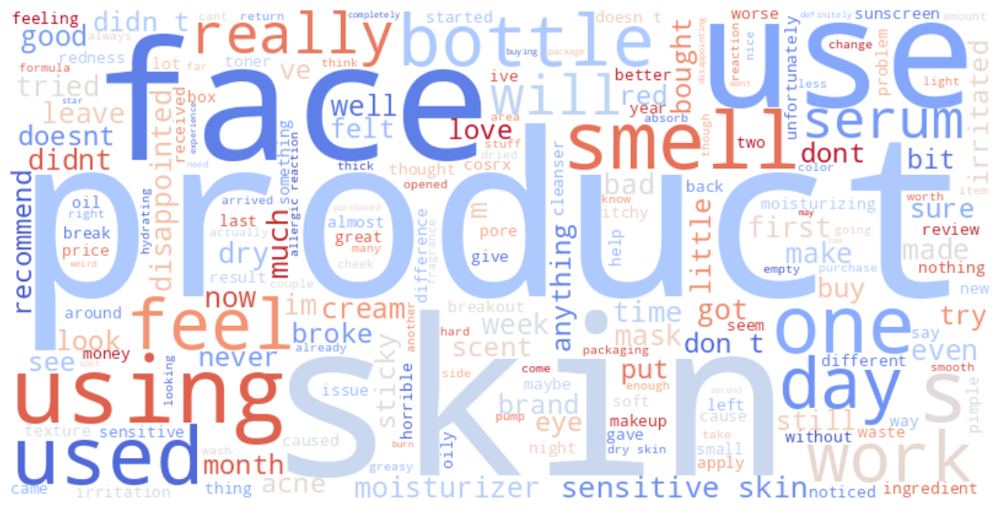

In [66]:
# 부정정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df.query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

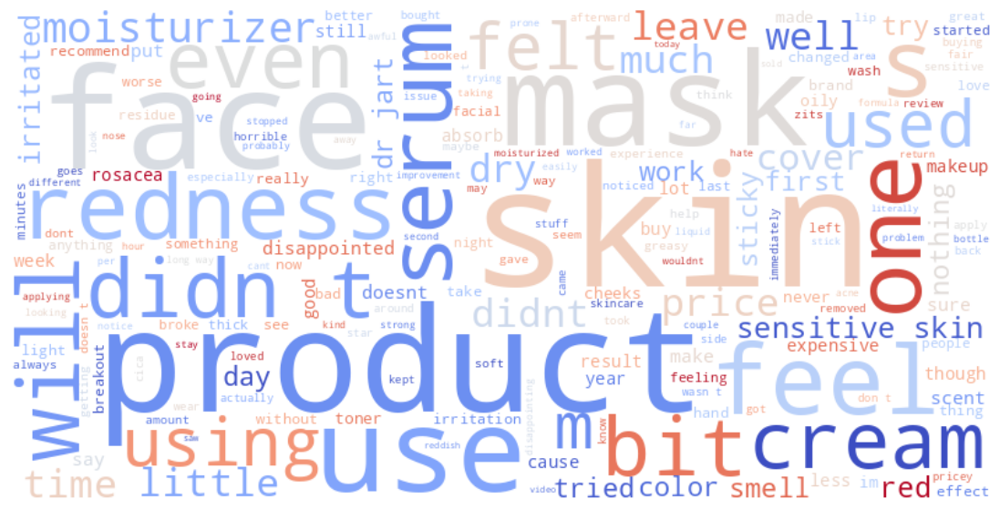

In [67]:
# 부정정적 리뷰 내용 - 워드 클라우드 # Dr.Jart+
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="Dr.Jart+"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

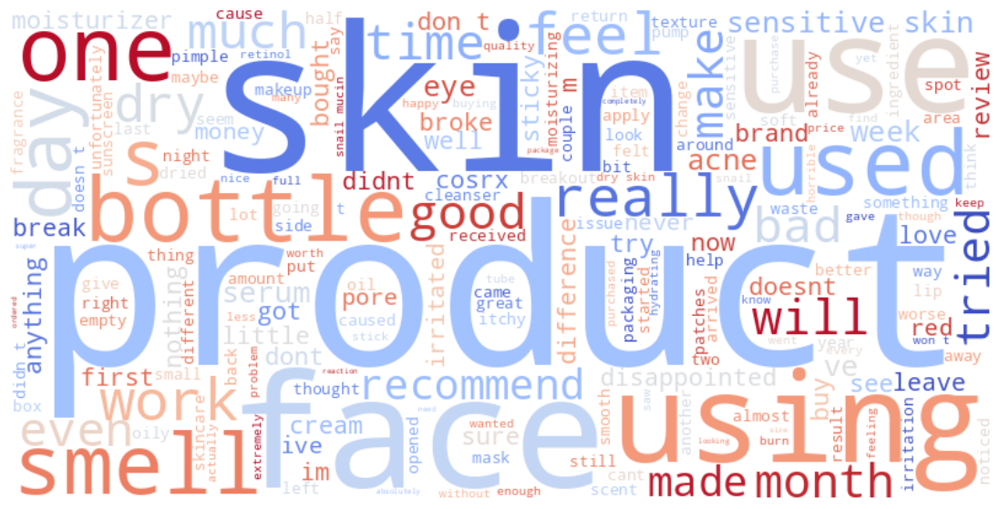

In [68]:
# 부정정적 리뷰 내용 - 워드 클라우드 # COSRX
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="COSRX"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

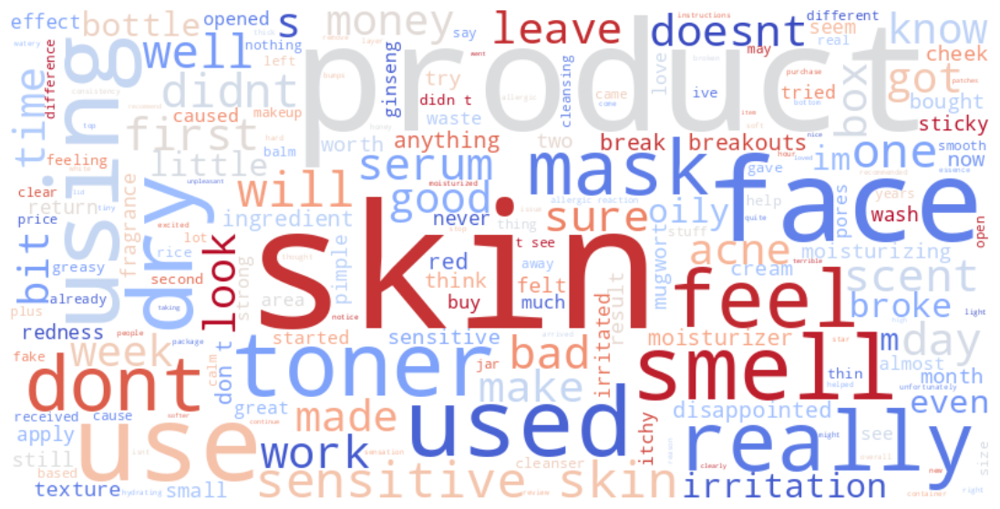

In [69]:
# 부정정적 리뷰 내용 - 워드 클라우드 # I'm from
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="I'm from"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

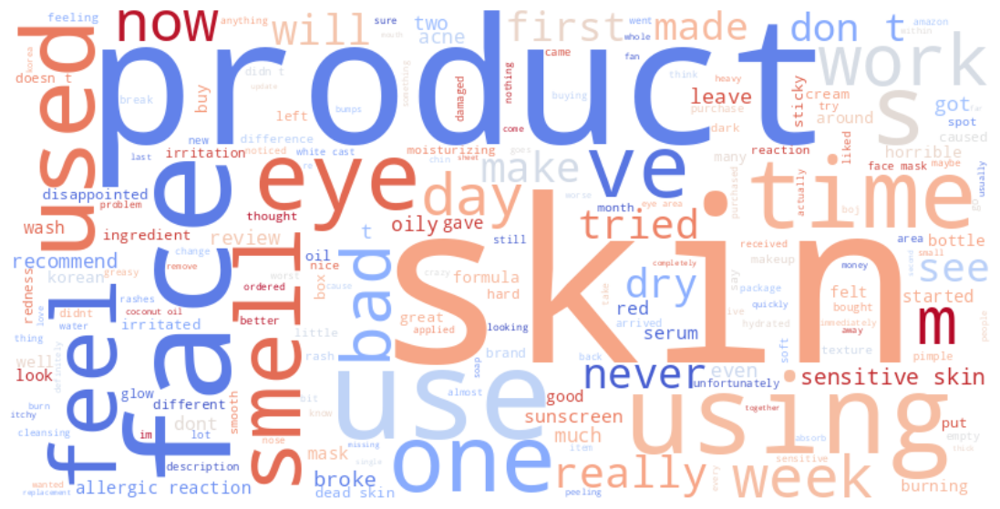

In [70]:
# 부정정적 리뷰 내용 - 워드 클라우드 # Beauty of Joseon
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="Beauty of Joseon"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

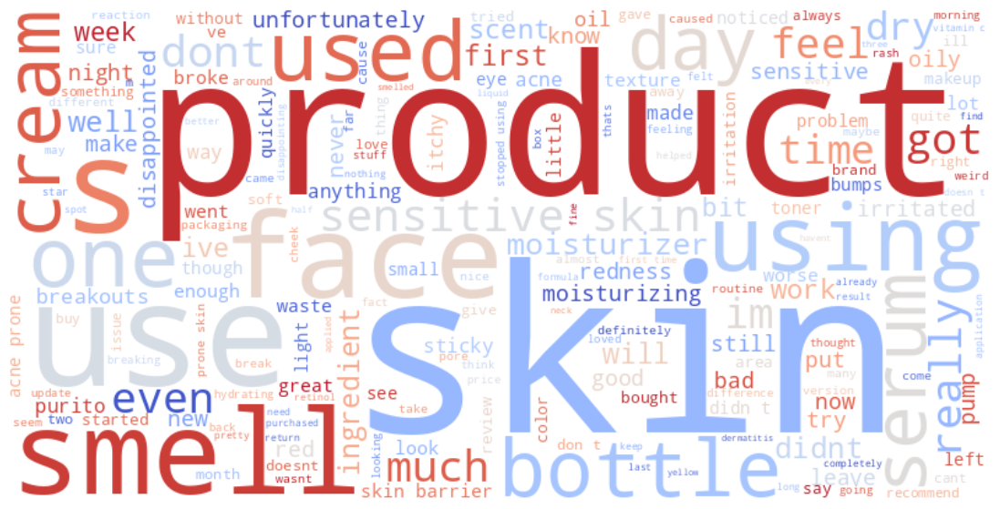

In [71]:
# 부정정적 리뷰 내용 - 워드 클라우드 # PURITO
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="PURITO"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

> 부정 리뷰
- dry <-> sticky, expected (기대치에 떨어진듯), money (돈이 아깝다는 건지, 비싸다는 건지 리뷰 원본 봐야됨), waste, damaged (제품 패키지가 손상? 본인의 피부가 손상?), horrible..

    - 건조하다 <-> 끈적거린다 : 이거는 고객 피부 타입별로 맞춤형 필요해보임
        waste, damaged, horrible 등 최악의 평가를 받은 리뷰는 내용 확인해볼 필요 있어보임.

## ■ Skinsort

### Sentiment Analysis

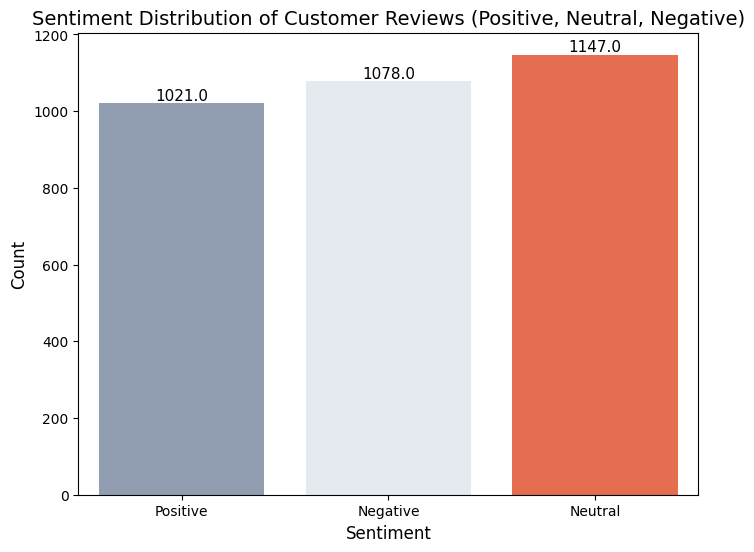

In [72]:
# 스킨쏘트
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=k_skin_brand, x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

### Word Cloud by each sentiment

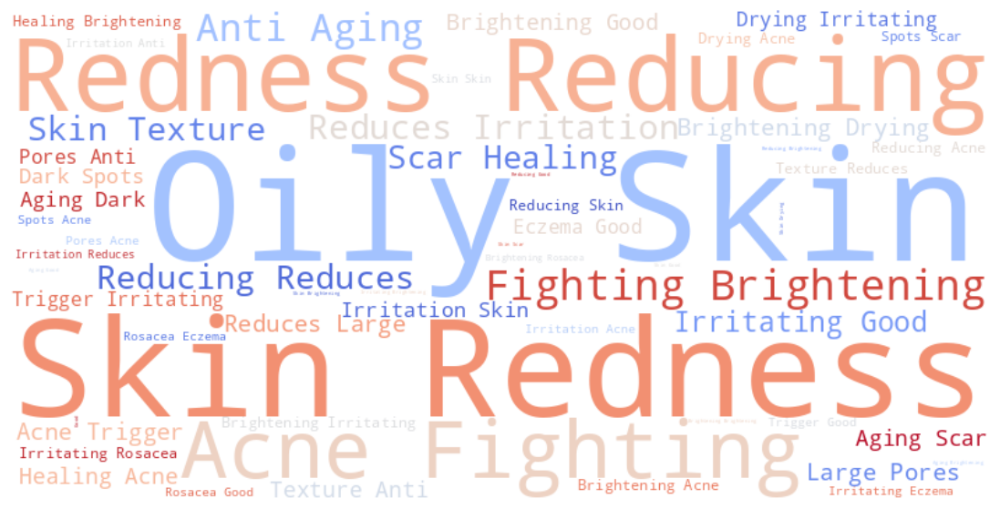

In [73]:
# 긍정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Positive"'
pos_df = k_skin_brand.query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['afterUse'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

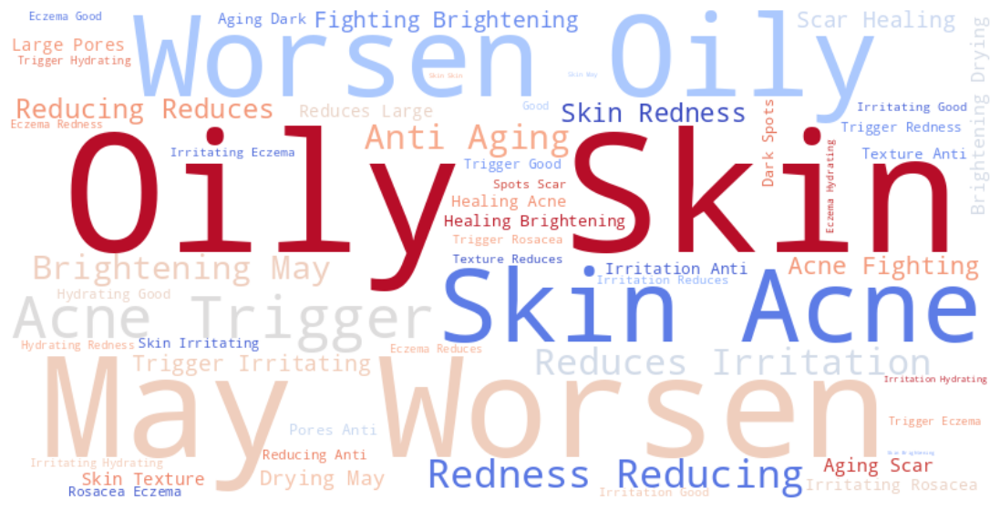

In [74]:
# 부정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Negative"'
pos_df = k_skin_brand.query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400,
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['afterUse'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

## Topic Modeling

https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

In [44]:
# ! pip install pyLDAvis

import gensim
from gensim.utils import simple_preprocess
import gensim.corpora as corpora
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim import corpora
from pprint import pprint
import pyLDAvis.gensim
import pickle
import pyLDAvis


In [75]:
amazon_skinsort_copy = pd.merge(amazon_df, skinsort_copy, on='brand', how='inner')
amazon_skinsort_copy.head()

,ASIN,title,order,Amazon_Category,brand,price,global_rating_count,Special_Feature,total_star_mean,Benefits,Description,Suggested use,Manufacturer,Country of Origin,Item model number,Product Dimensions,Is Discontinued By Manufacturer,UPC,Language,Category,Sub_Category,Category_Rank,Category_Name,Sub_Category_Rank,Sub_Category_Name,index_x,review_num,customer_id,customer_name,review_rating,review_content,review_date,detected_language,Ingredients,Manufacturer recommended age,Date First Available,Batteries,Department,Package Dimensions,is_bundle,cleaned_title,cleaned_review,tokenized_title,tokenized_review,stemmed_title,stemmed_review,stpw_processed_title,stpw_processed_review,lemmatized_title,lemmatized_review,vader_scores,compound,sentiment,index_y,name,type,country,ingridients,afterUse,cleaned_ingridients,cleaned_afterUse,tokenized_ingridients,tokenized_afterUse,stemmed_ingridients,stemmed_afterUse,stpw_processed_ingridients,stpw_processed_afterUse,lemmatized_ingridients,lemmatized_afterUse
0,B00OZ63ODA,COSRX AHA/BHA Treatment Toner 5.07 fl.oz/ 150m...,39,Skin Care Products,COSRX,11.29,6087,NaN,4.6,NaN,NaN,NaN,"Mainspring America, Inc. DBA Direct Cosmetics",USA,8809416470030,2 x 1.4 x 2.8 inches; 6.35 ounces,No,713195339113 888243068113 758614286647 8202571...,NaN,"16,162 in Beauty & Personal Care (See Top 100 ...",137 in Facial Toners & Astringents,16162,Beauty & Personal Care,137,Facial Toners & Astr,0,B00OZ63ODA__0,R2ZCPDF9K7UU3I,Amazon Customer,5.0,The absolute best skincare line I've found. Co...,2025-01-02,en,"Water, Salix Alba (Willow) Bark Water, Pyrus M...",NaN,NaN,NaN,NaN,NaN,NaN,cosrx ahabha treatment toner 507 floz 150ml fa...,the absolute best skincare line ive found comp...,"[cosrx, ahabha, treatment, toner, 507, floz, 1...","[the, absolute, best, skincare, line, ive, fou...","[cosrx, ahabha, treatment, toner, 507, floz, 1...","[the, absolut, best, skincar, line, ive, found...","[ahabha, treatment, toner, exfoliating, spray,...","[absolute, ive, comparable, luxury, scent, lig...","[ahabha, treatment, toner, exfoliating, spray,...","[absolute, ive, comparable, luxury, scent, lig...","{'neg': 0.11, 'neu': 0.625, 'pos': 0.265, 'com...",0.802,Positive,4,Low pH Good Morning Gel Cleanser,Face Cleanser,South Korea,"Water,Cocamidopropyl Betaine,Sodium Lauroyl Me...","Good For Oily Skin,Reduces Irritation,Reduces ...",watercocamidopropyl betainesodium lauroyl meth...,good for oily skinreduces irritationreduces la...,"[watercocamidopropyl, betainesodium, lauroyl, ...","[good, for, oily, skinreduces, irritationreduc...","[watercocamidopropyl, betainesodium, lauroyl, ...","[good, for, oili, skinreduc, irritationreduc, ...","[watercocamidopropyl, betainesodium, lauroyl, ...","[oily, skinreduces, irritationreduces, large, ...","[watercocamidopropyl, betainesodium, lauroyl, ...","[oily, skinreduces, irritationreduces, large, ..."
1,B00OZ63ODA,COSRX AHA/BHA Treatment Toner 5.07 fl.oz/ 150m...,39,Skin Care Products,COSRX,11.29,6087,NaN,4.6,NaN,NaN,NaN,"Mainspring America, Inc. DBA Direct Cosmetics",USA,8809416470030,2 x 1.4 x 2.8 inches; 6.35 ounces,No,713195339113 888243068113 758614286647 8202571...,NaN,"16,162 in Beauty & Personal Care (See Top 100 ...",137 in Facial Toners & Astringents,16162,Beauty & Personal Care,137,Facial Toners & Astr,0,B00OZ63ODA__0,R2ZCPDF9K7UU3I,Amazon Customer,5.0,The absolute best skincare line I've found. Co...,2025-01-02,en,"Water, Salix Alba (Willow) Bark Water, Pyrus M...",NaN,NaN,NaN,NaN,NaN,NaN,cosrx ahabha treatment toner 507 floz 150ml fa...,the absolute best skincare line ive found comp...,"[cosrx, ahabha, treatment, toner, 507, floz, 1...","[the, absolute, best, skincare, line, ive, fou...","[cosrx, ahabha, treatment, toner, 507, floz, 1...","[the, absolut, best, skincar, line, ive, found...","[ahabha, treatment, toner, exfoliating, spray,...","[absolute, ive, comparable, luxury, scent, lig...","[ahabha, treatment, toner, exfoliating, spray,...","[absolute, ive, comparable, luxury, scent, l

In [63]:
brand_list = ['Dr.Jart+', 'COSRX', "I'm from", 'Beauty of Joseon','PURITO', 'Torriden']
query_cond = "brand == 'Dr.Jart+' or brand == 'COSRX' or brand == \"I'm from\" or brand == 'Beauty of Joseon' or brand == 'PURITO' or brand == 'Torriden'"
skin_5_brands = skinsort_copy.query(query_cond).reset_index(drop=True)
skin_5_brands.head()

,index,brand,name,type,country,ingridients,afterUse,cleaned_ingridients,cleaned_afterUse,tokenized_ingridients,tokenized_afterUse,stemmed_ingridients,stemmed_afterUse,stpw_processed_ingridients,stpw_processed_afterUse,bigrammed_ingridients,bigrammed_afterUse,lemmatized_ingridients,lemmatized_afterUse
0,4,COSRX,Low pH Good Morning Gel Cleanser,Face Cleanser,South Korea,"Water, Cocamidopropyl Betaine, Sodium Lauroyl ...","Good For Oily Skin, Reduces Irritation, Reduce...",water cocamidopropyl betaine sodium lauroyl me...,good for oily skin reduces irritation reduces ...,"[water, cocamidopropyl, betaine, sodium, lauro...","[good, for, oily, skin, reduces, irritation, r...","[water, cocamidopropyl, betain, sodium, lauroy...","[good, for, oili, skin, reduc, irrit, reduc, l...","[water, cocamidopropyl, betaine, sodium, lauro...","[oily, reduces, irritation, reduces, large, po...","[water, cocamidopropyl, betaine, sodium, lauro...","[oily, reduces, irritation, reduces, large, po...","[water, cocamidopropyl, betaine, sodium, lauro...","[oily, reduces, irritation, reduces, large, po..."
1,7,COSRX,Advanced Snail 92 All In One Cream,General Moisturizer,South Korea,"Snail Secretion Filtrate, Betaine, Caprylic/Ca...","Redness Reducing, Reduces Irritation, May Wors...",snail secretion filtrate betaine capryliccapri...,redness reducing reduces irritation may worsen...,"[snail, secretion, filtrate, betaine, caprylic...","[redness, reducing, reduces, irritation, may, ...","[snail, secret, filtrat, betain, capryliccapr,...","[red, reduc, reduc, irrit, may, worsen, oili, ...","[snail, secretion, filtrate, betaine, caprylic...","[redness, reducing, reduces, irritation, may, ...","[snail, secretion, filtrate, betaine, caprylic...","[redness, reducing, reduces, irritation, may, ...","[snail, secretion, filtrate, betaine, caprylic...","[redness, reducing, reduces, irritation, may, ..."
2,9,Beauty of Joseon,Relief Sun : Rice + Probiotics,Sunscreen,South Korea,"Water, Oryza Sativa Extract 30%, Dibutyl Adipa...","Good For Oily Skin, Redness Reducing, Acne Fig...",water oryza sativa extract 30 dibutyl adipate ...,good for oily skin redness reducing acne fight...,"[water, oryza, sativa, extract, 30, dibutyl, a...","[good, for, oily, skin, redness, reducing, acn...","[water, oryza, sativa, extract, 30, dibutyl, a...","[good, for, oili, skin, red, reduc, acn, fight...","[water, oryza, sativa, extract, 30, dibutyl, a...","[oily, redness, reducing, acne, fighting, brig...","[water, oryza, sativa, extract, 30, dibutyl, a...","[oily, redness, reducing, acne, fighting, brig...","[water, oryza, sativa, extract, 30, dibutyl, a...","[oily, redness, reducing, acne, fighting, brig..."
3,1796,I'm from,Mugwort Gel Cleanser,Face Cleanser,South Korea,"Artemisia Princeps Extract, Water, Sodium C14-...","Drying, Acne Trigger",artemisia princeps extract water sodium c1416 ...,drying acne trigger,"[artemisia, princeps, extract, water, sodium, ...","[drying, acne, trigger]","[artemisia, princep, extract, water, sodium, c...","[dri, acn, trigger]","[artemisia, princeps, extract, water, sodium, ...","[drying, acne, trigger]","[artemisia, princeps, extract, water, sodium, ...","[drying, acne, trigger]","[artemisia, princeps, extract, water, sodium, ...","[drying, acne, trigger]"
4,2572,Beauty of Joseon,Low pH Rice Face and Body Cleansing Bar,Bath & Body,South Korea,"Sodium Cocoyl Isethionate, Zea Mays Starch, Wa...","Reduces Large Pores, Drying, Acne Trigger, Irr...",sodium cocoyl isethionate zea mays starch wate...,reduces large pores drying acne trigger irrita...,"[sodium, cocoyl, isethionate, zea, mays, starc...","[reduces, large, pores, drying, acne, trigger,...","[sodium, cocoyl, isethion, zea, may, starch, w...","[reduc, larg, pore, dri, acn, trigger, irrit]","[sodium, cocoyl, isethionate, zea, mays, starc...","[reduces, large, pores, drying, acne, trigger,...","[sodium, cocoyl, isethionate, zea, mays, starc...","[reduces, large, pores, drying, acne, trigger,...","[sodium

In [81]:
# Prepare data for LDA Analysis
# data_words = skin_5_brands.lemmatized_ingridients.tolist() # tokenized, stemmed, lemmatized
data_words = amazon_df.lemmatized_review.tolist() # tokenized, stemmed, lemmatized
print(data_words[:1][0][:30])

# Create Dictionary
data_words = [doc for doc in data_words if doc is not None]
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

# LDA model training
# number of topics
num_topics = 20
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                        id2word=id2word,
                                        num_topics=num_topics, passes=10, iterations=200)
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

['hype', '’', '’', 'gone', 'plan', 'ever', 'reorder']
[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 2)]
[(0,
  '0.077*"patch" + 0.031*"pimple" + 0.030*"•" + 0.028*"spot" + 0.028*"acne" + '
  '0.024*"work" + 0.023*"help" + 0.022*"sponge" + 0.015*"well" + '
  '0.013*"overnight"'),
 (1,
  '0.113*"toner" + 0.083*"like" + 0.063*"smell" + 0.051*"bottle" + 0.031*"pad" '
  '+ 0.016*"rice" + 0.016*"cotton" + 0.015*"bit" + 0.015*"come" + '
  '0.012*"little"'),
 (2,
  '0.112*"cream" + 0.044*"eye" + 0.026*"night" + 0.023*"retinol" + '
  '0.016*"area" + 0.015*"dry" + 0.014*"well" + 0.013*"morning" + 0.013*"day" + '
  '0.012*"spot"'),
 (3,
  '0.048*"cleanser" + 0.033*"scent" + 0.027*"clean" + 0.023*"well" + '
  '0.022*"gentle" + 0.020*"great" + 0.017*"smell" + 0.015*"face" + '
  '0.014*"cleansing" + 0.013*"pump"'),
 (4,
  '0.138*"sunscreen" + 0.060*"sun" + 0.047*"white" + 0.043*"excellent" + '
  '0.025*"protection" + 0.021*"u" + 0.021*"cast" + 0.017*"korean" + '
  '0.015*"spf" + 0.013*"acneprone"'),


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
16     0.025097 -0.157919       1        1  12.342939
12     0.015331 -0.174339       2        1  11.672010
17    -0.039518 -0.191780       3        1   7.870535
18     0.226161  0.036169       4        1   7.855840
19     0.155949  0.072383       5        1   7.311494
2      0.121899 -0.060140       6        1   6.786689
3      0.158086  0.023880       7        1   5.863521
10     0.115592 -0.048916       8        1   5.405519
7      0.222380  0.172246       9        1   4.542029
11    -0.145327 -0.119261      10        1   4.475809
15    -0.044408  0.050230      11        1   3.763943
14    -0.016228 -0.025971      12        1   3.579916
1     -0.087047 -0.019744      13        1   3.189860
0     -0.096475 -0.100541      14        1   2.962011
8      0.043377  0.038910      15        1   2.776213
6      0.031728  0.070465      16        1   2.741390
9     -0.152194 -0.039759      17        1   2.243422
5     -0.172557  0.024701      18        1   1.888745
4     -0.197425  0.250569      19        1   1.541217
13    -0.164421  0.198817      20        1   1.186898, topic_info=                 Term         Freq        Total Category  logprob  loglift
5                   ’  7497.000000  7497.000000  Default  30.0000  30.0000
922             serum  2340.000000  2340.000000  Default  29.0000  29.0000
193             cream  2726.000000  2726.000000  Default  28.0000  28.0000
10              great  2188.000000  2188.000000  Default  27.0000  27.0000
1026            toner  1227.000000  1227.000000  Default  26.0000  26.0000
1908         cleanser  1233.000000  1233.000000  Default  25.0000  25.0000
69               like  4155.000000  4155.000000  Default  24.0000  24.0000
75              smell  1471.000000  1471.000000  Default  23.0000  23.0000
17          sunscreen   580.000000   580.000000  Default  22.0000  22.0000
621             patch   620.000000   620.000000  Default  21.0000  21.0000
438               eye   860.000000   860.000000  Default  20.0000  20.0000
416            bottle  1133.000000  1133.000000  Default  19.0000  19.0000
15            redness   669.000000   669.000000  Default  18.0000  18.0000
22               face  3577.000000  3577.000000  Default  17.0000  17.0000
140              feel  1608.000000  1608.000000  Default  16.0000  16.0000
223              nice  1375.000000  1375.000000  Default  15.0000  15.0000
964            lotion   610.000000   610.000000  Default  14.0000  14.0000
1857          retinol   852.000000   852.000000  Default  13.0000  13.0000
851              soft  1181.000000  1181.000000  Default  12.0000  12.0000
197           feeling  1118.000000  1118.000000  Default  11.0000  11.0000
30               acne   662.000000   662.000000  Default  10.0000  10.0000
157             scent  1327.000000  1327.000000  Default   9.0000   9.0000
974             clean   650.000000   650.000000  Default   8.0000   8.0000
727              leaf   904.000000   904.000000  Default   7.0000   7.0000
918            korean   699.000000   699.000000  Default   6.0000   6.0000
617               oil   616.000000   616.000000  Default   5.0000   5.0000
106              well  2320.000000  2320.000000  Default   4.0000   4.0000
39         foundation   654.000000   654.000000  Default   3.0000   3.0000
269              spot   497.000000   497.000000  Default   2.0000   2.0000
202              help   858.000000   858.000000  Default   1.0000   1.0000
4092          cushion   351.252970   352.051380   Topic1  -4.5611   2.0898
2803            bloom   146.568146   147.366504   Topic1  -5.4351   2.0867
331             shade   276.712489   278.964186   Topic1  -4.7996   2.0840
5011             wave    95.685199    96.483557   Topic1  -5.8615   2.0838
4267         odorless    75.574242    76.372600   Topic1  -6.0975   2.0816
4627           format    70.935024    71.733382   Topic1  -6.1608   2

### LDA Model

In [27]:
amazon_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12797 entries, 0 to 2387
Data columns (total 50 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   ASIN                             12797 non-null  object        
 1   title                            12797 non-null  object        
 2   order                            12797 non-null  int64         
 3   Amazon_Category                  12797 non-null  object        
 4   brand                            12797 non-null  object        
 5   price                            12452 non-null  float64       
 6   global_rating_count              12797 non-null  Int64         
 7   Special_Feature                  2701 non-null   object        
 8   total_star_mean                  12797 non-null  float64       
 9   Benefits                         1771 non-null   object        
 10  Description                      1771 non-null   object        


In [29]:
# amazon_df_sa : 평점 4점 이상 / amazon_df_dsa : 평점 2점 이하
amazon_df_sa = amazon_df[amazon_df['review_rating'] >= 4]
amazon_df_dsa = amazon_df[amazon_df['review_rating'] <= 2]

In [30]:
# amazon_df_sa : 평점 4점 이상 / amazon_df_dsa : 평점 2점 이하
amazon_df_sa_dr = amazon_df_sa[amazon_df_sa['brand'] == 'Dr.Jart+']
amazon_df_sa_cs = amazon_df_sa[amazon_df_sa['brand'] == 'COSRX']
amazon_df_sa_bj = amazon_df_sa[amazon_df_sa['brand'] == 'Beauty of Joseon']
amazon_df_sa_if = amazon_df_sa[amazon_df_sa['brand'] == "I'm from"]
amazon_df_sa_pu = amazon_df_sa[amazon_df_sa['brand'] == 'PURITO']

In [31]:
amazon_df_dsa_dr = amazon_df_dsa[amazon_df_dsa['brand'] == 'Dr.Jart+']
amazon_df_dsa_cs = amazon_df_dsa[amazon_df_dsa['brand'] == 'COSRX']
amazon_df_dsa_bj = amazon_df_dsa[amazon_df_dsa['brand'] == 'Beauty of Joseon']
amazon_df_dsa_if = amazon_df_dsa[amazon_df_dsa['brand'] == "I'm from"]
amazon_df_dsa_pu = amazon_df_dsa[amazon_df_dsa['brand'] == 'PURITO']

In [32]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_sa.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

In [33]:
# ! pip install pyLDAvis

import gensim
from gensim.utils import simple_preprocess
import gensim.corpora as corpora
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim import corpora
from pprint import pprint
import pyLDAvis.gensim
import pickle
import pyLDAvis

In [34]:
# 20250129 토픽 모델링 재정의

In [35]:
final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

In [36]:
coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


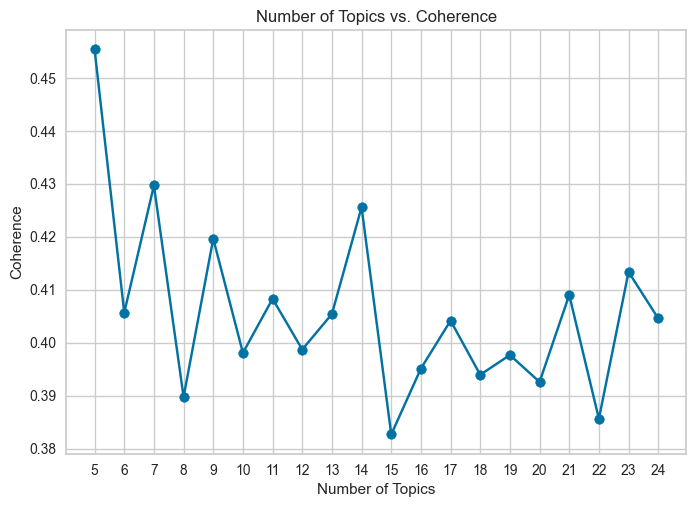

In [37]:
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [38]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

In [39]:
Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

In [40]:
# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

[(0,
  [('’', 0.12505277),
   ('skin', 0.034747932),
   ('kit', 0.017721007),
   ('feel', 0.017347412),
   ('soft', 0.017188052),
   ('cream', 0.016583877),
   ('need', 0.016279928),
   ('since', 0.016072268),
   ('bottle', 0.0153263025),
   ('everything', 0.014719822)]),
 (1,
  [('product', 0.04429437),
   ('skin', 0.028493373),
   ('set', 0.027335213),
   ('think', 0.025907202),
   ('like', 0.022658903),
   ('quite', 0.01902509),
   ('bit', 0.018428825),
   ('everything', 0.015816666),
   ('really', 0.01459722),
   ('try', 0.014342817)]),
 (2,
  [('skin', 0.04511116),
   ('use', 0.015330934),
   ('product', 0.015117555),
   ('face', 0.014991688),
   ('feel', 0.012871439),
   ('like', 0.01260326),
   ('love', 0.010326029),
   ('using', 0.009146311),
   ('good', 0.0081750415),
   ('one', 0.00806889)]),
 (3,
  [('skin', 0.058872547),
   ('product', 0.0368809),
   ('cream', 0.027184727),
   ('come', 0.021557575),
   ('panthenol', 0.019080974),
   ('well', 0.01547859),
   ('box', 0.015406

In [41]:
# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [42]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19     0.230911 -0.047884       1        1  33.605279
16     0.252640 -0.035073       2        1  16.600353
11     0.267028 -0.040175       3        1  12.696505
14     0.203053  0.050434       4        1   5.362163
22     0.167875  0.032904       5        1   4.165591
6      0.200465  0.159267       6        1   4.163305
0      0.014782 -0.187029       7        1   2.522005
15    -0.041766 -0.132391       8        1   2.479267
5     -0.135799 -0.035805       9        1   1.931055
9     -0.005369  0.217362      10        1   1.919790
12    -0.084179 -0.119609      11        1   1.884198
1     -0.078077 -0.042052      12        1   1.706480
3     -0.020705 -0.062828      13        1   1.668585
17    -0.043127 -0.060521      14        1   1.384417
10    -0.039174 -0.107842      15        1   1.113994
4     -0.115241 -0.071880      16        1   1.112683
2     -0.087910  0.243997      17        1   1.055964
13    -0.075380  0.010062      18        1   1.018769
18    -0.165783  0.024593      19        1   0.845408
7     -0.095467  0.029053      20        1   0.790840
21    -0.104123 -0.034341      21        1   0.743831
8     -0.113707 -0.018936      22        1   0.649664
20    -0.130947  0.228697      23        1   0.579854, topic_info=                       Term          Freq         Total Category  logprob  \
47                     skin  12290.000000  12290.000000  Default  30.0000   
14                        ’   4841.000000   4841.000000  Default  29.0000   
11                  product   5438.000000   5438.000000  Default  28.0000   
144                    love   2453.000000   2453.000000  Default  27.0000   
53                      use   3272.000000   3272.000000  Default  26.0000   
66                     like   3261.000000   3261.000000  Default  25.0000   
78                    using   2123.000000   2123.000000  Default  24.0000   
4                      face   3355.000000   3355.000000  Default  23.0000   
334                  really   2070.000000   2070.000000  Default  22.0000   
813                   serum   1930.000000   1930.000000  Default  21.0000   
125                   cream   2122.000000   2122.000000  Default  20.0000   
179             moisturizer   1256.000000   1256.000000  Default  19.0000   
182                    well   1934.000000   1934.000000  Default  18.0000   
30                     good   1924.000000   1924.000000  Default  17.0000   
110                   great   2006.000000   2006.000000  Default  16.0000   
149                     one   1780.000000   1780.000000  Default  15.0000   
84                      day   1398.000000   1398.000000  Default  14.0000   
771                    mask   1601.000000   1601.000000  Default  13.0000   
178                    feel   3024.000000   3024.000000  Default  12.0000   
39                recommend   1146.000000   1146.000000  Default  11.0000   
137                    help    829.000000    829.000000  Default  10.0000   
1705               cleanser   1368.000000   1368.000000  Default   9.0000   
887                   toner   1229.000000   1229.000000  Default   8.0000   
1612                    kit   1071.000000   1071.000000  Default   7.0000   
107                   would   1137.000000   1137.000000  Default   6.0000   
173                    nice   1135.000000   1135.000000  Default   5.0000   
24                      dry   1808.000000   1808.000000  Default   4.0000   
198                     set    855.000000    855.000000  Default   3.0000   
85                     dont    659.000000    659.000000  Default   2.0000   
44                sensitive   1485.000000   1485.000000  Default   1.0000   
2177                    pad    289.387871    290.075994   Topic1  -5.8162   
918             niacinamide    170.333965    170.982567   Topic1  -6.3462   
2666            improvement    165.416722    166.065310   Topic1  

In [43]:
topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values

In [44]:
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,skin,product,using,use,ive,used,week,one,im,acne
Topic 2,skin,feel,good,use,great,like,’,nice,smell,smooth
Topic 3,mask,cream,face,dr,hand,jart,like,thick,minute,scent
Topic 4,cleanser,clean,accidental,wash,balm,cleansing,makeup,remove,oil,face
Topic 5,love,amazing,’,snail,mucin,stuff,cosrx,absolutely,skin,glow
Topic 6,wind,foundation,coverage,natural,color,tree,bb,shade,blend,soap
Topic 7,’,kit,wearing,cast,daughter,new,everything,forgot,beach,jumped
Topic 8,residue,without,healthy,ideal,luxurious,downside,broken,key,longlasting,mini
Topic 9,best,nothing,already,written,composed,compete,test,problem,bad,trip
Topic 10,patch,overnight,applies,weekly,inflamed,exfoliants,chemical,green,desk,part


## 브랜드별 진행(4점 이상)

### Dr

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


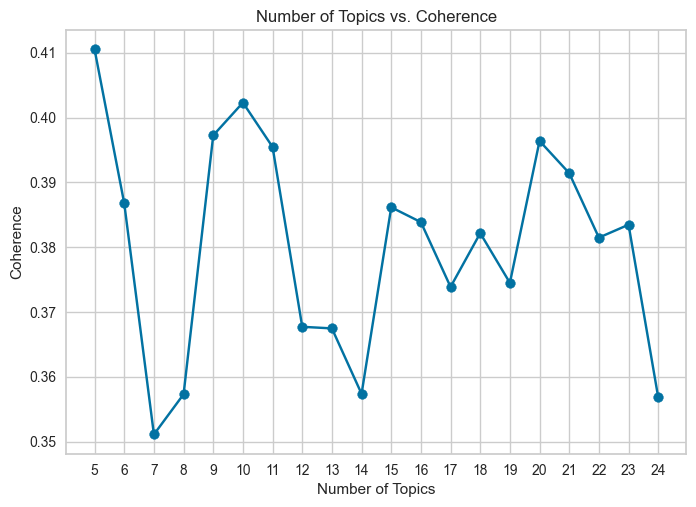

In [78]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_sa_dr.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
        iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
        dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [79]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [80]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
20     0.125871 -0.006716       1        1  15.358521
9      0.047636 -0.001868       2        1  12.510673
21     0.056258 -0.020579       3        1   6.511679
5      0.058715 -0.065550       4        1   6.475905
17     0.034877  0.158177       5        1   5.749618
1      0.034357 -0.040741       6        1   5.571957
11    -0.007239 -0.088289       7        1   4.702283
0     -0.035359 -0.098837       8        1   4.164878
4      0.012899 -0.017587       9        1   3.992349
13     0.027773 -0.054612      10        1   3.903293
22     0.068348 -0.086278      11        1   3.278023
8      0.098778  0.011766      12        1   3.167231
15     0.111810  0.115221      13        1   3.161177
18    -0.082416 -0.087546      14        1   3.126188
12    -0.090416 -0.037102      15        1   3.070202
16    -0.190996  0.017446      16        1   2.833526
2     -0.046608 -0.030259      17        1   2.788808
3     -0.005491  0.010418      18        1   2.282860
14    -0.005470  0.029330      19        1   2.095142
6     -0.058860  0.019874      20        1   1.811948
7     -0.039145  0.074480      21        1   1.664467
19     0.038223  0.091436      22        1   1.431507
10    -0.153545  0.107816      23        1   0.347765, topic_info=                            Term         Freq        Total Category  logprob  \
771                         mask   843.000000   843.000000  Default  30.0000   
14                             ’   793.000000   793.000000  Default  29.0000   
47                          skin  2056.000000  2056.000000  Default  28.0000   
74                     sunscreen   159.000000   159.000000  Default  27.0000   
125                        cream   482.000000   482.000000  Default  26.0000   
1705                    cleanser   112.000000   112.000000  Default  25.0000   
376                          eye   153.000000   153.000000  Default  24.0000   
24                           dry   332.000000   332.000000  Default  23.0000   
1034                         lip   143.000000   143.000000  Default  22.0000   
4                           face   864.000000   864.000000  Default  21.0000   
11                       product   823.000000   823.000000  Default  20.0000   
66                          like   685.000000   685.000000  Default  19.0000   
899                        clean    90.000000    90.000000  Default  18.0000   
41                       redness   243.000000   243.000000  Default  17.0000   
400                         wash    86.000000    86.000000  Default  16.0000   
813                        serum   334.000000   334.000000  Default  15.0000   
53                           use   557.000000   557.000000  Default  14.0000   
85                          dont   152.000000   152.000000  Default  13.0000   
332                         hand   135.000000   135.000000  Default  12.0000   
171                       makeup   141.000000   141.000000  Default  11.0000   
577                          tea    72.000000    72.000000  Default  10.0000   
182                         well   397.000000   397.000000  Default   9.0000   
44                     sensitive   233.000000   233.000000  Default   8.0000   
110                        great   342.000000   342.000000  Default   7.0000   
178                         feel   650.000000   650.000000  Default   6.0000   
130                      feeling   220.000000   220.000000  Default   5.0000   
179                  moisturizer   265.000000   265.000000  Default   4.0000   
578                         tree    64.000000    64.000000  Default   3.0000   
329                     coverage    57.000000    57.000000  Default   2.0000   
144                         love   294.000000   294.000000  Default   1.0000   
2204                        clay    17.555516    19.321505   Topic1  -6.2274   
864                        slide    12.175580  

In [81]:
topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,mask,face,skin,felt,feel,minute,left,sheet,easy,product
Topic 2,skin,moisturizer,without,well,work,product,lightweight,like,great,perfect
Topic 3,cream,skin,hand,night,ceramidin,dry,plump,feel,moisture,soft
Topic 4,lip,balm,product,ive,time,dont,week,using,feel,im
Topic 5,skin,sensitive,redness,complexion,soothing,highly,irritated,recommend,drjart,calming
Topic 6,skin,like,’,didnt,feel,product,sensitive,good,used,seem
Topic 7,’,cream,hand,feel,look,like,thick,bakuchiol,long,scent
Topic 8,’,color,go,dab,bit,hand,know,going,used,price
Topic 9,use,like,skin,product,used,good,brighten,help,c,face
Topic 10,love,skin,product,brand,lotion,’,get,toner,body,moisturizing


### Cs

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


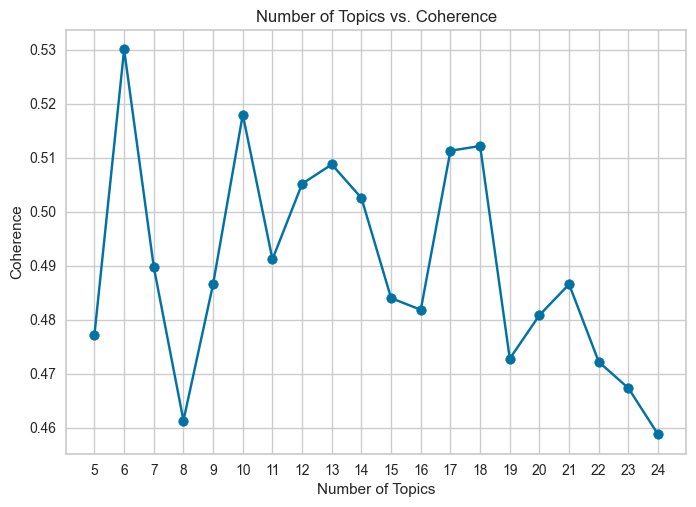

In [82]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_sa_cs.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [83]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [84]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
10     0.168158  0.078413       1        1  12.980494
1      0.056819 -0.041823       2        1   9.232679
20     0.041435 -0.037707       3        1   8.890371
21     0.064470 -0.028786       4        1   8.473243
0      0.084817 -0.061257       5        1   6.499776
11     0.084479 -0.015657       6        1   6.460903
12    -0.088770 -0.170679       7        1   4.661328
4      0.058455 -0.018962       8        1   4.165719
3      0.085154  0.012118       9        1   3.979656
8      0.019808  0.030458      10        1   3.709906
2      0.017265 -0.080810      11        1   3.670025
14     0.009164 -0.057124      12        1   3.249615
19     0.127299  0.137688      13        1   3.200433
15    -0.025809  0.049156      14        1   3.084074
13    -0.001690 -0.019938      15        1   2.829814
9      0.026438 -0.021243      16        1   2.547895
17    -0.065001 -0.112183      17        1   2.536964
18    -0.173861 -0.072951      18        1   2.349839
16     0.022636  0.077309      19        1   2.268416
6     -0.177114  0.151505      20        1   2.011586
5     -0.016776  0.041610      21        1   1.595663
22    -0.147328  0.123163      22        1   0.811585
7     -0.170048  0.037701      23        1   0.790015, topic_info=                  Term         Freq        Total Category  logprob  loglift
13             product  1760.000000  1760.000000  Default  30.0000  30.0000
147                  ’  2000.000000  2000.000000  Default  29.0000  29.0000
34                good   640.000000   640.000000  Default  28.0000  28.0000
22               great   694.000000   694.000000  Default  27.0000  27.0000
273              patch   309.000000   309.000000  Default  26.0000  26.0000
16                skin  3461.000000  3461.000000  Default  25.0000  25.0000
23                love   956.000000   956.000000  Default  24.0000  24.0000
54                work   519.000000   519.000000  Default  23.0000  23.0000
460             pimple   180.000000   180.000000  Default  22.0000  22.0000
21                feel   793.000000   793.000000  Default  21.0000  21.0000
296                way   209.000000   209.000000  Default  20.0000  20.0000
300               long   220.000000   220.000000  Default  19.0000  19.0000
383               well   432.000000   432.000000  Default  18.0000  18.0000
310                 go   274.000000   274.000000  Default  17.0000  17.0000
2                 best   229.000000   229.000000  Default  16.0000  16.0000
51               snail   213.000000   213.000000  Default  15.0000  15.0000
33                face   956.000000   956.000000  Default  14.0000  14.0000
591          excellent    71.000000    71.000000  Default  13.0000  13.0000
633           cleanser   234.000000   234.000000  Default  12.0000  12.0000
1077               eye   241.000000   241.000000  Default  11.0000  11.0000
234               leaf   226.000000   226.000000  Default  10.0000  10.0000
651             little   338.000000   338.000000  Default   9.0000   9.0000
48               mucin   155.000000   155.000000  Default   8.0000   8.0000
202               like   781.000000   781.000000  Default   7.0000   7.0000
123             bottle   217.000000   217.000000  Default   6.0000   6.0000
39                nice   220.000000   220.000000  Default   5.0000   5.0000
244                one   626.000000   626.000000  Default   4.0000   4.0000
1733              mask   241.000000   241.000000  Default   3.0000   3.0000
235               acne   237.000000   237.000000  Default   2.0000   2.0000
400              price   189.000000   189.000000  Default   1.0000   1.0000
3694              lite     2.920719     3.798975   Topic1  -8.2220   1.7788
2692       spectacular     2.920354     3.798720   Topic1  -8.2221   1.7788
3556           monthly     2.875095     3.795513   Topic1  -8.2377   1.7640
36             leaving 

In [85]:
topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,skin,feel,soft,feeling,dry,use,sensitive,great,love,moisturizer
Topic 2,’,skin,product,using,blackhead,oily,second,much,decided,“
Topic 3,eye,product,skin,line,fine,use,using,face,first,around
Topic 4,skin,cream,use,im,face,serum,product,ive,’,using
Topic 5,skin,using,’,difference,used,week,started,change,ever,best
Topic 6,snail,mucin,mask,face,’,glow,friend,skin,love,like
Topic 7,pimple,patch,acne,one,white,head,gone,cystic,spot,smaller
Topic 8,’,cleanser,like,smell,face,doesnt,skin,leave,oil,good
Topic 9,love,skin,leaf,hydrated,product,best,really,awesome,smooth,sensitive
Topic 10,good,far,quality,’,scent,face,really,wash,smell,cream


### Bj

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


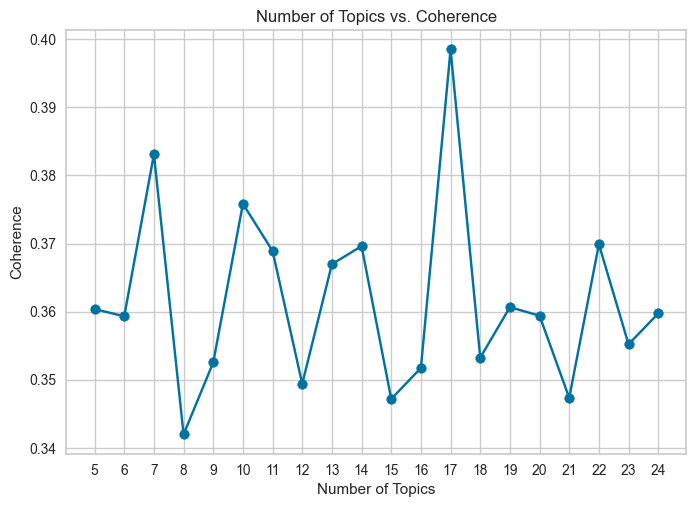

In [86]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_sa_bj.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [87]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [88]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
19     0.040605  0.061468       1        1  9.127851
10     0.188077 -0.079581       2        1  8.514253
6      0.053363  0.005538       3        1  7.455220
22     0.032406  0.017634       4        1  7.189351
7      0.052814 -0.001043       5        1  7.081441
9      0.025503  0.064555       6        1  7.007065
2      0.057899  0.051209       7        1  6.310751
5      0.057439  0.031221       8        1  6.036096
0      0.014157  0.046634       9        1  5.634860
21     0.045068  0.062290      10        1  4.814799
16     0.035166 -0.081127      11        1  4.264153
8     -0.013657  0.075591      12        1  3.687536
4      0.036729  0.038341      13        1  3.440680
15     0.023824 -0.009500      14        1  3.439776
20    -0.032311  0.031681      15        1  2.793472
11     0.061913 -0.084022      16        1  2.763965
1     -0.028748  0.010600      17        1  2.086322
14    -0.169913  0.110974      18        1  1.790292
3     -0.060146 -0.121723      19        1  1.516978
12    -0.149602 -0.111469      20        1  1.422066
13    -0.063905 -0.066195      21        1  1.392400
17    -0.050207 -0.062629      22        1  1.347104
18    -0.156475  0.009552      23        1  0.883573, topic_info=                      Term         Freq        Total Category  logprob  \
78                       ’   602.000000   602.000000  Default  30.0000   
33                    skin  1191.000000  1191.000000  Default  29.0000   
97                    feel   321.000000   321.000000  Default  28.0000   
141                  serum   213.000000   213.000000  Default  27.0000   
46                    face   305.000000   305.000000  Default  26.0000   
48                 product   449.000000   449.000000  Default  25.0000   
22                    mask   173.000000   173.000000  Default  24.0000   
511                 makeup    96.000000    96.000000  Default  23.0000   
596              sunscreen    58.000000    58.000000  Default  22.0000   
148                   good   220.000000   220.000000  Default  21.0000   
297                  great   168.000000   168.000000  Default  20.0000   
21                    make   132.000000   132.000000  Default  19.0000   
47                    leaf   111.000000   111.000000  Default  18.0000   
237                  toner   104.000000   104.000000  Default  17.0000   
50                    soft   153.000000   153.000000  Default  16.0000   
20                    love   318.000000   318.000000  Default  15.0000   
788                    eye    88.000000    88.000000  Default  14.0000   
1298                 white    26.000000    26.000000  Default  13.0000   
1049                     c    31.000000    31.000000  Default  12.0000   
19                    like   273.000000   273.000000  Default  11.0000   
145                  using   200.000000   200.000000  Default  10.0000   
623             difference    40.000000    40.000000  Default   9.0000   
1087               vitamin    29.000000    29.000000  Default   8.0000   
213                    one   161.000000   161.000000  Default   7.0000   
191                 smooth    94.000000    94.000000  Default   6.0000   
423                  loved    25.000000    25.000000  Default   5.0000   
84                hydrated    84.000000    84.000000  Default   4.0000   
305                   best    59.000000    59.000000  Default   3.0000   
170                  scent    91.000000    91.000000  Default   2.0000   
130                    get   106.000000   106.000000  Default   1.0000   
1234            exfoliator     8.456898    10.155379   Topic1  -5.6788   
3185                ground     2.846140     3.664692   Topic1  -6.7679   
1502              brighten     2.846129     3.664683   Topic1  -6.7679   
1010                scared     2.846054     3.664620   Topic1  -6.7679   
2294                doctor     1.910836   

In [89]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,mask,’,face,skin,use,pore,bean,exfoliator,felt,10
Topic 2,skin,leaf,soft,hydrated,love,feel,great,dry,product,feeling
Topic 3,skin,feel,like,product,using,really,see,peeling,love,face
Topic 4,skin,ive,im,serum,use,face,product,dont,overall,like
Topic 5,love,great,skin,brand,balm,serum,texture,’,everything,product
Topic 6,’,face,would,skin,apply,3,work,washed,think,one
Topic 7,’,need,pretty,skin,using,tell,soap,bar,really,like
Topic 8,good,skin,’,extract,smell,price,rice,leaf,make,definitely
Topic 9,serum,calming,use,loving,essence,oil,month,never,ginseng,product
Topic 10,’,skincare,best,skin,product,korean,routine,left,care,favorite


### If

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


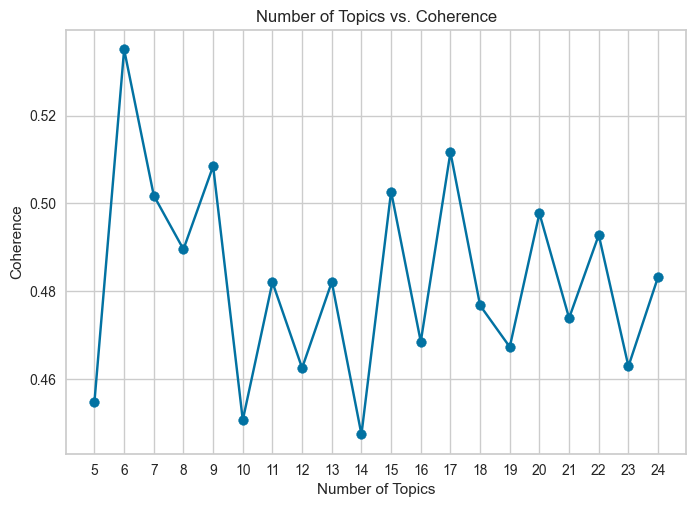

In [90]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_sa_if.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [91]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [92]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
13     0.049214 -0.032036       1        1  13.221309
2      0.080133 -0.049843       2        1   9.994168
20     0.112821 -0.041763       3        1   8.689003
17     0.047490 -0.066216       4        1   8.004355
6      0.091705  0.025249       5        1   7.184526
0      0.039211 -0.049712       6        1   7.047181
21     0.111782 -0.017630       7        1   6.275709
18     0.015299 -0.094445       8        1   4.653768
7      0.041961  0.006280       9        1   4.594685
14     0.043172 -0.032072      10        1   4.266174
8      0.061652  0.063633      11        1   3.879765
12    -0.101445 -0.169131      12        1   2.992893
10     0.042454  0.073255      13        1   2.574924
5     -0.016264 -0.055187      14        1   2.427930
4      0.015943  0.102500      15        1   1.946540
16    -0.042779  0.071504      16        1   1.821806
19    -0.042258  0.055320      17        1   1.779185
11    -0.063248  0.048665      18        1   1.658227
3     -0.051478  0.037024      19        1   1.591428
1     -0.255574 -0.041638      20        1   1.535217
15    -0.030693  0.043070      21        1   1.503261
9     -0.013650  0.070772      22        1   1.447097
22    -0.135449  0.052402      23        1   0.910850, topic_info=                     Term         Freq        Total Category  logprob  loglift
89                      ’   653.000000   653.000000  Default  30.0000  30.0000
693              cleanser   200.000000   200.000000  Default  29.0000  29.0000
363                   pad   172.000000   172.000000  Default  28.0000  28.0000
2                    love   378.000000   378.000000  Default  27.0000  27.0000
258               product   647.000000   647.000000  Default  26.0000  26.0000
29                   skin  1721.000000  1721.000000  Default  25.0000  25.0000
453                 toner   288.000000   288.000000  Default  24.0000  24.0000
20                   mask   268.000000   268.000000  Default  23.0000  23.0000
1                   great   273.000000   273.000000  Default  22.0000  22.0000
11                   face   468.000000   468.000000  Default  21.0000  21.0000
132                  feel   442.000000   442.000000  Default  20.0000  20.0000
809                 serum   208.000000   208.000000  Default  19.0000  19.0000
42                   like   405.000000   405.000000  Default  18.0000  18.0000
600                  size    58.000000    58.000000  Default  17.0000  17.0000
169             recommend   133.000000   133.000000  Default  16.0000  16.0000
457                 cream   210.000000   210.000000  Default  15.0000  15.0000
64                    use   433.000000   433.000000  Default  14.0000  14.0000
1217                 rice   174.000000   174.000000  Default  13.0000  13.0000
65                   well   261.000000   261.000000  Default  12.0000  12.0000
107          moisturizing   116.000000   116.000000  Default  11.0000  11.0000
38                   good   267.000000   267.000000  Default  10.0000  10.0000
429           moisturizer   154.000000   154.000000  Default   9.0000   9.0000
128                  leaf   136.000000   136.000000  Default   8.0000   8.0000
313               extract    77.000000    77.000000  Default   7.0000   7.0000
93                   work   133.000000   133.000000  Default   6.0000   6.0000
273               amazing    78.000000    78.000000  Default   5.0000   5.0000
3271               lather    55.000000    55.000000  Default   4.0000   4.0000
181                  nice   199.000000   199.000000  Default   3.0000   3.0000
72             definitely    99.000000    99.000000  Default   2.0000   2.0000
92                    one   187.000000   187.000000  Default   1.0000   1.0000
3944                    ✅     3.823674     4.651648   Topic1  -7.2172   1.8273
1948              website     2.877885     3.705867   Topic1  -7.5013   1.7705


In [93]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,product,skin,also,use,doesnt,using,’,im,one,ive
Topic 2,skin,’,face,feel,good,use,little,mask,really,get
Topic 3,cleanser,skin,lather,foam,creamy,rice,whip,facial,clean,well
Topic 4,skin,dry,care,use,sensitive,didnt,product,need,moisturized,oily
Topic 5,mask,skin,’,love,toner,redness,ever,look,product,used
Topic 6,’,skin,rice,cream,extract,love,product,moisturizer,particle,benefit
Topic 7,skin,feel,good,leaf,balm,smooth,cleansing,hydrated,feeling,nice
Topic 8,skin,collagen,extract,cream,beet,root,help,niacinamide,’,squalane
Topic 9,skin,use,fig,like,felt,first,toner,1,work,result
Topic 10,like,face,cream,night,use,really,bit,feel,skin,would


### Pu

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


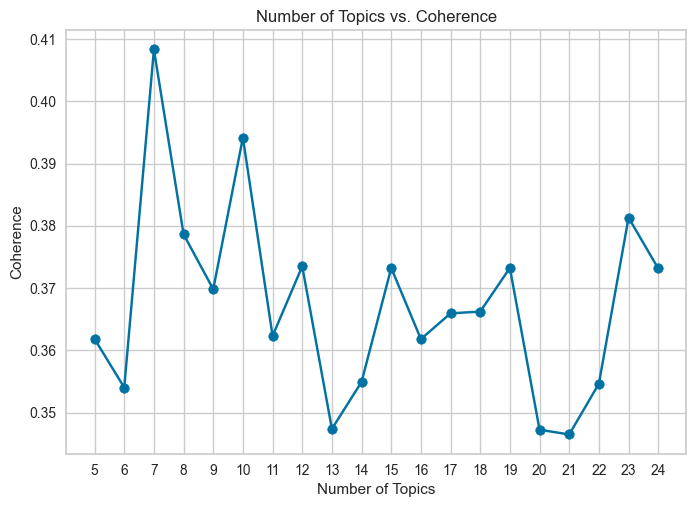

In [94]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_sa_pu.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [95]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [96]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.047774 -0.010185       1        1  16.195357
2      0.014165  0.039839       2        1  11.772486
22    -0.049356  0.070007       3        1   7.126373
21    -0.066004  0.056794       4        1   6.532431
20    -0.103065  0.004851       5        1   6.446697
19     0.148500 -0.005481       6        1   6.222566
6     -0.065819  0.030675       7        1   6.153500
17     0.023702  0.234043       8        1   5.203703
9     -0.046635  0.015294       9        1   4.247981
11     0.010928 -0.035472      10        1   3.602299
5      0.004001  0.039058      11        1   3.497363
3     -0.031892 -0.046678      12        1   3.225044
12     0.034181 -0.071030      13        1   2.306664
13     0.115905  0.009381      14        1   2.300774
1      0.027901  0.163427      15        1   2.272195
15    -0.034717 -0.027345      16        1   2.181323
16     0.264130 -0.044567      17        1   2.101433
10    -0.001671 -0.073726      18        1   2.010803
0     -0.068910 -0.032858      19        1   1.803428
18    -0.023619 -0.047833      20        1   1.748792
4     -0.062339 -0.055905      21        1   1.420940
8     -0.042914 -0.096608      22        1   1.074582
14     0.001302 -0.115680      23        1   0.553266, topic_info=                           Term         Freq        Total Category  logprob  \
45                            ’  1175.000000  1175.000000  Default  30.0000   
53                        cream   835.000000   835.000000  Default  29.0000   
562                    cleanser   353.000000   353.000000  Default  28.0000   
292                         eye   250.000000   250.000000  Default  27.0000   
323                       toner   331.000000   331.000000  Default  26.0000   
19                         skin  3164.000000  3164.000000  Default  25.0000   
651                     retinol   201.000000   201.000000  Default  24.0000   
673                      makeup   240.000000   240.000000  Default  23.0000   
40                      product  1284.000000  1284.000000  Default  22.0000   
190                         oil   208.000000   208.000000  Default  21.0000   
1183                       balm   109.000000   109.000000  Default  20.0000   
2136                 foundation   152.000000   152.000000  Default  19.0000   
1651                  cleansing   128.000000   128.000000  Default  18.0000   
228                       clean   180.000000   180.000000  Default  17.0000   
665                    centella   159.000000   159.000000  Default  16.0000   
18                        serum   613.000000   613.000000  Default  15.0000   
60                        great   456.000000   456.000000  Default  14.0000   
88                         face   619.000000   619.000000  Default  13.0000   
2133                   coverage   118.000000   118.000000  Default  12.0000   
80                         good   507.000000   507.000000  Default  11.0000   
65                         love   439.000000   439.000000  Default  10.0000   
662                      lotion   175.000000   175.000000  Default   9.0000   
13                         like   787.000000   787.000000  Default   8.0000   
1797                      patch    93.000000    93.000000  Default   7.0000   
267                      bottle   251.000000   251.000000  Default   6.0000   
104                        well   537.000000   537.000000  Default   5.0000   
2155                      shade    88.000000    88.000000  Default   4.0000   
48                          use   746.000000   746.000000  Default   3.0000   
58                         feel   658.000000   658.000000  Default   2.0000   
2654                        oat    89.000000    89.000000  Default   1.0000   
4185                          🔍    19.059754    19.918629   Topic1  -6.5334   
4180                      ⭐⭐⭐⭐⭐    23.807898    25.630005   Topic1  -6.3110   


In [97]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,skin,’,product,use,sensitive,using,help,barrier,dry,like
Topic 2,skin,serum,quickly,absorbs,sticky,feeling,without,product,leaving,greasy
Topic 3,skin,love,feel,nice,oily,moisturizing,moisturized,scent,like,face
Topic 4,foundation,coverage,shade,bb,cushion,match,color,look,finish,compact
Topic 5,’,product,moisturizer,skin,face,like,acne,use,much,day
Topic 6,retinol,bakuchiol,brand,korean,cream,bloom,timeless,excellent,hydrangea,serum
Topic 7,skin,’,face,feel,essence,using,help,serum,product,moisturizer
Topic 8,cleanser,clean,foam,panthenol,face,foaming,bamboo,gentle,skin,wash
Topic 9,using,skin,im,ive,like,toner,c,product,one,smell
Topic 10,toner,cotton,pad,thicker,skin,centella,ingredient,purito,200ml,care


## 브랜드별 진행(2점 이하)

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


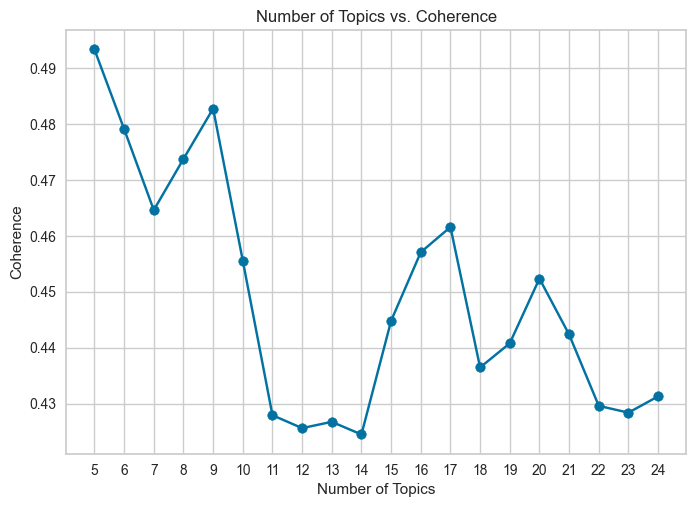

In [127]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_dsa.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
    dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [128]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [129]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# # lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,’,work,smell,product,like,skin,well,scent,use,put
Topic 2,oil,skin,pore,using,face,product,clogged,changed,mask,dont
Topic 3,skin,sensitive,break,oily,dry,broke,made,prone,bump,combination
Topic 4,cream,eye,face,red,skin,product,burn,day,used,sensitive
Topic 5,product,skin,side,dry,would,like,even,’,fragrance,look
Topic 6,’,using,allergic,reaction,month,week,difference,never,pimple,product
Topic 7,product,one,first,time,full,’,fake,buy,gon,scar
Topic 8,sunscreen,skin,feel,’,like,u,korean,dry,fda,greasy
Topic 9,bottle,empty,product,came,half,spilled,’,dropper,get,video
Topic 10,sticky,feel,like,leaf,’,thick,feeling,tacky,residue,lip


### Dr

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


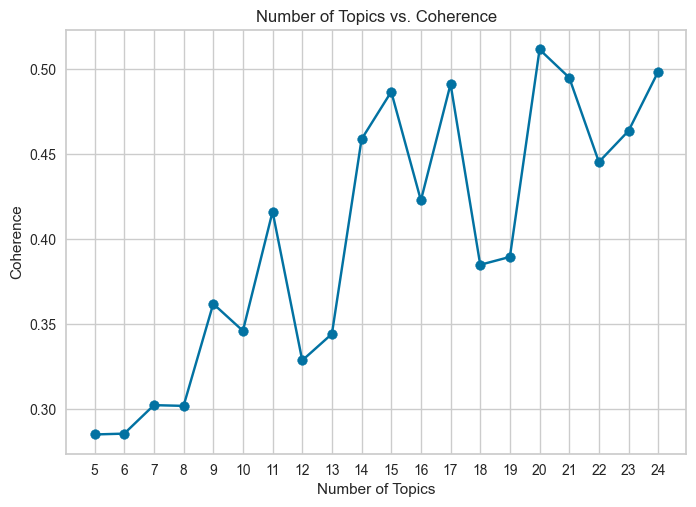

In [101]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_dr.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [102]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [103]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.062644  0.043437       1        1  11.079785
12    -0.133695 -0.010710       2        1   9.921222
8     -0.011357 -0.027212       3        1   9.508309
7     -0.037574  0.014780       4        1   7.648215
16    -0.078370  0.045888       5        1   7.270661
17    -0.074832 -0.123958       6        1   5.806658
15    -0.081117 -0.002546       7        1   5.654510
6     -0.142297  0.024603       8        1   5.088949
21    -0.076526  0.049569       9        1   4.944309
10    -0.117212  0.058516      10        1   4.855732
20     0.021879 -0.246177      11        1   4.461390
13    -0.003439  0.106136      12        1   4.362067
0      0.019934  0.017830      13        1   3.899282
11     0.176826  0.048490      14        1   2.881286
22     0.016425 -0.020316      15        1   2.731744
2      0.016583 -0.073368      16        1   2.347143
9      0.066524  0.001717      17        1   2.298500
19     0.098786  0.024997      18        1   1.883202
14     0.072230 -0.004478      19        1   1.069743
5      0.068176  0.025271      20        1   0.908187
4      0.070178  0.015908      21        1   0.725489
1      0.104178  0.018571      22        1   0.495163
18     0.087344  0.013051      23        1   0.158453, topic_info=                         Term       Freq      Total Category  logprob  loglift
43                          ’  75.000000  75.000000  Default  30.0000  30.0000
104                   product  69.000000  69.000000  Default  29.0000  29.0000
235                      mask  37.000000  37.000000  Default  28.0000  28.0000
63                       face  48.000000  48.000000  Default  27.0000  27.0000
318                       one  22.000000  22.000000  Default  26.0000  26.0000
27                       skin  75.000000  75.000000  Default  25.0000  25.0000
22                    redness  26.000000  26.000000  Default  24.0000  24.0000
7                       cover  17.000000  17.000000  Default  23.0000  23.0000
14                       like  40.000000  40.000000  Default  22.0000  22.0000
53                      color  17.000000  17.000000  Default  21.0000  21.0000
65                       feel  19.000000  19.000000  Default  20.0000  20.0000
9                        even  13.000000  13.000000  Default  19.0000  19.0000
181                     would  18.000000  18.000000  Default  18.0000  18.0000
312                  reaction   4.000000   4.000000  Default  17.0000  17.0000
123                    better  12.000000  12.000000  Default  16.0000  16.0000
145                       put  14.000000  14.000000  Default  15.0000  15.0000
234                      make  11.000000  11.000000  Default  14.0000  14.0000
275                     using   9.000000   9.000000  Default  13.0000  13.0000
470                ingredient   7.000000   7.000000  Default  12.0000  12.0000
40                       work  11.000000  11.000000  Default  11.0000  11.0000
69                       good  11.000000  11.000000  Default  10.0000  10.0000
252                    return   6.000000   6.000000  Default   9.0000   9.0000
164                        dr  13.000000  13.000000  Default   8.0000   8.0000
260                     broke   7.000000   7.000000  Default   7.0000   7.0000
261                   changed   6.000000   6.000000  Default   6.0000   6.0000
284                     never   7.000000   7.000000  Default   5.0000   5.0000
57                  corrector   8.000000   8.000000  Default   4.0000   4.0000
23                      right   7.000000   7.000000  Default   3.0000   3.0000
20                        red  12.000000  12.000000  Default   2.0000   2.0000
34                      tried  11.000000  11.000000  Default   1.0000   1.0000
826                  silicone   3.586959   4.227129   Topic1  -4.6412   2.0358
651                   someone   1.812735   2.452901   Topic1  -5.3236   1.8976


In [104]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,skin,like,feel,scent,silicone,toner,old,’,reason,one
Topic 2,skin,sensitive,face,mask,using,menthol,day,felt,gotten,wash
Topic 3,’,hand,buy,return,sure,hate,opened,current,jar,product
Topic 4,product,gave,started,peel,skincare,neutral,easy,break,wear,change
Topic 5,zit,stopped,changed,makeup,skin,rosacea,year,’,greasy,sensitive
Topic 6,elf,better,corrector,color,nice,product,slightly,sheet,redness,white
Topic 7,say,maybe,’,anything,bad,face,want,gon,wrong,match
Topic 8,even,may,work,cover,lot,’,well,clung,lighten,gal
Topic 9,doesnt,put,visible,definitely,clearly,work,got,underneath,gather,night
Topic 10,cover,product,worse,didnt,dr,redness,mine,crack,showed,cake


### Cs

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


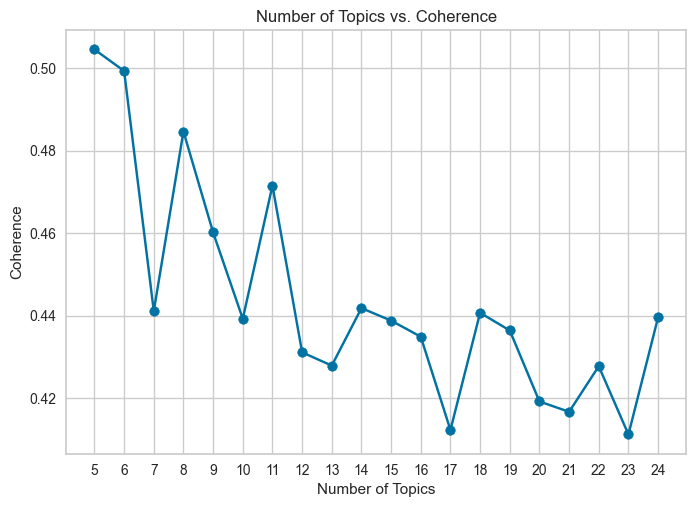

In [105]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_cs.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [106]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [107]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
8     -0.057259 -0.015961       1        1  7.228330
17     0.086046 -0.033558       2        1  6.944971
5     -0.029576 -0.120634       3        1  6.415361
16    -0.165873  0.118323       4        1  6.007081
14     0.071777 -0.056693       5        1  5.938652
18    -0.033457 -0.070816       6        1  5.917671
12    -0.026529  0.020332       7        1  5.746133
1     -0.060252 -0.022478       8        1  5.514085
11    -0.058229 -0.022026       9        1  4.746329
20    -0.048902 -0.009954      10        1  4.552490
6     -0.041050  0.041265      11        1  4.393797
2      0.214752  0.077416      12        1  4.264777
19     0.033153 -0.066760      13        1  4.079469
13     0.002812 -0.017562      14        1  3.750031
21    -0.009804  0.065811      15        1  3.341370
0     -0.054448 -0.062704      16        1  3.240930
7      0.048797  0.092382      17        1  3.087012
10     0.064414 -0.017943      18        1  3.085452
15     0.021231 -0.089865      19        1  3.055044
22    -0.057379  0.048078      20        1  2.954587
4      0.000337  0.084306      21        1  2.220511
9      0.041239  0.025922      22        1  1.894891
3      0.058198  0.033121      23        1  1.621027, topic_info=                   Term        Freq       Total Category  logprob  loglift
5                  skin  474.000000  474.000000  Default  30.0000  30.0000
24               bottle  136.000000  136.000000  Default  29.0000  29.0000
8                     ’  492.000000  492.000000  Default  28.0000  28.0000
110                work   91.000000   91.000000  Default  27.0000  27.0000
4             sensitive   69.000000   69.000000  Default  26.0000  26.0000
132               smell  122.000000  122.000000  Default  25.0000  25.0000
42                 like  242.000000  242.000000  Default  24.0000  24.0000
68                 made   76.000000   76.000000  Default  23.0000  23.0000
0                 break   47.000000   47.000000  Default  22.0000  22.0000
430              doesnt   33.000000   33.000000  Default  21.0000  21.0000
6                  time  116.000000  116.000000  Default  20.0000  20.0000
535               cream   60.000000   60.000000  Default  19.0000  19.0000
79                 acne   77.000000   77.000000  Default  18.0000  18.0000
49              product  502.000000  502.000000  Default  17.0000  17.0000
193                week   66.000000   66.000000  Default  16.0000  16.0000
12                 face  216.000000  216.000000  Default  15.0000  15.0000
72                 pore   35.000000   35.000000  Default  14.0000  14.0000
357                 dry   93.000000   93.000000  Default  13.0000  13.0000
1202              serum   54.000000   54.000000  Default  12.0000  12.0000
729              opened   37.000000   37.000000  Default  11.0000  11.0000
119          difference   40.000000   40.000000  Default  10.0000  10.0000
306               first   69.000000   69.000000  Default   9.0000   9.0000
80                  bad   67.000000   67.000000  Default   8.0000   8.0000
541                 eye   58.000000   58.000000  Default   7.0000   7.0000
911               patch   63.000000   63.000000  Default   6.0000   6.0000
191                 red   45.000000   45.000000  Default   5.0000   5.0000
174                 day   84.000000   84.000000  Default   4.0000   4.0000
212                love   72.000000   72.000000  Default   3.0000   3.0000
211               empty   24.000000   24.000000  Default   2.0000   2.0000
63            recommend   56.000000   56.000000  Default   1.0000   1.0000
814            outbreak    2.753800    3.570175   Topic1  -6.1898   2.3675
2398           headache    2.753796    3.570178   Topic1  -6.1898   2.3675
2219                pot    2.753674    3.570048   Topic1  -6.1899   2.3675
896                toss    2.753507    3.569891   Topic1  -6.1899   2.3675
2400   

In [108]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,face,later,skin,extremely,going,bump,try,time,using,get
Topic 2,product,’,received,box,item,bottle,missing,lid,patch,damaged
Topic 3,difference,product,pore,’,see,month,using,ever,seen,blackhead
Topic 4,skin,sensitive,break,made,dry,recommend,oily,broke,combination,wanted
Topic 5,’,brand,get,another,like,product,tube,packaging,thick,opening
Topic 6,’,pimple,go,greasy,feel,sunscreen,like,eye,skin,inflamed
Topic 7,skin,love,•,vit,bad,really,skincare,sunscreen,much,fast
Topic 8,red,day,side,spot,face,whitehead,serum,maybe,burning,saw
Topic 9,waste,nothing,money,skin,cream,’,like,big,buy,bought
Topic 10,use,skin,started,face,using,reaction,product,day,allergic,stopped


### Bj

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


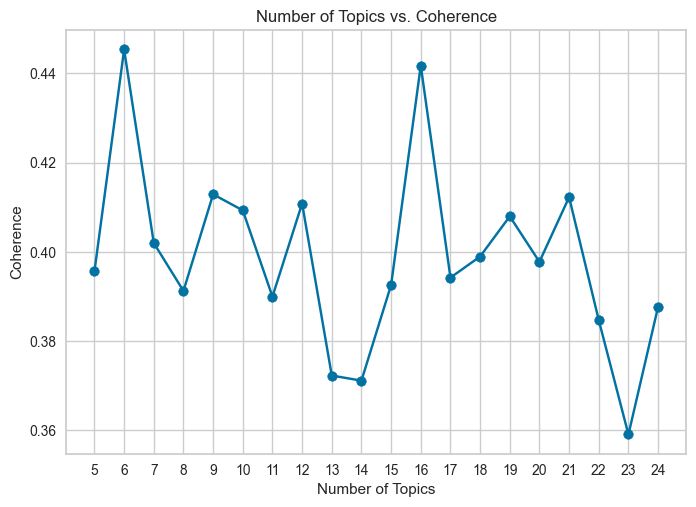

In [109]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_bj.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [110]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [111]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8     -0.066641 -0.066052       1        1  11.201027
13    -0.117527 -0.008097       2        1  10.793504
12    -0.090855 -0.023677       3        1   7.725632
5      0.057292 -0.074274       4        1   7.618006
21    -0.113210 -0.030514       5        1   5.618441
15     0.048343 -0.077571       6        1   5.079415
10    -0.067201  0.004043       7        1   5.001053
11    -0.045561 -0.090168       8        1   4.546590
14     0.064850 -0.136589       9        1   4.326483
4      0.006809 -0.044956      10        1   3.867619
19     0.153979 -0.029843      11        1   3.546509
2     -0.063135  0.060151      12        1   3.456468
9     -0.047751  0.082048      13        1   3.380784
16    -0.025870  0.017022      14        1   3.266950
17    -0.002745 -0.001845      15        1   3.111638
7      0.026447  0.043579      16        1   3.016312
20     0.036804 -0.000573      17        1   2.946906
22    -0.035047  0.048671      18        1   2.782769
3      0.077819 -0.019875      19        1   2.637014
1      0.029637  0.102994      20        1   1.997452
6      0.071651  0.097414      21        1   1.788927
18     0.062450  0.059321      22        1   1.731398
0      0.039463  0.088792      23        1   0.559102, topic_info=                   Term        Freq       Total Category  logprob  loglift
51                 skin  149.000000  149.000000  Default  30.0000  30.0000
47              product  136.000000  136.000000  Default  29.0000  29.0000
26                    ’  151.000000  151.000000  Default  28.0000  28.0000
128               smell   28.000000   28.000000  Default  27.0000  27.0000
36                 like   54.000000   54.000000  Default  26.0000  26.0000
0                  mask   25.000000   25.000000  Default  25.0000  25.0000
76                 made   26.000000   26.000000  Default  24.0000  24.0000
122                 one   42.000000   42.000000  Default  23.0000  23.0000
558                 eye   39.000000   39.000000  Default  22.0000  22.0000
6                  face   75.000000   75.000000  Default  21.0000  21.0000
202            reaction   21.000000   21.000000  Default  20.0000  20.0000
691           sunscreen   22.000000   22.000000  Default  19.0000  19.0000
253                work   30.000000   30.000000  Default  18.0000  18.0000
171                 use   49.000000   49.000000  Default  17.0000  17.0000
133               using   44.000000   44.000000  Default  16.0000  16.0000
45                 oily   15.000000   15.000000  Default  15.0000  15.0000
79                 time   39.000000   39.000000  Default  14.0000  14.0000
693              around   13.000000   13.000000  Default  13.0000  13.0000
1233            version   13.000000   13.000000  Default  12.0000  12.0000
71                 burn   12.000000   12.000000  Default  11.0000  11.0000
25                 used   41.000000   41.000000  Default  10.0000  10.0000
801                 oil   22.000000   22.000000  Default   9.0000   9.0000
816                area   14.000000   14.000000  Default   8.0000   8.0000
363              better   12.000000   12.000000  Default   7.0000   7.0000
213                 get   27.000000   27.000000  Default   6.0000   6.0000
60                  box   14.000000   14.000000  Default   5.0000   5.0000
578                 ive    8.000000    8.000000  Default   4.0000   4.0000
247               break   14.000000   14.000000  Default   3.0000   3.0000
11                 make   16.000000   16.000000  Default   2.0000   2.0000
113                good   24.000000   24.000000  Default   1.0000   1.0000
39                meant    2.714730    3.435539   Topic1  -5.4778   1.9537
999                seen    2.714721    3.435539   Topic1  -5.4778   1.9537
838               lower    1.822709    2.543518   Topic1  -5.8761   1.8559
378              afraid    1.822707    2.543516   Topic1 

In [112]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,’,product,rash,skin,made,many,horrible,work,mask,face
Topic 2,skin,’,face,product,really,use,like,felt,sensitive,sticky
Topic 3,description,face,burned,time,skin,arrived,soap,unit,10,product
Topic 4,skin,version,korean,formula,leak,’,opposite,day,u,oily
Topic 5,product,know,cream,eye,reaction,scent,bad,perfume,dissatisfied,current
Topic 6,toner,clenser,difference,much,order,purchased,wash,im,refund,different
Topic 7,within,instruction,eye,use,skin,retinal,europe,cystic,remember,around
Topic 8,’,list,product,coconut,pump,lily,serious,dishonest,peach,box
Topic 9,smell,makeup,like,product,’,waste,sunscreen,work,size,past
Topic 10,found,loved,’,amount,extreme,ideal,lid,originally,entirety,deeper


### If

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


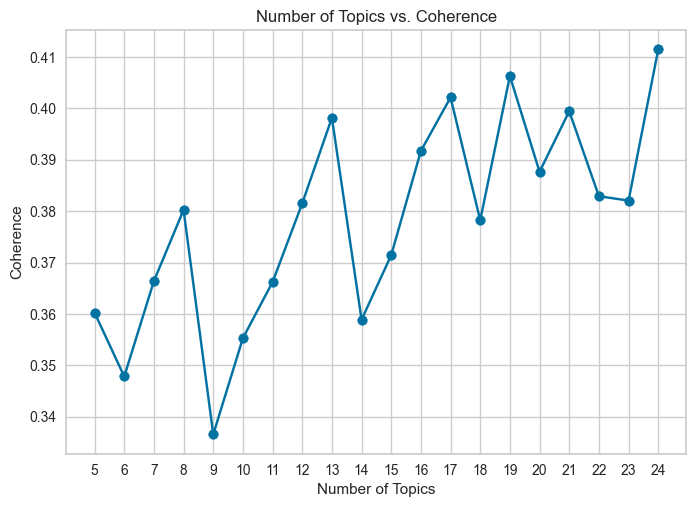

In [113]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_if.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [114]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=23, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(23, num_words=10, formatted=False)

In [115]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6      0.147138 -0.070920       1        1  16.483057
0      0.137384  0.015519       2        1  12.500924
3      0.137413  0.037157       3        1   9.391521
4      0.048871 -0.159695       4        1   6.822337
14     0.087558 -0.032698       5        1   6.511445
18     0.065896  0.004438       6        1   5.235814
16     0.079333 -0.041400       7        1   4.905221
7      0.042117  0.116860       8        1   4.381727
9      0.023195  0.029416       9        1   4.312076
1     -0.041044  0.065814      10        1   3.375129
20    -0.080869 -0.099379      11        1   3.165519
15    -0.031410  0.136313      12        1   3.161804
11     0.018419  0.060137      13        1   2.960291
10    -0.068101 -0.058009      14        1   2.847822
2      0.011958  0.019237      15        1   2.201512
8     -0.034607 -0.000054      16        1   1.957944
19    -0.033666  0.002510      17        1   1.860251
5     -0.060359  0.033171      18        1   1.754512
21    -0.079848  0.002755      19        1   1.554783
12    -0.120829 -0.029207      20        1   1.413662
22    -0.102029 -0.042886      21        1   1.349984
17    -0.082663 -0.000415      22        1   1.095842
13    -0.063856  0.011336      23        1   0.756824, topic_info=                           Term       Freq      Total Category  logprob  \
63                         skin  98.000000  98.000000  Default  30.0000   
55                            ’  72.000000  72.000000  Default  29.0000   
21                      product  95.000000  95.000000  Default  28.0000   
54                        using  27.000000  27.000000  Default  27.0000   
5                          like  48.000000  48.000000  Default  26.0000   
37                          box  12.000000  12.000000  Default  25.0000   
314                   sensitive  26.000000  26.000000  Default  24.0000   
155                         dry  19.000000  19.000000  Default  23.0000   
89                         used  23.000000  23.000000  Default  22.0000   
293                       money  11.000000  11.000000  Default  21.0000   
9                         scent  12.000000  12.000000  Default  20.0000   
249                        oily   8.000000   8.000000  Default  19.0000   
32                         feel  27.000000  27.000000  Default  18.0000   
169                      really  23.000000  23.000000  Default  17.0000   
178                         one  13.000000  13.000000  Default  16.0000   
156                        face  45.000000  45.000000  Default  15.0000   
0                          also  17.000000  17.000000  Default  14.0000   
23                          got  15.000000  15.000000  Default  13.0000   
64                        smell  20.000000  20.000000  Default  12.0000   
499                       price   7.000000   7.000000  Default  11.0000   
33                         good  22.000000  22.000000  Default  10.0000   
35                         mask  17.000000  17.000000  Default   9.0000   
73                         made  13.000000  13.000000  Default   8.0000   
56                        break  12.000000  12.000000  Default   7.0000   
104                       month   5.000000   5.000000  Default   6.0000   
368                  difference   6.000000   6.000000  Default   5.0000   
639                       toner  12.000000  12.000000  Default   4.0000   
145                        seal   6.000000   6.000000  Default   3.0000   
209                         see   9.000000   9.000000  Default   2.0000   
410                         say   4.000000   4.000000  Default   1.0000   
238                        woke   3.680659   4.323307   Topic1  -5.1096   
791                         eye   2.770365   3.413013   Topic1  -5.3937   
790                      doctor   1.860067   2.502714   Topic1  -5.7921   
234                       usual   1.860066   2.502714   T

In [ ]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,24): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')
# “	 ”  ’

,0,1,2,3,4,5,6,7,8,9
Topic 1,product,skin,like,’,face,sensitive,night,essence,mugwort,day
Topic 2,skin,really,get,try,using,work,left,use,product,like
Topic 3,allergic,product,face,sensitive,instruction,pollen,broke,skin,got,mask
Topic 4,skin,turned,returning,know,disgusting,spatula,color,fell,watery,used
Topic 5,sticky,first,small,toner,product,calming,hand,day,feel,last
Topic 6,jar,box,real,open,think,opened,order,skin,like,half
Topic 7,good,product,smell,bit,packaging,forehead,empty,torn,’,bottle
Topic 8,overall,im,water,full,buy,toner,scent,hydration,tried,tight
Topic 9,got,instead,description,upset,lol,face,bottom,read,get,month
Topic 10,scent,ginseng,powdery,floral,difficult,older,wish,returned,item,way


### Pu

Round: 5
Round: 6
Round: 7
Round: 8
Round: 9
Round: 10
Round: 11
Round: 12
Round: 13
Round: 14
Round: 15
Round: 16
Round: 17
Round: 18
Round: 19
Round: 20
Round: 21
Round: 22
Round: 23
Round: 24


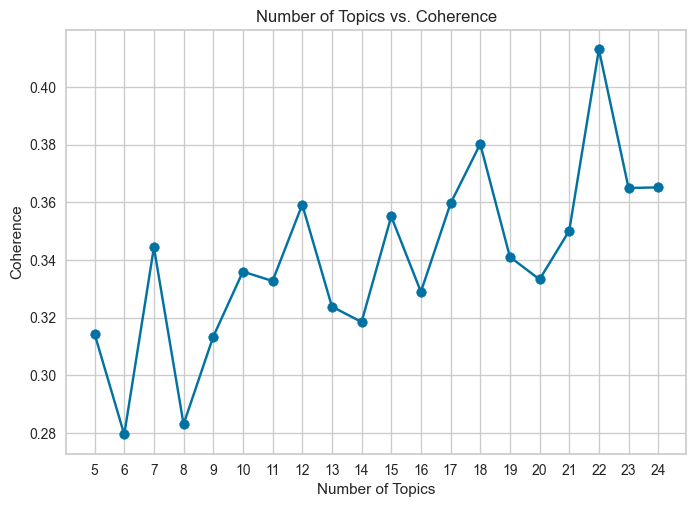

In [117]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_pu.lemmatized_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.lemmatized_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.lemmatized_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
for k in range(5,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                   iterations=200, chunksize = 10000, eval_every = None)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                     dictionary=dictionary, coherence='c_v')
    coherence.append((k,cm.get_coherence()))
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence')
plt.xticks(x_val)
plt.show()

In [125]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=15, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

Lda2 = gensim.models.ldamodel.LdaModel
ldamodel2 = Lda2(doc_term_matrix, num_topics=22, id2word = dictionary, passes=40,\
               iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

# To show initial topics
ldamodel.show_topics(15, num_words=10, formatted=False)

# To show initial topics
ldamodel2_topics = ldamodel2.show_topics(22, num_words=10, formatted=False)

In [126]:
# topic_data =  pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
# pyLDAvis.display(topic_data)

###################
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ 'v3_0129' +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
20     0.117361  0.019313       1        1  24.476922
5      0.121310 -0.018041       2        1  11.880492
21     0.100592 -0.005319       3        1   7.368423
11     0.071326  0.086761       4        1   6.470797
4      0.034475  0.014010       5        1   6.417815
9      0.104465  0.007505       6        1   5.763521
14     0.092232  0.012334       7        1   4.946490
13     0.016447 -0.247444       8        1   4.897893
12     0.040737  0.032225       9        1   4.187835
7      0.037157  0.055010      10        1   3.675113
2     -0.024286 -0.016765      11        1   2.894206
1     -0.078181  0.029842      12        1   2.652645
10    -0.059863  0.011842      13        1   2.317577
16     0.033472 -0.027650      14        1   2.126498
19    -0.038012  0.020006      15        1   2.057307
8     -0.066403  0.072708      16        1   1.700051
17    -0.017103 -0.046225      17        1   1.474715
0     -0.141041 -0.011273      18        1   1.150702
15    -0.044375  0.003582      19        1   1.138266
18    -0.068213  0.011497      20        1   0.936615
3     -0.105164 -0.009598      21        1   0.768760
6     -0.126932  0.005679      22        1   0.697356, topic_info=                  Term        Freq       Total Category  logprob  loglift
19                   ’  143.000000  143.000000  Default  30.0000  30.0000
13                skin  198.000000  198.000000  Default  29.0000  29.0000
11             product  136.000000  136.000000  Default  28.0000  28.0000
271              smell   42.000000   42.000000  Default  27.0000  27.0000
29                 one   31.000000   31.000000  Default  26.0000  26.0000
185               like   69.000000   69.000000  Default  25.0000  25.0000
56               using   43.000000   43.000000  Default  24.0000  24.0000
16                 use   38.000000   38.000000  Default  23.0000  23.0000
7           ingredient   32.000000   32.000000  Default  22.0000  22.0000
175               face   56.000000   56.000000  Default  21.0000  21.0000
124              itchy   14.000000   14.000000  Default  20.0000  20.0000
45                used   31.000000   31.000000  Default  19.0000  19.0000
283                bad   15.000000   15.000000  Default  18.0000  18.0000
60              bottle   28.000000   28.000000  Default  17.0000  17.0000
192                oil   25.000000   25.000000  Default  16.0000  16.0000
137              serum   19.000000   19.000000  Default  15.0000  15.0000
121                got   20.000000   20.000000  Default  14.0000  14.0000
131             purito   15.000000   15.000000  Default  13.0000  13.0000
199          sensitive   51.000000   51.000000  Default  12.0000  12.0000
104             caused   10.000000   10.000000  Default  11.0000  11.0000
412                put   13.000000   13.000000  Default  10.0000  10.0000
92         moisturizer   24.000000   24.000000  Default   9.0000   9.0000
190                new   14.000000   14.000000  Default   8.0000   8.0000
87               would   25.000000   25.000000  Default   7.0000   7.0000
24                 get   27.000000   27.000000  Default   6.0000   6.0000
285                  c    9.000000    9.000000  Default   5.0000   5.0000
96                time   33.000000   33.000000  Default   4.0000   4.0000
78                pore   17.000000   17.000000  Default   3.0000   3.0000
444      unfortunately   20.000000   20.000000  Default   2.0000   2.0000
71                 dry   38.000000   38.000000  Default   1.0000   1.0000
220             repair    3.787226    4.441502   Topic1  -5.9960   1.2481
486                wet    3.787225    4.441501   Topic1  -5.9960   1.2481
552               hand   10.340779   12.636021   Topic1  -4.9915   1.2070
513            jawline    2.850998    3.505273   Topic1  -6.2799   1.2008
1004           journey    1.914763    2.569038   Topic1  -6.6780   1.11

In [124]:


topic_data = LDAvis_prepared
all_topics = {}
num_terms = 10 # Adjust number of words to represent each topic
lambd = 0.6 # Adjust this accordingly based on tuning above
for i in range(1,23): #Adjust this to reflect number of topics chosen for final LDA model
    topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic'+str(i)].copy()
    topic['relevance'] = topic['loglift']*(1-lambd)+topic['logprob']*lambd
    all_topics['Topic '+str(i)] = topic.sort_values(by='relevance', ascending=False).Term[:num_terms].values
    
lda2_test_results = pd.DataFrame(all_topics).T
lda2_test_results
# lda2_test_results.to_csv(DATA_PATH+'lda3_test_results.csv', encoding='cp949')

,0,1,2,3,4,5,6,7,8,9
Topic 1,’,skin,sensitive,cream,work,face,acne,product,hand,dry
Topic 2,product,skin,like,’,face,light,brand,look,also,something
Topic 3,ingredient,skin,pore,would,product,like,dont,fact,buying,smell
Topic 4,skin,review,try,bump,filled,tingled,painful,partially,upon,super
Topic 5,apply,day,unless,odor,crazy,repurchasing,strangely,throwing,elimination,waste
Topic 6,skin,redness,sensitive,cleansing,product,due,blackhead,feel,burning,made
Topic 7,seen,skin,using,product,handling,shipping,ounce,layering,consider,bottle
Topic 8,sponge,wrinkle,refill,included,foundation,puff,bacteria,empty,packaging,pore
Topic 9,2023,product,explanation,kit,july,english,developed,buy,size,noticed
Topic 10,skin,’,turn,customer,put,oxidized,away,returning,applied,fungal
